# XWAS: LBD (path + clin) vs. Controls (DementiaSeq, Wellderly, LNG) 

**Start date:** 07-27-2020

**Updated date:** 2024-01-10

**Author(s):** Ruth Chia

**Working directory on biowulf:** `/data/ALS_50k/DementiaSeq.TopmedJointCalled.June2020/LBD/Analysis.XWAS_GLM`

In [1]:
!pwd

/vf/users/ALS_50k/DementiaSeq.TopmedJointCalled.June2020/LBD/Analysis.XWAS_GLM


## ***NEW 06-02-2023:*** Run XWAS using plink (adjusting for autosomal PCs)

faster to run GLM using plink2 option of --glm  and --xchr-model2 and will run separately for males and females, and as a whole.

Note that the covariate file contains PCs generated only from autosomal chromosomes. 

The step() function was ran in another notebook to determine which covariate to adjust for. Refer to: `/data/ALS_50k/DementiaSeq.TopmedJointCalled.June2020/LBD/Analysis.XWAS_GLM/2024-01-10_Readme.QC.LBD.4Kcontrols.clean-rerun_CLEAN_FINAL.ipynb`. Note that the covariate file contains PCs generated only from autosomal chromosomes.

In [ ]:
!cp -r /data/ALS_50k/DementiaSeq_LBD/XWAS_LBD.unrelated/scripts/XWAS_v3.0 ./scripts/

Covariate file to use: `/data/ALS_50k/DementiaSeq.TopmedJointCalled.June2020/LBD/Analysis.GLM/GLM.LBD.4Kcontrols/COVARIATES.freeze9.LBD.controls.UNRELATED.txt`

Original covariate adjusted: 
- females (Step:  AIC=3539.79): `CONSENSUS_AGE,PC1,PC2,PC3,PC4,PC10`
- males (Step:  AIC=4774.07): `CONSENSUS_AGE,PC1,PC2,PC3,PC4,PC5,PC6,PC7`
- both (Step:  AIC=8326.24): `GENDER,CONSENSUS_AGE,PC1,PC3,PC4,PC6`
- cases (Step:  AIC=3289.92): `CONSENSUS_AGE,PC2,PC4`


### **glm:** females + males

In [ ]:
%%bash
#mkdir both

module load plink/3.6-alpha

DIR="/data/ALS_50k/DementiaSeq.TopmedJointCalled.June2020/LBD/Analysis.XWAS"

plink2 \
--bfile $DIR/merged.clean/FINAL.QC.males.females.noPAR.chrX \
--xchr-model 2 \
--pheno-name AFFECTION_STATUS \
--pheno COVARIATES.freeze9.LBD.controls.UNRELATED_clean.updated_covs.txt \
--glm no-x-sex firth-fallback interaction cols=+a1freq,+a1freqcc,+a1count,+totallele,+a1countcc,+totallelecc,+err \
--parameters 1-9 \
--covar COVARIATES.freeze9.LBD.controls.UNRELATED_clean.updated_covs.txt \
--covar-name CONSENSUS_AGE,SEX,PC1,PC2,PC3,PC4,PC6 \
--covar-variance-standardize \
--out both/intrxn.LBD.controls.UNRELATED.chrX \
--threads 32

In [ ]:
%%bash
#mkdir both

module load plink/3.6-alpha

DIR="/data/ALS_50k/DementiaSeq.TopmedJointCalled.June2020/LBD/Analysis.XWAS"

plink2 \
--bfile $DIR/merged.clean/FINAL.QC.males.females.noPAR.chrX \
--xchr-model 2 \
--pheno-name AFFECTION_STATUS \
--pheno COVARIATES.freeze9.LBD.controls.UNRELATED_clean.updated_covs.txt \
--glm firth-fallback cols=+a1freq,+a1freqcc,+a1count,+totallele,+a1countcc,+totallelecc,+err \
--covar COVARIATES.freeze9.LBD.controls.UNRELATED_clean.updated_covs.txt \
--covar-name CONSENSUS_AGE,PC1,PC2,PC3,PC4,PC6 \
--covar-variance-standardize \
--out both/LBD.controls.UNRELATED.chrX \
--threads 32

In [ ]:
!cat both/LBD.controls.UNRELATED.chrX.log

### **glm:** females only

In [ ]:
%%bash
#mkdir females_only

module load plink/3.6-alpha

DIR="/data/ALS_50k/DementiaSeq.TopmedJointCalled.June2020/LBD/Analysis.XWAS"

plink2 \
--bfile $DIR/merged.clean/FINAL.QC.males.females.noPAR.chrX \
--keep-females \
--xchr-model 2 \
--pheno-name AFFECTION_STATUS \
--pheno COVARIATES.freeze9.LBD.controls.UNRELATED.females_clean.updated_covs.txt \
--glm firth-fallback cols=+a1freq,+a1freqcc,+a1count,+totallele,+a1countcc,+totallelecc,+err \
--covar COVARIATES.freeze9.LBD.controls.UNRELATED.females_clean.updated_covs.txt \
--covar-name CONSENSUS_AGE,PC1,PC2,PC3,PC4 \
--covar-variance-standardize \
--out females_only/LBD.controls.UNRELATED.females.chrX \
--threads 32

### **glm:** males only

In [ ]:
%%bash
#mkdir males_only

module load plink/3.6-alpha

DIR="/data/ALS_50k/DementiaSeq.TopmedJointCalled.June2020/LBD/Analysis.XWAS"

plink2 \
--bfile $DIR/merged.clean/FINAL.QC.males.females.noPAR.chrX \
--keep-males \
--xchr-model 2 \
--pheno-name AFFECTION_STATUS \
--pheno COVARIATES.freeze9.LBD.controls.UNRELATED.males_clean.updated_covs.txt \
--glm firth-fallback cols=+a1freq,+a1freqcc,+a1count,+totallele,+a1countcc,+totallelecc,+err \
--covar COVARIATES.freeze9.LBD.controls.UNRELATED.males_clean.updated_covs.txt \
--covar-name CONSENSUS_AGE,PC1,PC2,PC3,PC4,PC5,PC6,PC7 \
--covar-variance-standardize \
--out males_only/LBD.controls.UNRELATED.males.chrX \
--threads 32

## ***NEW 12-07-2023:*** Run XWAS using plink (adjusting for x-chromosome PCs)

faster to run GLM using plink2 option of --glm  and --xchr-model2 and will run separately for males and females, and as a whole.

note that the genetic PCs from this section were generated from X chromosome.

The step() function was ran in another notebook to determine which covariate to adjust for. Refer to: `/data/ALS_50k/DementiaSeq.TopmedJointCalled.June2020/LBD/Analysis.XWAS_GLM/2024-01-10_Readme.QC.LBD.4Kcontrols.clean-rerun_CLEAN_FINAL.ipynb`. Note that the covariate file contains PCs generated only from autosomal chromosomes.

Covariate to be adjusted: 
- females (Step:  AIC=3681.74): `CONSENSUS_AGE,PC1,PC2,PC8`
- males (Step:  AIC=4923.8): `CONSENSUS_AGE,PC1,PC3,PC6,PC7,PC9`
- both (Step:  AIC=8610.92): `GENDER,CONSENSUS_AGE,PC1,PC2,PC5,PC6`

### glm: females + males

In [ ]:
%%bash
#mkdir both_x-pc

module load plink/3.6-alpha

DIR="/data/ALS_50k/DementiaSeq.TopmedJointCalled.June2020/LBD/Analysis.XWAS"

plink2 \
--bfile $DIR/merged.clean/FINAL.QC.males.females.noPAR.chrX \
--xchr-model 2 \
--pheno-name AFFECTION_STATUS \
--pheno COVARIATES.freeze9.LBD.controls.UNRELATED_clean.updated_covs_using_x-PCs.txt \
--glm firth-fallback cols=+a1freq,+a1freqcc,+a1count,+totallele,+a1countcc,+totallelecc,+err \
--covar COVARIATES.freeze9.LBD.controls.UNRELATED_clean.updated_covs_using_x-PCs.txt \
--covar-name CONSENSUS_AGE,PC1,PC2,PC5,PC6 \
--covar-variance-standardize \
--out both_x-pc/LBD.controls.UNRELATED.chrX \
--threads 32

### glm: females only

In [ ]:
%%bash
#mkdir females_only_x-pc

module load plink/3.6-alpha

DIR="/data/ALS_50k/DementiaSeq.TopmedJointCalled.June2020/LBD/Analysis.XWAS"

plink2 \
--bfile $DIR/merged.clean/FINAL.QC.males.females.noPAR.chrX \
--keep-females \
--xchr-model 2 \
--pheno-name AFFECTION_STATUS \
--pheno COVARIATES.freeze9.LBD.controls.UNRELATED.females_clean.updated_covs_using_x-PCs.txt \
--glm firth-fallback cols=+a1freq,+a1freqcc,+a1count,+totallele,+a1countcc,+totallelecc,+err \
--covar COVARIATES.freeze9.LBD.controls.UNRELATED.females_clean.updated_covs_using_x-PCs.txt \
--covar-name CONSENSUS_AGE,PC1,PC2,PC8 \
--covar-variance-standardize \
--out females_only_x-pc/LBD.controls.UNRELATED.females.chrX \
--threads 32

### glm: males only

In [ ]:
%%bash
#mkdir males_only_x-pc

module load plink/3.6-alpha

DIR="/data/ALS_50k/DementiaSeq.TopmedJointCalled.June2020/LBD/Analysis.XWAS"

plink2 \
--bfile $DIR/merged.clean/FINAL.QC.males.females.noPAR.chrX \
--keep-males \
--xchr-model 2 \
--pheno-name AFFECTION_STATUS \
--pheno COVARIATES.freeze9.LBD.controls.UNRELATED.males_clean.updated_covs_using_x-PCs.txt \
--glm firth-fallback cols=+a1freq,+a1freqcc,+a1count,+totallele,+a1countcc,+totallelecc,+err \
--covar COVARIATES.freeze9.LBD.controls.UNRELATED.males_clean.updated_covs_using_x-PCs.txt \
--covar-name CONSENSUS_AGE,PC1,PC3,PC6,PC7,PC9 \
--covar-variance-standardize \
--out males_only_x-pc/LBD.controls.UNRELATED.males.chrX \
--threads 32

## ***NEW 12-21-2023:*** Run XWAS using plink (adjusting for merged x-autosomal-chromosome PCs)

faster to run GLM using plink2 option of --glm  and --xchr-model2 and will run separately for males and females, and as a whole.

note that the genetic PCs from this section were generated from X chromosome.

The step() function was ran in another notebook to determine which covariate to adjust for. Refer to: `/data/ALS_50k/DementiaSeq.TopmedJointCalled.June2020/LBD/Analysis.XWAS_GLM/2024-01-10_Readme.QC.LBD.4Kcontrols.clean-rerun_CLEAN_FINAL.ipynb`. Note that the covariate file contains PCs generated only from autosomal chromosomes.

Covariate to be adjusted: 
- females (Step:  AIC=3572.94): `CONSENSUS_AGE,PC1,PC2,PC3,PC4`
- males (Step:  AIC=4793.64): `CONSENSUS_AGE,PC1,PC2,PC3,PC4,PC5`
- both (Step:  AIC=8301.4): `GENDER,CONSENSUS_AGE,PC1,PC3,PC4,PC5,PC7`

### glm: females + males

In [ ]:
%%bash
mkdir both_x-autosomal-pc

module load plink/3.6-alpha

DIR="/data/ALS_50k/DementiaSeq.TopmedJointCalled.June2020/LBD/Analysis.XWAS"

plink2 \
--bfile $DIR/merged.clean/FINAL.QC.males.females.noPAR.chrX \
--xchr-model 2 \
--pheno-name AFFECTION_STATUS \
--pheno COVARIATES.freeze9.LBD.controls.UNRELATED_clean.updated_covs_using_x-autosomal-PCs.txt \
--glm firth-fallback cols=+a1freq,+a1freqcc,+a1count,+totallele,+a1countcc,+totallelecc,+err \
--covar COVARIATES.freeze9.LBD.controls.UNRELATED_clean.updated_covs_using_x-autosomal-PCs.txt \
--covar-name CONSENSUS_AGE,PC1,PC3,PC4,PC5,PC7 \
--covar-variance-standardize \
--out both_x-autosomal-pc/LBD.controls.UNRELATED.chrX \
--threads 32

### glm: females only

In [ ]:
%%bash
mkdir females_only_x-autosomal-pc

module load plink/3.6-alpha

DIR="/data/ALS_50k/DementiaSeq.TopmedJointCalled.June2020/LBD/Analysis.XWAS"

plink2 \
--bfile $DIR/merged.clean/FINAL.QC.males.females.noPAR.chrX \
--keep-females \
--xchr-model 2 \
--pheno-name AFFECTION_STATUS \
--pheno COVARIATES.freeze9.LBD.controls.UNRELATED.females_clean.updated_covs_using_x-autosomal-PCs.txt \
--glm firth-fallback cols=+a1freq,+a1freqcc,+a1count,+totallele,+a1countcc,+totallelecc,+err \
--covar COVARIATES.freeze9.LBD.controls.UNRELATED.females_clean.updated_covs_using_x-autosomal-PCs.txt \
--covar-name CONSENSUS_AGE,PC1,PC2,PC3,PC4 \
--covar-variance-standardize \
--out females_only_x-autosomal-pc/LBD.controls.UNRELATED.females.chrX \
--threads 32

### glm: males only

In [ ]:
%%bash
mkdir males_only_x-autosomal-pc

module load plink/3.6-alpha

DIR="/data/ALS_50k/DementiaSeq.TopmedJointCalled.June2020/LBD/Analysis.XWAS"

plink2 \
--bfile $DIR/merged.clean/FINAL.QC.males.females.noPAR.chrX \
--keep-males \
--xchr-model 2 \
--pheno-name AFFECTION_STATUS \
--pheno COVARIATES.freeze9.LBD.controls.UNRELATED.males_clean.updated_covs_using_x-autosomal-PCs.txt \
--glm firth-fallback cols=+a1freq,+a1freqcc,+a1count,+totallele,+a1countcc,+totallelecc,+err \
--covar COVARIATES.freeze9.LBD.controls.UNRELATED.males_clean.updated_covs_using_x-autosomal-PCs.txt \
--covar-name CONSENSUS_AGE,PC1,PC2,PC3,PC4,PC5 \
--covar-variance-standardize \
--out males_only_x-autosomal-pc/LBD.controls.UNRELATED.males.chrX \
--threads 32

### Reformat summ stats

script to prep file for meta analysis: `/data/ALS_50k/DementiaSeq.TopmedJointCalled.June2020/LBD/Analysis.XWAS_GLM/toMetaprep.glm.updated.XWAS.R`

```R
#!/usr/bin/env Rscript

args <- commandArgs(trailingOnly=TRUE)
if (length(args) != 2) {
  stop("USAGE: Rscript toMetaprep.glm.updated.XWAS.R args[1] args[2]
  where args[1] = glm_results
        args[2] = OutputFileName")
}

require(data.table)
require(tidyverse)
data <- fread(args[1],header=T) %>% filter(TEST == "ADD")

# Reformat
data$A2 <- ifelse(data$A1 == data$ALT, data$REF, data$ALT)
data$EffectAllele <- ifelse(data$A1_FREQ < 0.5, data$A1, data$A2)
data$OtherAllele <- ifelse(data$A1_FREQ < 0.5, data$A2, data$A1)
data$BETA <- ifelse(data$EffectAllele == data$A1, log(data$OR), log(data$OR)*-1)
data$SE <- data$`LOG(OR)_SE`

## freq
data$Freq_EffectAllele <- ifelse(data$EffectAllele == data$A1, data$A1_FREQ, 1-data$A1_FREQ)
data$Freq_EffectAllele.CASE <- ifelse(data$EffectAllele == data$A1, data$A1_CASE_FREQ, 1-data$A1_CASE_FREQ)
data$Freq_EffectAllele.CTRL <- ifelse(data$EffectAllele == data$A1, data$A1_CTRL_FREQ, 1-data$A1_CTRL_FREQ)

## counts
data$EffectAllele_CT <- ifelse(data$EffectAllele == data$A1, data$A1_CT, data$ALLELE_CT-data$A1_CT)
data$EffectAllele_CT.CASE <- ifelse(data$EffectAllele == data$A1, data$A1_CASE_CT, data$CASE_ALLELE_CT-data$A1_CASE_CT)
data$EffectAllele_CT.CTRL <- ifelse(data$EffectAllele == data$A1, data$A1_CTRL_CT, data$CTRL_ALLELE_CT-data$A1_CTRL_CT)

data$marker <- paste(data$`#CHROM`,data$POS,data$OtherAllele,data$EffectAllele,sep=":")
data1 <- data %>% rename(CHROM = `#CHROM`) %>% 
         select(CHROM,POS,ID,marker,EffectAllele,OtherAllele,
                OR,BETA,SE,P,Freq_EffectAllele,Freq_EffectAllele.CASE,Freq_EffectAllele.CTRL,
                ALLELE_CT,CASE_ALLELE_CT,CTRL_ALLELE_CT,
                EffectAllele_CT,EffectAllele_CT.CASE,EffectAllele_CT.CTRL) %>%
         filter(BETA > -5 & BETA < 5) %>%
         filter(!is.na(BETA))
         
dups <- data1 %>% select(marker,P) %>% filter(marker == duplicated(marker))
temp1 <- subset(data1, data1$marker %in% dups$marker) %>%
         group_by(marker) %>%
         filter(P == min(P)) %>%
         data.frame()
temp2 <- subset(data1, !(data1$marker %in% temp1$marker))
data2 <- rbind(temp1,temp2) %>% arrange(CHROM,POS)

write.table(data2, file=paste("toMeta.",args[2],".tab", sep=""), quote = F, sep = "\t", row.names = F)
```

In [ ]:
%%bash
module load R/4.3

DIR="/data/ALS_50k/DementiaSeq.TopmedJointCalled.June2020/LBD/Analysis.XWAS_GLM"

cd $DIR/both_x-autosomal-pc
Rscript $DIR/toMetaprep.glm.updated.XWAS.R LBD.controls.UNRELATED.chrX.AFFECTION_STATUS.glm.logistic.hybrid LBD.controls.UNRELATED.hg38.chrX

cd $DIR/females_only_x-autosomal-pc
Rscript $DIR/toMetaprep.glm.updated.XWAS.R LBD.controls.UNRELATED.females.chrX.AFFECTION_STATUS.glm.logistic.hybrid LBD.controls.UNRELATED.females.hg38.chrX

cd $DIR/males_only_x-autosomal-pc
Rscript $DIR/toMetaprep.glm.updated.XWAS.R LBD.controls.UNRELATED.males.chrX.AFFECTION_STATUS.glm.logistic.hybrid LBD.controls.UNRELATED.males.hg38.chrX

## ***NEW 12-29-2023:*** Plot results

### GWAS (from autosomal PCs corrected anaysis)

In [ ]:
%%bash

echo "Number of cases and controls included in analysis"
awk '{if($8 != "NA") print}' OFS="\t" COVARIATES.freeze9.LBD.controls.UNRELATED_clean.updated_covs.txt | cut -f5 | sort | uniq -c

echo "Sex break down in controls"
awk '{if($8 != "NA" && $4 == "1") print}' OFS="\t" COVARIATES.freeze9.LBD.controls.UNRELATED_clean.updated_covs.txt | cut -f3 | sort | uniq -c

echo "Sex break down in cases"
awk '{if($8 != "NA" && $4 == "2") print}' OFS="\t" COVARIATES.freeze9.LBD.controls.UNRELATED_clean.updated_covs.txt | cut -f3 | sort | uniq -c

Run script to plot qq and manhattan (filter by maf cases): `/data/ALS_50k/DementiaSeq.TopmedJointCalled.June2020/LBD/Analysis.XWAS_GLM/QQ_manhattan_plots_GLMresults.FromImputed.FilterMAFoverall.chrX_updatedMay2023.R`

```R
#!/usr/bin/env Rscript

# read command line
args <- commandArgs(trailingOnly=TRUE)
if (length(args) != 5) {
    stop("USAGE: Rscript QQ_manhattan_plots_GLMresults.FromImputed.R toMetaFile NumberOfCases NumberOfControls OutputName MAFcutoff")
}

# Load in required libraries
library(tidyverse)
library(stringr)
library("ggrepel")
require("data.table")


# set variables
glm <- args[1]
NoCases <- as.numeric(args[2])
NoControls <- as.numeric(args[3])
OutputName <- args[4]
MAFcutoff <- args[5]


# Read in GLM result file
print("Reading in glm files and filtering MAF")
data0 <- fread(glm,header=T)
colnames(data0)[1] <- "CHROM"
data <- subset(data0, data0$A1_FREQ > as.numeric(MAFcutoff) &
                      data0$A1_FREQ < (1-as.numeric(MAFcutoff))) %>%
        filter(TEST == "ADD") %>%
        filter(P != is.na(P)) %>%
        mutate(BETA = log(OR)) %>%
        filter(BETA > -5 & BETA < 5) %>%
        filter(!is.na(BETA))

#data <- subset(data0, data0$A1_CASE_FREQ > as.numeric(MAFcutoff) &
#                     data0$A1_CASE_FREQ < (1-as.numeric(MAFcutoff)) | 
#                     data0$A1_CTRL_FREQ > as.numeric(MAFcutoff) &
#                     data0$A1_CTRL_FREQ < (1-as.numeric(MAFcutoff))) %>%
#        filter(TEST == "ADD") %>%
#        filter(P != is.na(P)) %>%
#        mutate(BETA = log(OR)) %>%
#        filter(BETA > -5 & BETA < 5) %>%
#        filter(!is.na(BETA))

# set name for plot name and outputfile
OutputFileName = paste(OutputName, ".maf", MAFcutoff, "overall.hg38.xchrmodel2.glm",sep="")

# Calculate lambda(raw) and lambda(1000)
print("Calculating lambda")
p1 <- data$P
n1 <- length(data$P)
x2obs_1 <- qchisq(as.numeric(as.character(p1)), 1, lower.tail = FALSE)
x2exp_1 <- qchisq((1:n1)/n1, 1, lower.tail = FALSE)
lambda <- median(x2obs_1)/median(x2exp_1)
print(paste("Lambda(raw) = ", lambda, sep = ""))
lambda1000 <- 1 + ( lambda -1 ) * (1/NoCases + 1/NoControls)/(1/1000 + 1/1000)
print(paste("Lambda(1000) = ", lambda1000, sep = ""))

# Graph QQ plot
if(!require(qqman)){
    install.packages("qqman")
    library(qqman)
}

print("Graphing QQ plot")
jpeg(paste(OutputFileName,".QQ.jpeg", sep = ""))
qq(data$P, main = paste("QQ-plot: \n", OutputFileName,"\n(",NoCases," cases, ",NoControls," controls)", sep = ""), sub = bquote(lambda ~ '=' ~ .(signif(lambda, 4)) ~~ lambda[1000] ~ '=' ~.(signif(lambda1000, 4))), cex.lab=1.2, cex.axis=1.2, font.lab=2, font.axis=2, lwd=1.3, ylim = c(0,ceiling(-log10(min(data$P)))))
dev.off()

# set threshold based on calculated blocks on chr X
cutoff <- -log10(0.05/6296)
print(paste("Number of haploblocks = ", 6296, sep=""))
print(paste("P threshold = ", 0.05/6296, sep=""))
print(paste("-log10(P) threshold = ", cutoff, sep=""))

# Prepare data for manhattan plot
don <- data %>%
## Compute chromosome size
group_by(CHROM) %>%
summarise(chr_len=max(POS)) %>%
## Calculate cumulative position of each chromosome
mutate(tot=cumsum(as.numeric(chr_len))-chr_len) %>%
select(-chr_len) %>%
## Add this info to the initial dataset
left_join(data, ., by=c("CHROM"="CHROM")) %>%
## Add a cumulative position of each SNP
arrange(CHROM, POS) %>%
mutate( BPcum=POS+tot)  %>%
## Add highlight and annotation information
mutate( is_highlight_sig=ifelse(-log10(P)>=cutoff, "yes", "no")) %>%
mutate( is_highlight_subsig=ifelse(-log10(P)>=cutoff-1, "yes", "no")) %>%
mutate( is_annotate=ifelse(-log10(P)>=cutoff-1, "yes", "no"))

# Prepare axis split by chrom
axisdf = don %>% group_by(CHROM) %>% summarize(center=( max(BPcum) + min(BPcum) ) / 2 )

# Setting axis limits - such that it will always be in increment of 5 on the y-axis
library(plyr)
#y_max = round_any(ceiling(-log10(min(don$P)))+1, 5, f = ceiling)
y_max = 7
detach("package:plyr", unload=TRUE)

print("Graphing Manhattan plots")
# Graph manhattan plot i.e. plot_v0 = without label; plot_v1 = with labels
plot_v0 <- ggplot(don, aes(x=BPcum, y=-log10(P))) +
## Show all points
geom_point( aes(color=as.factor(CHROM)),alpha =0.7,size=1) +
scale_color_manual(values = rep(c("grey", "#0072B2"), 22 )) +
scale_alpha_manual(guide='none', values = list("FALSE" = 0.8, "TRUE" = 0.2)) +
## custom axis:
scale_x_continuous( label = axisdf$CHROM, breaks= axisdf$center ) +
scale_y_continuous(limits = c(0,y_max), breaks = seq(0, y_max), expand = c(0, 0) ) +     ## remove space between plot area and x axis
## custom axis title or label
ggtitle(paste("Manhattan Plot:\n",OutputFileName,"\n(",NoCases," cases, ",NoControls," controls)", sep="")) +
theme(plot.title = element_text(face = "bold", size = 3)) +
xlab("Chromosome") +
## Add highlighted points and draw significant line
geom_point(data=subset(don, is_highlight_subsig=="yes"), color="#e69f00", size=1) +
geom_point(data=subset(don, is_highlight_sig=="yes"), color="red", size=1) +
geom_hline(yintercept = cutoff, linetype = "dotted", color = "darkorange3", size = 0.25) +
## Add label using ggrepel to avoid overlapping
## geom_label_repel( data=subset(don[don$CHROM != 19,], is_annotate=="yes"), aes(x=BPcum,y=-log10(P),label=markerID), size=1.8, nudge_x=0.06, nudge_y=0.06, min.segment.length = 0.05, label.padding=0.1, fill = "NA", label.size=NA, segment.size  = 0.2, segment.colour = "gray50") +
## Custom the theme:
theme_bw() +
theme( legend.position="none",
panel.border = element_blank(),
panel.grid.major.x = element_blank(),
panel.grid.minor.x = element_blank(),
panel.grid.major.y = element_blank(),
panel.grid.minor.y = element_blank(),
axis.line.y = element_line(colour = "black",size = 0.5)
)

plot_v1 <- ggplot(don, aes(x=BPcum, y=-log10(P))) +
## Show all points
geom_point( aes(color=as.factor(CHROM)),alpha=0.7,size=1) +
scale_color_manual(values = rep(c("grey", "#0072B2"), 22 )) +
#scale_alpha_manual(guide='none', values = list("FALSE" = 0.8, "TRUE" = 0.05)) +
## custom axis:
scale_x_continuous( label = axisdf$CHROM, breaks= axisdf$center ) +
scale_y_continuous(limits = c(0,y_max), breaks = seq(0, y_max), expand = c(0, 0) ) +     ## remove space between plot area and x axis
## custom axis title or label
ggtitle(paste("Manhattan Plot:\n",OutputFileName,"\n(",NoCases," cases, ",NoControls," controls)", sep="")) +
theme(plot.title = element_text(face = "bold", size = 3)) +
xlab("Chromosome") +
## Add highlighted points and draw significant line
geom_point(data=subset(don, is_highlight_subsig=="yes"), color="#e69f00", size=1) +
geom_point(data=subset(don, is_highlight_sig=="yes"), color="red", size=1) +
geom_hline(yintercept = cutoff, linetype = "dotted", color = "darkorange3", size = 0.25) +
## Add label using ggrepel to avoid overlapping
geom_label_repel( data=subset(don[don$CHROM != 19,], is_annotate=="yes"), aes(x=BPcum,y=-log10(P),label=ID), size=1.8, nudge_x=0.06, nudge_y=0.06, min.segment.length = 0.05, label.padding=0.1, fill = "NA", label.size=NA, segment.size  = 0.2, segment.colour = "gray50") +
## Custom the theme:
theme_bw() +
theme( legend.position="none",
panel.border = element_blank(),
panel.grid.major.x = element_blank(),
panel.grid.minor.x = element_blank(),
panel.grid.major.y = element_blank(),
panel.grid.minor.y = element_blank(),
axis.line.y = element_line(colour = "black",size = 0.5)
)


# Save manhattan plot
print("Saving Manhattan plots")
ggsave(paste(OutputFileName,".manhattan_v0.jpeg", sep = ""), plot = plot_v0, device = "jpeg", scale = 1, width = 6, height = 3, units = "in", dpi = 300, limitsize = TRUE)
ggsave(paste(OutputFileName,".manhattan_v1.jpeg", sep = ""), plot = plot_v1, device = "jpeg", scale = 1, width = 6, height = 3, units = "in", dpi = 300, limitsize = TRUE)
                                                                                         
```

In [ ]:
%%bash
DATA="/data/ALS_50k/DementiaSeq.TopmedJointCalled.June2020/LBD/Analysis.XWAS_GLM"

# filter by overall maf
cd $DATA/both
CASES="2591"
CONTROLS="4023"
Rscript ${DATA}/QQ_manhattan_plots_GLMresults.FromImputed.FilterMAFoverall.chrX_updatedMay2023.R \
LBD.controls.UNRELATED.chrX.AFFECTION_STATUS.glm.logistic.hybrid \
${CASES} ${CONTROLS} \
LBD.controls.UNRELATED.both 0.01

Rscript ${DATA}/QQ_manhattan_plots_GLMresults.FromImputed.FilterMAFoverall.chrX_updatedMay2023.R \
LBD.controls.UNRELATED.chrX.AFFECTION_STATUS.glm.logistic.hybrid \
${CASES} ${CONTROLS} \
LBD.controls.UNRELATED.both 0.001

cd $DATA/females_only
CASES="948"
CONTROLS="2060"
Rscript ${DATA}/QQ_manhattan_plots_GLMresults.FromImputed.FilterMAFoverall.chrX_updatedMay2023.R \
LBD.controls.UNRELATED.females.chrX.AFFECTION_STATUS.glm.logistic.hybrid \
${CASES} ${CONTROLS} \
LBD.controls.UNRELATED.females 0.01

Rscript ${DATA}/QQ_manhattan_plots_GLMresults.FromImputed.FilterMAFoverall.chrX_updatedMay2023.R \
LBD.controls.UNRELATED.females.chrX.AFFECTION_STATUS.glm.logistic.hybrid \
${CASES} ${CONTROLS} \
LBD.controls.UNRELATED.females 0.001

cd $DATA/males_only
CASES="1643"
CONTROLS="1963"
Rscript ${DATA}/QQ_manhattan_plots_GLMresults.FromImputed.FilterMAFoverall.chrX_updatedMay2023.R \
LBD.controls.UNRELATED.males.chrX.AFFECTION_STATUS.glm.logistic.hybrid \
${CASES} ${CONTROLS} \
LBD.controls.UNRELATED.males 0.01

Rscript ${DATA}/QQ_manhattan_plots_GLMresults.FromImputed.FilterMAFoverall.chrX_updatedMay2023.R \
LBD.controls.UNRELATED.males.chrX.AFFECTION_STATUS.glm.logistic.hybrid \
${CASES} ${CONTROLS} \
LBD.controls.UNRELATED.males 0.001


In [ ]:
%%bash
DATA="/data/ALS_50k/DementiaSeq.TopmedJointCalled.June2020/LBD/Analysis.XWAS_GLM"

# filter by overall maf
cd $DATA/cases_only
CASES="948"
CONTROLS="1643"
Rscript ${DATA}/QQ_manhattan_plots_GLMresults.FromImputed.FilterMAFoverall.chrX_updatedMay2023.R \
LBD.controls.UNRELATED.chrX.SEX.glm.logistic.hybrid \
${CASES} ${CONTROLS} \
LBD.controls.UNRELATED.cases 0.01

Rscript ${DATA}/QQ_manhattan_plots_GLMresults.FromImputed.FilterMAFoverall.chrX_updatedMay2023.R \
LBD.controls.UNRELATED.chrX.SEX.glm.logistic.hybrid \
${CASES} ${CONTROLS} \
LBD.controls.UNRELATED.cases 0.001


Manhattan and QQ plots for XWAS analysis (maf overall > 0.01)


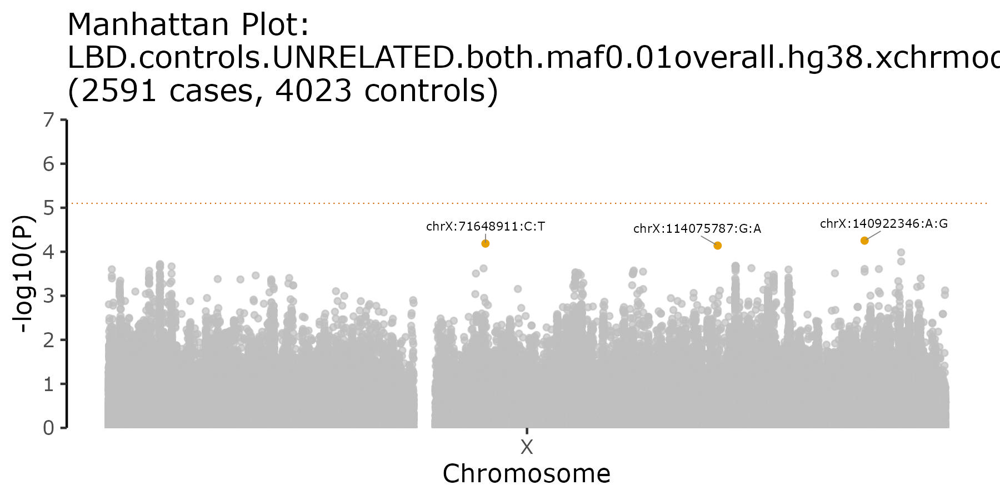

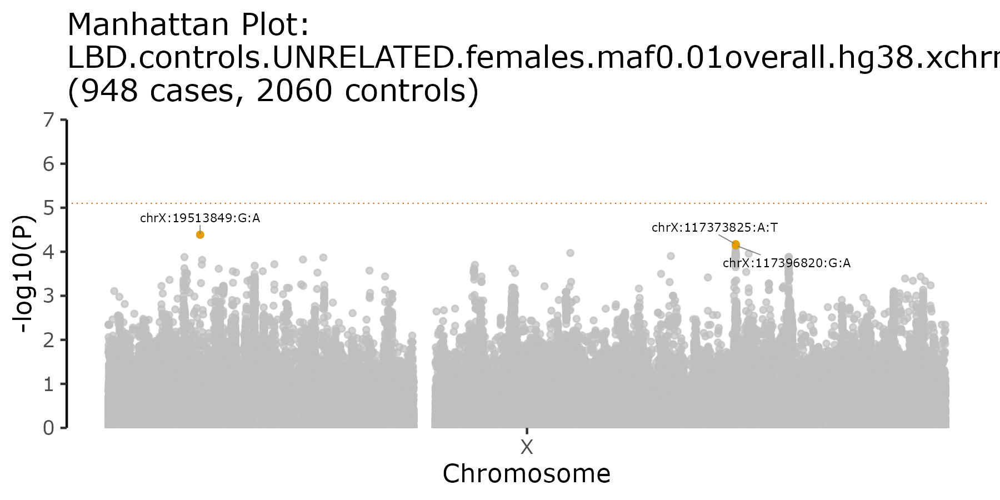

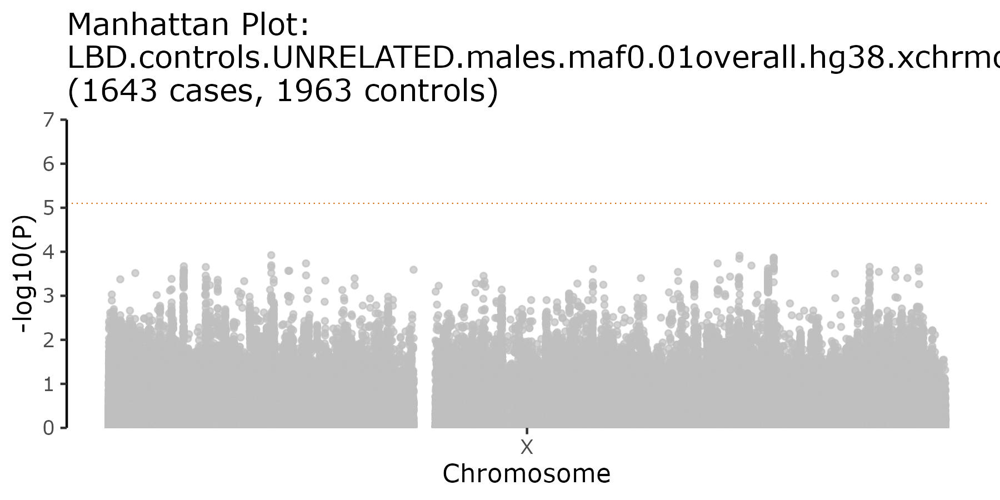

In [26]:
from IPython.display import display
from PIL import Image

print("Manhattan and QQ plots for XWAS analysis (maf overall > 0.01)")

manhattan="both/LBD.controls.UNRELATED.both.maf0.01overall.hg38.xchrmodel2.glm.manhattan_v1.jpeg"
display(Image.open(manhattan))

manhattan="females_only/LBD.controls.UNRELATED.females.maf0.01overall.hg38.xchrmodel2.glm.manhattan_v1.jpeg"
display(Image.open(manhattan))

manhattan="males_only/LBD.controls.UNRELATED.males.maf0.01overall.hg38.xchrmodel2.glm.manhattan_v1.jpeg"
display(Image.open(manhattan))

QQ plots for XWAS analysis (maf overall > 0.001)


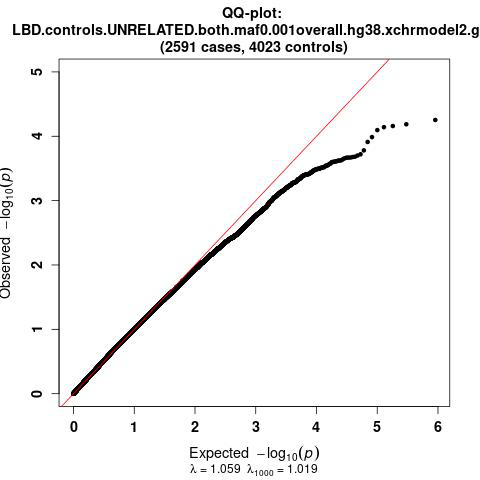

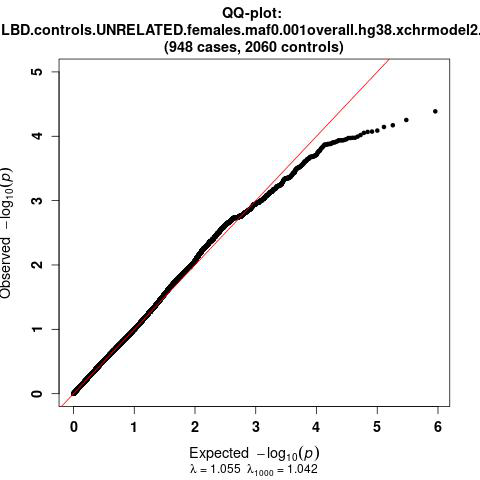

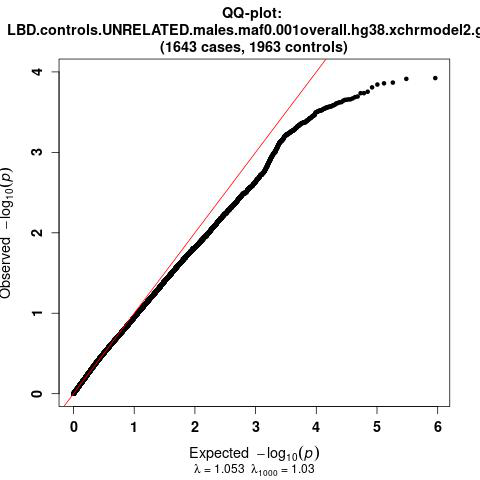

In [27]:
from IPython.display import display
from PIL import Image

print("QQ plots for XWAS analysis (maf overall > 0.001)")

manhattan="both/LBD.controls.UNRELATED.both.maf0.001overall.hg38.xchrmodel2.glm.QQ.jpeg"
display(Image.open(manhattan))

manhattan="females_only/LBD.controls.UNRELATED.females.maf0.001overall.hg38.xchrmodel2.glm.QQ.jpeg"
display(Image.open(manhattan))

manhattan="males_only/LBD.controls.UNRELATED.males.maf0.001overall.hg38.xchrmodel2.glm.QQ.jpeg"
display(Image.open(manhattan))

In [28]:
import pandas as pd
data = pd.read_csv("both/LBD.controls.UNRELATED.chrX.AFFECTION_STATUS.glm.logistic.hybrid",sep="\t")
#print(data.columns)

# make list of hits that are subsignif in the female_only GWAS
colsToKeep = ['#CHROM', 'POS', 'ID', 'A1', 'A1_CT', 'ALLELE_CT',
       'A1_CASE_CT', 'A1_CTRL_CT', 'CASE_ALLELE_CT', 'CTRL_ALLELE_CT',
       'A1_FREQ', 'A1_CASE_FREQ', 'A1_CTRL_FREQ', 'FIRTH?',
       'OR', 'LOG(OR)_SE', 'P']
subsignif = data[(data.TEST == "ADD") & (data.P < 0.05/6296*10) & (data.A1_FREQ > 0.01) & (data.A1_FREQ < 0.99)][colsToKeep]
subsignif

,#CHROM,POS,ID,A1,A1_CT,ALLELE_CT,A1_CASE_CT,A1_CTRL_CT,CASE_ALLELE_CT,CTRL_ALLELE_CT,A1_FREQ,A1_CASE_FREQ,A1_CTRL_FREQ,FIRTH?,OR,LOG(OR)_SE,P
21089120,X,71648911,chrX:71648911:C:T,T,434,13228,216,218,5182,8046,0.032809,0.041683,0.027094,N,1.393540,0.083095,0.000065
35131624,X,114075787,chrX:114075787:G:A,A,1424,13228,473,951,5182,8046,0.107650,0.091277,0.118195,N,0.824577,0.048603,0.000072
43337800,X,140922346,chrX:140922346:A:G,A,1602,13228,552,1050,5182,8046,0.121107,0.106523,0.130500,N,0.831787,0.045704,0.000056


In [29]:
import pandas as pd
data = pd.read_csv("females_only/LBD.controls.UNRELATED.females.chrX.AFFECTION_STATUS.glm.logistic.hybrid",sep="\t")
#print(data.columns)

# make list of hits that are subsignif in the female_only GWAS
colsToKeep = ['#CHROM', 'POS', 'ID', 'A1', 'A1_CT', 'ALLELE_CT',
       'A1_CASE_CT', 'A1_CTRL_CT', 'CASE_ALLELE_CT', 'CTRL_ALLELE_CT',
       'A1_FREQ', 'A1_CASE_FREQ', 'A1_CTRL_FREQ', 'FIRTH?',
       'OR', 'LOG(OR)_SE', 'P']
subsignif = data[(data.TEST == "ADD") & (data.P < 0.05/6296*10) & (data.A1_FREQ > 0.01) & (data.A1_FREQ < 0.99)][colsToKeep]
subsignif

,#CHROM,POS,ID,A1,A1_CT,ALLELE_CT,A1_CASE_CT,A1_CTRL_CT,CASE_ALLELE_CT,CTRL_ALLELE_CT,A1_FREQ,A1_CASE_FREQ,A1_CTRL_FREQ,FIRTH?,OR,LOG(OR)_SE,P
4006428,X,19513849,chrX:19513849:G:A,A,124,6016,61,63,1896,4120,0.020612,0.032173,0.015291,N,2.17557,0.189507,0.000041
27109704,X,117373825,chrX:117373825:A:T,T,1422,6016,518,904,1896,4120,0.236370,0.273207,0.219417,N,1.30257,0.066332,0.000067
27115614,X,117396820,chrX:117396820:G:A,A,1432,6016,519,913,1896,4120,0.238032,0.273734,0.221602,N,1.30213,0.066493,0.000072


In [30]:
import pandas as pd
data = pd.read_csv("males_only/LBD.controls.UNRELATED.males.chrX.AFFECTION_STATUS.glm.logistic.hybrid",sep="\t")
#print(data.columns)

# make list of hits that are subsignif in the female_only GWAS
colsToKeep = ['#CHROM', 'POS', 'ID', 'A1', 'A1_CT', 'ALLELE_CT',
       'A1_CASE_CT', 'A1_CTRL_CT', 'CASE_ALLELE_CT', 'CTRL_ALLELE_CT',
       'A1_FREQ', 'A1_CASE_FREQ', 'A1_CTRL_FREQ', 'FIRTH?',
       'OR', 'LOG(OR)_SE', 'P']
subsignif = data[(data.TEST == "ADD") & (data.P < 0.05/6296*10) & (data.A1_FREQ > 0.01) & (data.A1_FREQ < 0.99)][colsToKeep]
subsignif

,#CHROM,POS,ID,A1,A1_CT,ALLELE_CT,A1_CASE_CT,A1_CTRL_CT,CASE_ALLELE_CT,CTRL_ALLELE_CT,A1_FREQ,A1_CASE_FREQ,A1_CTRL_FREQ,FIRTH?,OR,LOG(OR)_SE,P


In [ ]:
import numpy as np
np.log10(0.05/6296)

In [ ]:
np.log10(0.05/6296*10)

### GWAS (from chromosome-X PCs corrected anaysis)

In [ ]:
!head -n 1 COVARIATES.freeze9.LBD.controls.UNRELATED_clean.updated_covs_using_x-PCs.txt | tr '\t' '\n' | cat -n

In [ ]:
%%bash

echo "Number of cases and controls included in analysis"
awk '{if($8 != "NA") print}' OFS="\t" COVARIATES.freeze9.LBD.controls.UNRELATED_clean.updated_covs_using_x-PCs.txt | cut -f5 | sort | uniq -c

echo "Sex break down in controls"
awk '{if($8 != "NA" && $4 == "1") print}' OFS="\t" COVARIATES.freeze9.LBD.controls.UNRELATED_clean.updated_covs_using_x-PCs.txt | cut -f3 | sort | uniq -c

echo "Sex break down in cases"
awk '{if($8 != "NA" && $4 == "2") print}' OFS="\t" COVARIATES.freeze9.LBD.controls.UNRELATED_clean.updated_covs_using_x-PCs.txt | cut -f3 | sort | uniq -c

In [ ]:
%%bash
DATA="/data/ALS_50k/DementiaSeq.TopmedJointCalled.June2020/LBD/Analysis.XWAS_GLM"

# filter by overall maf
cd $DATA/both_x-pc
CASES="2591"
CONTROLS="4023"
Rscript ${DATA}/QQ_manhattan_plots_GLMresults.FromImputed.FilterMAFoverall.chrX_updatedMay2023.R \
LBD.controls.UNRELATED.chrX.AFFECTION_STATUS.glm.logistic.hybrid \
${CASES} ${CONTROLS} \
LBD.controls.UNRELATED.both 0.01

Rscript ${DATA}/QQ_manhattan_plots_GLMresults.FromImputed.FilterMAFoverall.chrX_updatedMay2023.R \
LBD.controls.UNRELATED.chrX.AFFECTION_STATUS.glm.logistic.hybrid \
${CASES} ${CONTROLS} \
LBD.controls.UNRELATED.both 0.001

cd $DATA/females_only_x-pc
CASES="948"
CONTROLS="2060"
Rscript ${DATA}/QQ_manhattan_plots_GLMresults.FromImputed.FilterMAFoverall.chrX_updatedMay2023.R \
LBD.controls.UNRELATED.females.chrX.AFFECTION_STATUS.glm.logistic.hybrid \
${CASES} ${CONTROLS} \
LBD.controls.UNRELATED.females 0.01

Rscript ${DATA}/QQ_manhattan_plots_GLMresults.FromImputed.FilterMAFoverall.chrX_updatedMay2023.R \
LBD.controls.UNRELATED.females.chrX.AFFECTION_STATUS.glm.logistic.hybrid \
${CASES} ${CONTROLS} \
LBD.controls.UNRELATED.females 0.001

cd $DATA/males_only_x-pc
CASES="1643"
CONTROLS="1963"
Rscript ${DATA}/QQ_manhattan_plots_GLMresults.FromImputed.FilterMAFoverall.chrX_updatedMay2023.R \
LBD.controls.UNRELATED.males.chrX.AFFECTION_STATUS.glm.logistic.hybrid \
${CASES} ${CONTROLS} \
LBD.controls.UNRELATED.males 0.01

Rscript ${DATA}/QQ_manhattan_plots_GLMresults.FromImputed.FilterMAFoverall.chrX_updatedMay2023.R \
LBD.controls.UNRELATED.males.chrX.AFFECTION_STATUS.glm.logistic.hybrid \
${CASES} ${CONTROLS} \
LBD.controls.UNRELATED.males 0.001


Manhattan plots for XWAS analysis (maf overall > 0.01)


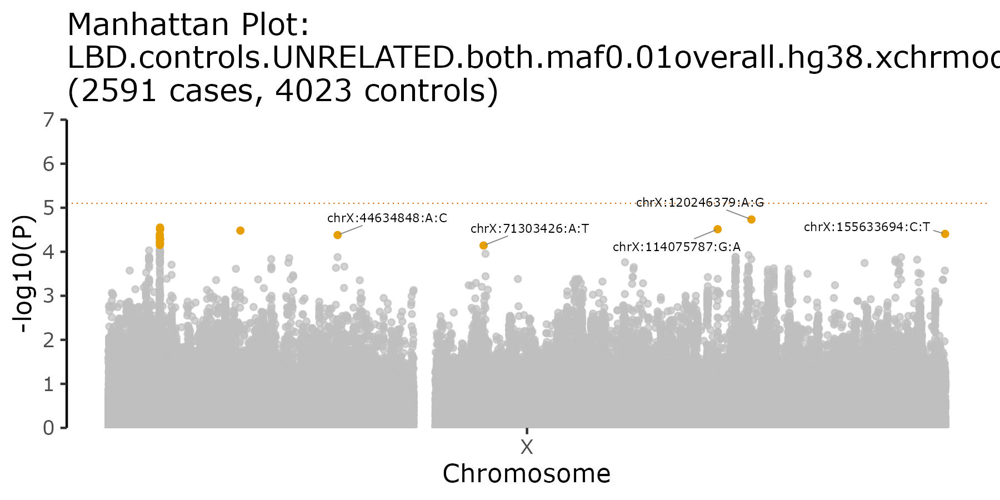

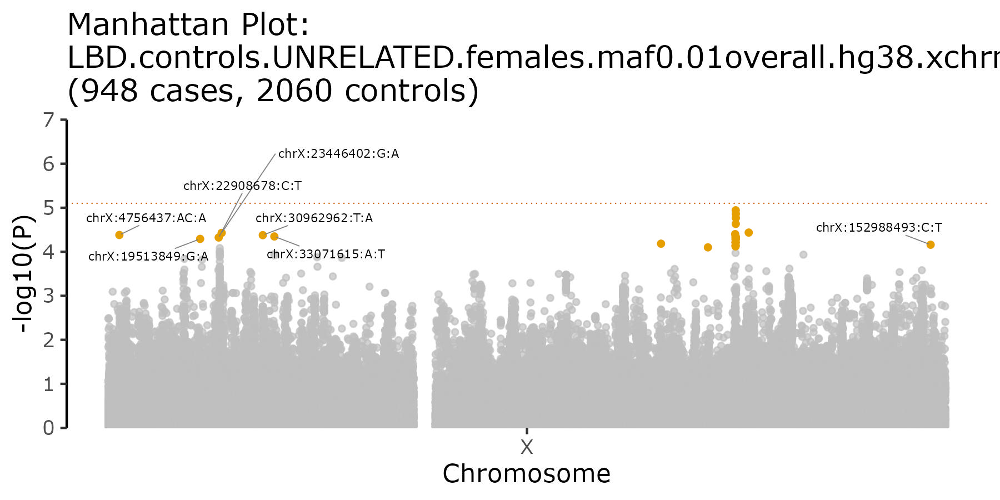

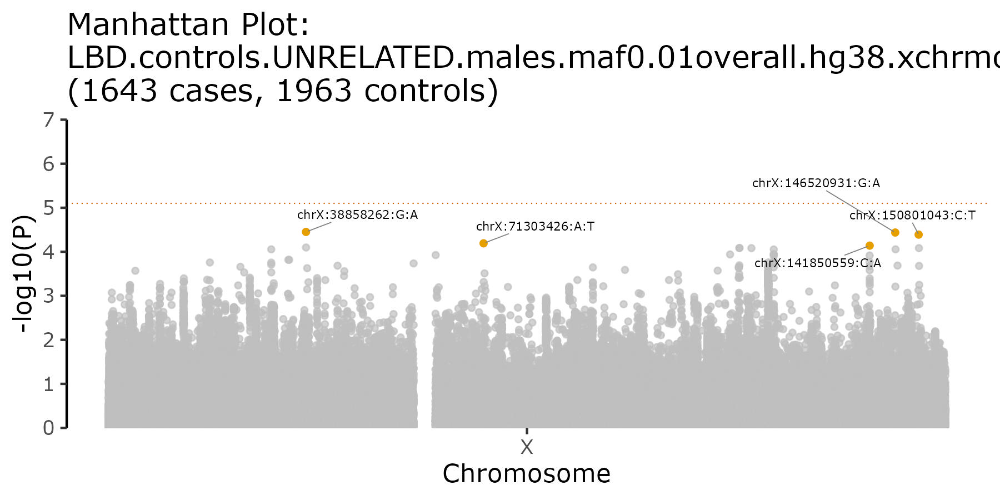

In [3]:
from IPython.display import display
from PIL import Image

print("Manhattan plots for XWAS analysis (maf overall > 0.01)")

manhattan="both_x-pc/LBD.controls.UNRELATED.both.maf0.01overall.hg38.xchrmodel2.glm.manhattan_v1.jpeg"
display(Image.open(manhattan))

manhattan="females_only_x-pc/LBD.controls.UNRELATED.females.maf0.01overall.hg38.xchrmodel2.glm.manhattan_v1.jpeg"
display(Image.open(manhattan))

manhattan="males_only_x-pc/LBD.controls.UNRELATED.males.maf0.01overall.hg38.xchrmodel2.glm.manhattan_v1.jpeg"
display(Image.open(manhattan))

QQ plots for XWAS analysis (maf overall > 0.001)


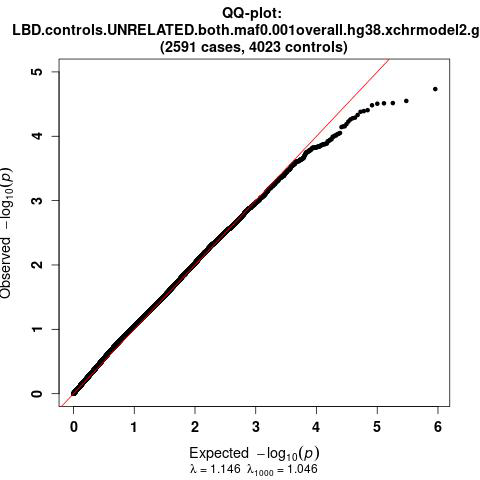

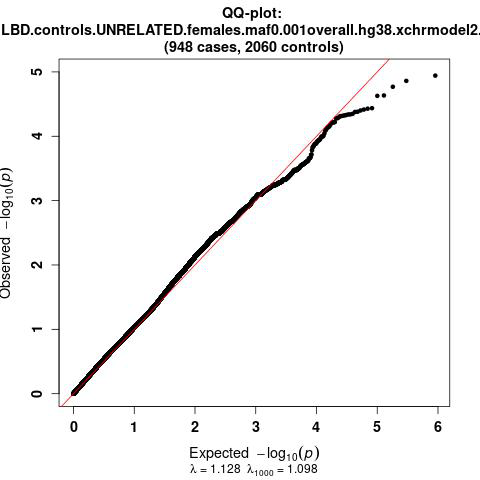

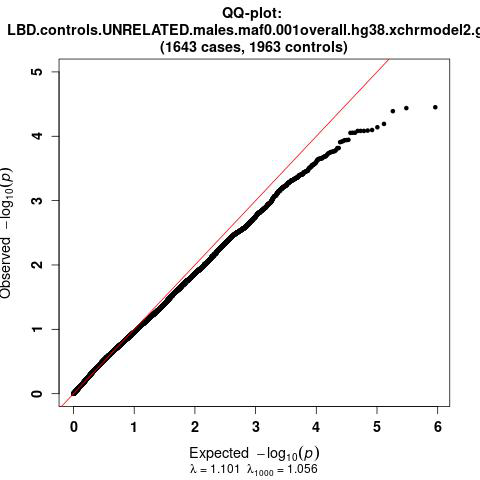

In [4]:
from IPython.display import display
from PIL import Image

print("QQ plots for XWAS analysis (maf overall > 0.001)")

manhattan="both_x-pc/LBD.controls.UNRELATED.both.maf0.001overall.hg38.xchrmodel2.glm.QQ.jpeg"
display(Image.open(manhattan))

manhattan="females_only_x-pc/LBD.controls.UNRELATED.females.maf0.001overall.hg38.xchrmodel2.glm.QQ.jpeg"
display(Image.open(manhattan))

manhattan="males_only_x-pc/LBD.controls.UNRELATED.males.maf0.001overall.hg38.xchrmodel2.glm.QQ.jpeg"
display(Image.open(manhattan))

### GWAS (from chromosome-X-autosomal PCs corrected anaysis)

In [ ]:
%%bash

echo "Number of cases and controls included in analysis"
awk '{if($8 != "NA") print}' OFS="\t" COVARIATES.freeze9.LBD.controls.UNRELATED_clean.updated_covs_using_x-autosomal-PCs.txt | cut -f5 | sort | uniq -c

echo "Sex break down in controls"
awk '{if($8 != "NA" && $4 == "1") print}' OFS="\t" COVARIATES.freeze9.LBD.controls.UNRELATED_clean.updated_covs_using_x-autosomal-PCs.txt | cut -f3 | sort | uniq -c

echo "Sex break down in cases"
awk '{if($8 != "NA" && $4 == "2") print}' OFS="\t" COVARIATES.freeze9.LBD.controls.UNRELATED_clean.updated_covs_using_x-autosomal-PCs.txt | cut -f3 | sort | uniq -c

In [ ]:
%%bash
DATA="/data/ALS_50k/DementiaSeq.TopmedJointCalled.June2020/LBD/Analysis.XWAS_GLM"

# filter by overall maf
cd $DATA/both_x-autosomal-pc
CASES="2591"
CONTROLS="4023"
Rscript ${DATA}/QQ_manhattan_plots_GLMresults.FromImputed.FilterMAFoverall.chrX_updatedMay2023.R \
LBD.controls.UNRELATED.chrX.AFFECTION_STATUS.glm.logistic.hybrid \
${CASES} ${CONTROLS} \
LBD.controls.UNRELATED.both 0.01

Rscript ${DATA}/QQ_manhattan_plots_GLMresults.FromImputed.FilterMAFoverall.chrX_updatedMay2023.R \
LBD.controls.UNRELATED.chrX.AFFECTION_STATUS.glm.logistic.hybrid \
${CASES} ${CONTROLS} \
LBD.controls.UNRELATED.both 0.001

cd $DATA/females_only_x-autosomal-pc
CASES="948"
CONTROLS="2060"
Rscript ${DATA}/QQ_manhattan_plots_GLMresults.FromImputed.FilterMAFoverall.chrX_updatedMay2023.R \
LBD.controls.UNRELATED.females.chrX.AFFECTION_STATUS.glm.logistic.hybrid \
${CASES} ${CONTROLS} \
LBD.controls.UNRELATED.females 0.01

Rscript ${DATA}/QQ_manhattan_plots_GLMresults.FromImputed.FilterMAFoverall.chrX_updatedMay2023.R \
LBD.controls.UNRELATED.females.chrX.AFFECTION_STATUS.glm.logistic.hybrid \
${CASES} ${CONTROLS} \
LBD.controls.UNRELATED.females 0.001

cd $DATA/males_only_x-autosomal-pc
CASES="1643"
CONTROLS="1963"
Rscript ${DATA}/QQ_manhattan_plots_GLMresults.FromImputed.FilterMAFoverall.chrX_updatedMay2023.R \
LBD.controls.UNRELATED.males.chrX.AFFECTION_STATUS.glm.logistic.hybrid \
${CASES} ${CONTROLS} \
LBD.controls.UNRELATED.males 0.01

Rscript ${DATA}/QQ_manhattan_plots_GLMresults.FromImputed.FilterMAFoverall.chrX_updatedMay2023.R \
LBD.controls.UNRELATED.males.chrX.AFFECTION_STATUS.glm.logistic.hybrid \
${CASES} ${CONTROLS} \
LBD.controls.UNRELATED.males 0.001


Manhattan plots for XWAS analysis (maf overall > 0.01)


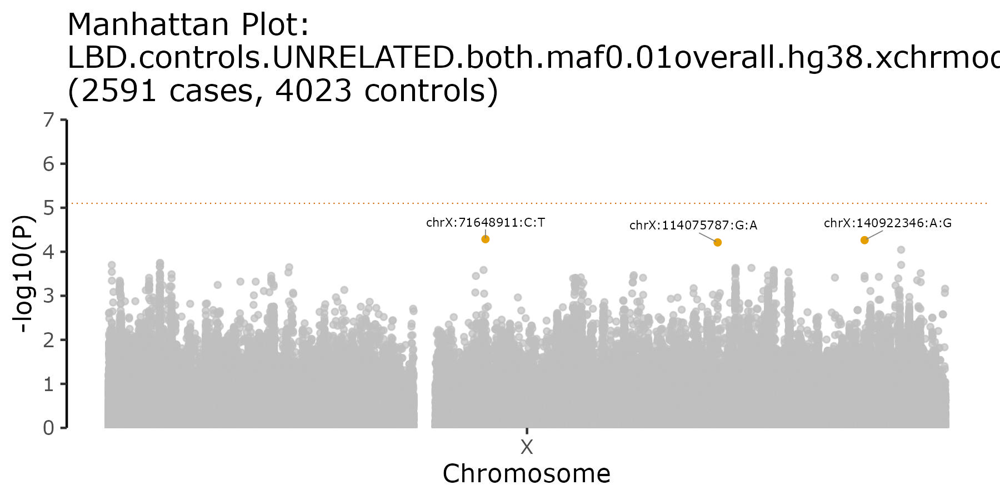

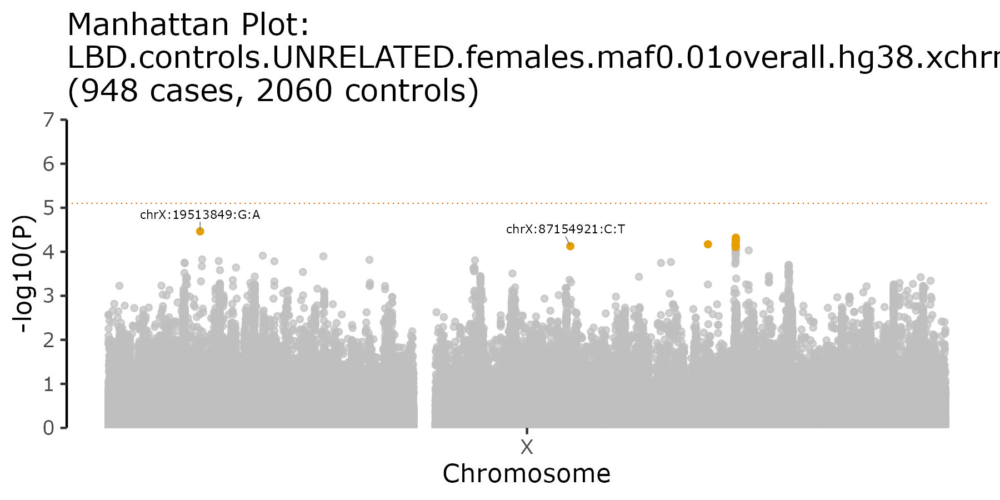

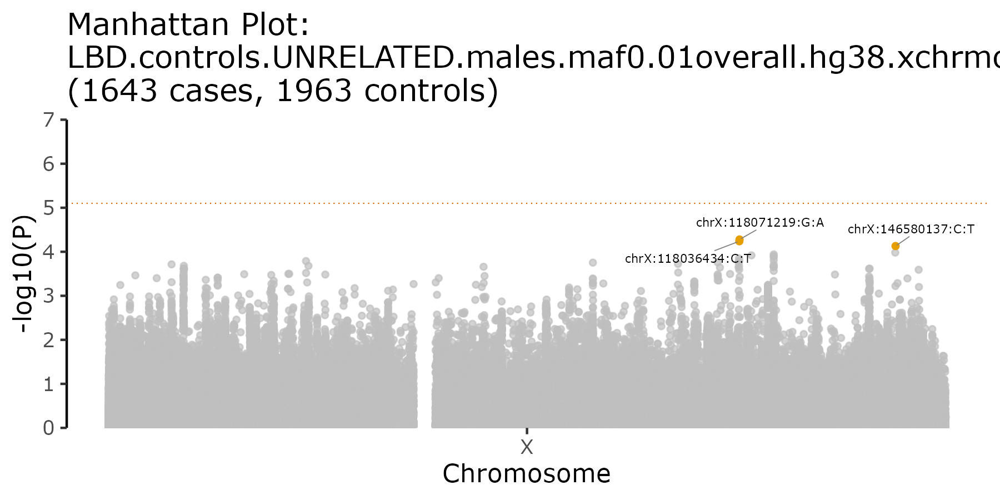

In [8]:
from IPython.display import display
from PIL import Image

print("Manhattan plots for XWAS analysis (maf overall > 0.01)")

manhattan="both_x-autosomal-pc/LBD.controls.UNRELATED.both.maf0.01overall.hg38.xchrmodel2.glm.manhattan_v1.jpeg"
display(Image.open(manhattan))

manhattan="females_only_x-autosomal-pc/LBD.controls.UNRELATED.females.maf0.01overall.hg38.xchrmodel2.glm.manhattan_v1.jpeg"
display(Image.open(manhattan))

manhattan="males_only_x-autosomal-pc/LBD.controls.UNRELATED.males.maf0.01overall.hg38.xchrmodel2.glm.manhattan_v1.jpeg"
display(Image.open(manhattan))

QQ plots for XWAS analysis (maf overall > 0.001)


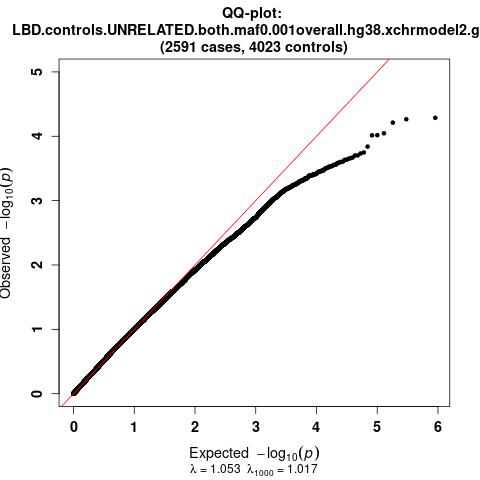

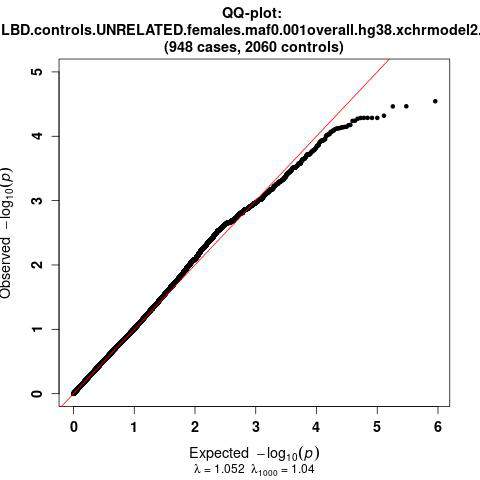

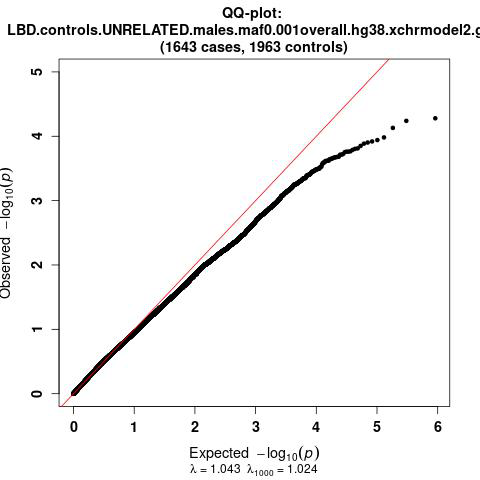

In [9]:
from IPython.display import display
from PIL import Image

print("QQ plots for XWAS analysis (maf overall > 0.001)")

manhattan="both_x-autosomal-pc/LBD.controls.UNRELATED.both.maf0.001overall.hg38.xchrmodel2.glm.QQ.jpeg"
display(Image.open(manhattan))

manhattan="females_only_x-autosomal-pc/LBD.controls.UNRELATED.females.maf0.001overall.hg38.xchrmodel2.glm.QQ.jpeg"
display(Image.open(manhattan))

manhattan="males_only_x-autosomal-pc/LBD.controls.UNRELATED.males.maf0.001overall.hg38.xchrmodel2.glm.QQ.jpeg"
display(Image.open(manhattan))

In [31]:
import pandas as pd
import numpy as np
glm = pd.read_csv("females_only_x-autosomal-pc/toMeta.LBD.controls.UNRELATED.females.hg38.chrX.tab", sep ="\t")
glm[(glm.P < 0.05/6296 *8) & (glm.Freq_EffectAllele > 0.01)]

,CHROM,POS,ID,marker,EffectAllele,OtherAllele,OR,BETA,SE,P,Freq_EffectAllele,Freq_EffectAllele.CASE,Freq_EffectAllele.CTRL,ALLELE_CT,CASE_ALLELE_CT,CTRL_ALLELE_CT,EffectAllele_CT,EffectAllele_CT.CASE,EffectAllele_CT.CTRL
234940,X,19513849,chrX:19513849:G:A,X:19513849:G:A,A,G,2.19185,0.784746,0.189441,0.000034,0.020612,0.032173,0.015291,6016,1896,4120,124,61,63
1537244,X,117373825,chrX:117373825:A:T,X:117373825:A:T,T,A,1.30521,0.266364,0.065825,0.000052,0.236370,0.273207,0.219417,6016,1896,4120,1422,518,904
1537618,X,117396820,chrX:117396820:G:A,X:117396820:G:A,A,G,1.30787,0.268400,0.066021,0.000048,0.238032,0.273734,0.221602,6016,1896,4120,1432,519,913
1537643,X,117398160,chrX:117398160:T:C,X:117398160:T:C,C,T,1.30608,0.267030,0.066100,0.000053,0.237201,0.272679,0.220874,6016,1896,4120,1427,517,910
1537758,X,117404930,chrX:117404930:G:A,X:117404930:G:A,A,G,1.30272,0.264454,0.065734,0.000057,0.245678,0.277954,0.230825,6016,1896,4120,1478,527,951


### Plot correlation of summ stats (Zscore vs Zscore plots) between XWAS-autosomalPC vs XWAS-xPC vs XWAS-autosomal-XPC

In [1]:
!mkdir Summstats_correlation

In [17]:
!ls -ltrh cond_ApoE4_x-pc

total 3.4M
-rw-rw---- 1 chiarp ALS_50k 490K Dec  7 13:39 COVARIATES.freeze9.LBD.controls.UNRELATED.cases_clean.ApoE_genotype_using_x-PCs.txt
drwxrws--- 2 chiarp ALS_50k 4.0K Dec  7 15:37 females_only
drwxrws--- 2 chiarp ALS_50k 4.0K Dec  7 15:39 both
drwxrws--- 2 chiarp ALS_50k 4.0K Dec  7 15:40 males_only
-rw-rw---- 1 chiarp ALS_50k 1.2M Dec 20 11:31 COVARIATES.freeze9.LBD.controls.UNRELATED.both_clean.ApoE_genotype_using_x-PCs.txt
-rw-rw---- 1 chiarp ALS_50k 847K Dec 20 11:45 COVARIATES.freeze9.LBD.controls.UNRELATED.females_clean.ApoE_genotype_using_x-PCs.txt
-rw-rw---- 1 chiarp ALS_50k 901K Dec 20 11:45 COVARIATES.freeze9.LBD.controls.UNRELATED.males_clean.ApoE_genotype_using_x-PCs.txt


In [1]:
%%bash
cd Summstats_correlation

module load R/4.3
R --vanilla --no-save

# load libraries
require(data.table)
require(tidyverse)
library("Hmisc")
library(ggplot2) 
library(ggpubr) 

# read in data for females only XWAS from differnt sets of covariates adjustment
auto <- fread("../females_only/LBD.controls.UNRELATED.females.chrX.AFFECTION_STATUS.glm.logistic.hybrid")
x <- fread("../females_only_x-pc/LBD.controls.UNRELATED.females.chrX.AFFECTION_STATUS.glm.logistic.hybrid")
auto_x <- fread("../females_only_x-autosomal-pc/LBD.controls.UNRELATED.females.chrX.AFFECTION_STATUS.glm.logistic.hybrid")

auto <- fread("../cond_ApoE4/females_only/LBD.controls.UNRELATED.chrX.AFFECTION_STATUS.glm.logistic.hybrid")
x <- fread("../cond_ApoE4_x-pc/females_only/LBD.controls.UNRELATED.chrX.AFFECTION_STATUS.glm.logistic.hybrid")
auto_x <- fread("../cond_ApoE4_x-autosomal-pc/females_only/LBD.controls.UNRELATED.chrX.AFFECTION_STATUS.glm.logistic.hybrid")



# filter to keep only variants with MAF > 0.01, and TEST == "ADD"
# tidy up columns - keep only SNPID,CHROM,POS,REF,ALT,A1,ZSTAT
# match up summ stats based on CHROM,POS,REF,ALT
# plot correlation plot and calculate correlation score
auto_tidy <- auto %>%
             filter(TEST == "ADD") %>%
             filter(A1_FREQ >= 0.01) %>%
             select(ID,POS,REF,ALT,A1,Z_STAT) %>%
             mutate(adjusted_PCs = "Autosomal") %>%
             rename(Z_auto = Z_STAT)
                
x_tidy <- x %>%
             filter(TEST == "ADD") %>%
             filter(A1_FREQ >= 0.01) %>%
             select(ID,POS,REF,ALT,A1,Z_STAT) %>%
             mutate(adjusted_PCs = "X") %>%
             rename(Z_x = Z_STAT)
            
auto_x_tidy <- auto_x %>%
             filter(TEST == "ADD") %>%
             filter(A1_FREQ >= 0.01) %>%
             select(ID,POS,REF,ALT,A1,Z_STAT) %>%
             mutate(adjusted_PCs = "Autosomal_X") %>%
             rename(Z_auto_x = Z_STAT)
                
# merge files for correlation analysis and plots
temp <- merge(auto_tidy[,c("ID","POS","REF","ALT","A1","Z_auto")],
              x_tidy[,c("ID","POS","REF","ALT","A1","Z_x")],
              by=c("ID","POS","REF","ALT","A1"))
merged <- merge(temp, auto_x_tidy[,c("ID","POS","REF","ALT","A1","Z_auto_x")],
              by=c("ID","POS","REF","ALT","A1")) %>% arrange(POS)

# plot Z_auto vs Z_x
plot <- ggplot(data=merged, aes(x=Z_auto, y=Z_x)) +
        geom_point(size=0.3, alpha=0.3, color="grey30") +
        stat_smooth(method = "lm", 
              formula = y ~ x, 
              geom = "smooth", se=TRUE, linewidth=0.3) +
        stat_cor(method = "pearson", label.x = min(merged$Z_auto)*1.1, label.y = max(merged$Z_x)*0.9, size=3, color="blue") +
        theme_bw()
ggsave(paste("Corr_plot_Z-auto_vs_Z-x",".jpeg", sep = ""), plot = plot, device = "jpeg", scale = 1, width = 2.5, height = 2.5, units = "in", dpi = 300, limitsize = TRUE)

# plot Z_auto vs Z_auto_x
plot <- ggplot(data=merged, aes(x=Z_auto, y=Z_auto_x)) +
        geom_point(size=0.3, alpha=0.3, color="darkorange1") +
        stat_smooth(method = "lm", 
              formula = y ~ x, 
              geom = "smooth", se=TRUE, linewidth=0.3) +
        stat_cor(method = "pearson", label.x = min(merged$Z_auto)*1.1, label.y = max(merged$Z_x)*0.9, size=3, color="blue") +
        theme_bw()
ggsave(paste("Corr_plot_Z-auto_vs_Z-auto-x",".jpeg", sep = ""), plot = plot, device = "jpeg", scale = 1, width = 2.5, height = 2.5, units = "in", dpi = 300, limitsize = TRUE)


# concatenate dfs for plotting Zscore by position
# to visualise where the differences are along x chromosome
auto_tidy_v2 <- auto %>%
             filter(TEST == "ADD") %>%
             filter(A1_FREQ >= 0.01) %>%
             select(ID,POS,REF,ALT,A1,P,Z_STAT) %>%
             mutate(adjusted_PCs = "Autosomal")
                
x_tidy_v2 <- x %>%
             filter(TEST == "ADD") %>%
             filter(A1_FREQ >= 0.01) %>%
             select(ID,POS,REF,ALT,A1,P,Z_STAT) %>%
             mutate(adjusted_PCs = "X")
            
auto_x_tidy_v2 <- auto_x %>%
             filter(TEST == "ADD") %>%
             filter(A1_FREQ >= 0.01) %>%
             select(ID,POS,REF,ALT,A1,P,Z_STAT) %>%
             mutate(adjusted_PCs = "Autosomal_X")
                
concat <- rbind(auto_tidy_v2, x_tidy_v2, auto_x_tidy_v2)
concat$adjusted_PCs <- factor(concat$adjusted_PCs, levels=c("Autosomal","X","Autosomal_X"))
concat <- concat %>% arrange(POS)

# plot z-scores based on position
plot_z <- ggplot(data=concat %>% filter(P < 0.001), aes(x=POS, y=-log10(P), color=adjusted_PCs)) + 
          geom_point(alpha=0.5, size=0.5) +
          facet_wrap(vars(adjusted_PCs), nrow = 3) +
          geom_hline(yintercept=-log10(0.05/6296), color="red", linetype="dotted")
ggsave(paste("Zscore_along_x",".jpeg", sep = ""), plot = plot_z, device = "jpeg", scale = 1, width = 8, height = 8, units = "in", dpi = 300, limitsize = TRUE)


# run correlation
resH <- rcorr(as.matrix(merged[,c(1,2)])
resH

flattenCorrMatrix <- function(cormat, pmat) {
  ut <- upper.tri(cormat)
  data.frame(
    row = rownames(cormat)[row(cormat)[ut]],
    column = rownames(cormat)[col(cormat)[ut]],
    cor  =(cormat)[ut],
    p = pmat[ut]
    )
}

corr_res <- flattenCorrMatrix(resH$r, resH$P)
write.table(corr_res,"Correlation_results_females_only.txt",sep="\t", quote=F, row.names=F,col.names=T)

[-] Unloading gcc  11.3.0  ... 
[-] Unloading HDF5  1.12.2 
[-] Unloading netcdf  4.9.0 
[-] Unloading openmpi/4.1.3/gcc-11.3.0  ... 
[-] Unloading pandoc  2.18  on cn1155 
[-] Unloading R 4.3.0 
[+] Loading gcc  11.3.0  ... 
[+] Loading HDF5  1.12.2 
[+] Loading netcdf  4.9.0 
[-] Unloading gcc  11.3.0  ... 
[+] Loading gcc  11.3.0  ... 
[+] Loading openmpi/4.1.3/gcc-11.3.0  ... 
[+] Loading pandoc  2.18  on cn1155 
[+] Loading R 4.3.0 



R version 4.3.0 (2023-04-21) -- "Already Tomorrow"
Copyright (C) 2023 The R Foundation for Statistical Computing
Platform: x86_64-pc-linux-gnu (64-bit)

R is free software and comes with ABSOLUTELY NO WARRANTY.
You are welcome to redistribute it under certain conditions.
Type 'license()' or 'licence()' for distribution details.

R is a collaborative project with many contributors.
Type 'contributors()' for more information and
'citation()' on how to cite R or R packages in publications.

Type 'demo()' for some demos, 'help()' for on-line help, or
'help.start()' for an HTML browser interface to help.
Type 'q()' to quit R.

> 
> # load libraries
> require(data.table)


Loading required package: data.table


> require(tidyverse)


Loading required package: tidyverse
── Attaching core tidyverse packages ──────────────────────── tidyverse 2.0.0 ──
✔ dplyr     1.1.4     ✔ readr     2.1.4
✔ forcats   1.0.0     ✔ stringr   1.5.1
✔ ggplot2   3.4.4     ✔ tibble    3.2.1
✔ lubridate 1.9.3     ✔ tidyr     1.3.0
✔ purrr     1.0.2     
── Conflicts ────────────────────────────────────────── tidyverse_conflicts() ──
✖ dplyr::between()     masks data.table::between()
✖ dplyr::filter()      masks stats::filter()
✖ dplyr::first()       masks data.table::first()
✖ lubridate::hour()    masks data.table::hour()
✖ lubridate::isoweek() masks data.table::isoweek()
✖ dplyr::lag()         masks stats::lag()
✖ dplyr::last()        masks data.table::last()
✖ lubridate::mday()    masks data.table::mday()
✖ lubridate::minute()  masks data.table::minute()
✖ lubridate::month()   masks data.table::month()
✖ lubridate::quarter() masks data.table::quarter()
✖ lubridate::second()  masks data.table::second()
✖ purrr::transpose()   masks data.tab

> library("Hmisc")



Attaching package: ‘Hmisc’

The following objects are masked from ‘package:dplyr’:

    src, summarize

The following objects are masked from ‘package:base’:

    format.pval, units



> library(ggplot2) 
> library(ggpubr) 
> 
> # read in data for females only XWAS from differnt sets of covariates adjustment
> auto <- fread("../females_only/LBD.controls.UNRELATED.females.chrX.AFFECTION_STATUS.glm.logistic.hybrid")
> x <- fread("../females_only_x-pc/LBD.controls.UNRELATED.females.chrX.AFFECTION_STATUS.glm.logistic.hybrid")
> auto_x <- fread("../females_only_x-autosomal-pc/LBD.controls.UNRELATED.females.chrX.AFFECTION_STATUS.glm.logistic.hybrid")
> 
> # filter to keep only variants with MAF > 0.01, and TEST == "ADD"
> # tidy up columns - keep only SNPID,CHROM,POS,REF,ALT,A1,ZSTAT
> # match up summ stats based on CHROM,POS,REF,ALT
> # plot correlation plot and calculate correlation score
> auto_tidy <- auto %>%
+              filter(TEST == "ADD") %>%
+              filter(A1_FREQ >= 0.01) %>%
+              select(ID,POS,REF,ALT,A1,Z_STAT) %>%
+              mutate(adjusted_PCs = "Autosomal") %>%
+              rename(Z_auto = Z_STAT)
>                 
> x_tidy <- x %

Error in rcorr(as.matrix(merged)) : 
  NA/NaN/Inf in foreign function call (arg 1)
In addition: Warning message:
In storage.mode(x) <- "double" : NAs introduced by coercion
Execution halted


CalledProcessError: Command 'b'cd Summstats_correlation\n\nmodule load R/4.3\nR --vanilla --no-save\n\n# load libraries\nrequire(data.table)\nrequire(tidyverse)\nlibrary("Hmisc")\nlibrary(ggplot2) \nlibrary(ggpubr) \n\n# read in data for females only XWAS from differnt sets of covariates adjustment\nauto <- fread("../females_only/LBD.controls.UNRELATED.females.chrX.AFFECTION_STATUS.glm.logistic.hybrid")\nx <- fread("../females_only_x-pc/LBD.controls.UNRELATED.females.chrX.AFFECTION_STATUS.glm.logistic.hybrid")\nauto_x <- fread("../females_only_x-autosomal-pc/LBD.controls.UNRELATED.females.chrX.AFFECTION_STATUS.glm.logistic.hybrid")\n\n# filter to keep only variants with MAF > 0.01, and TEST == "ADD"\n# tidy up columns - keep only SNPID,CHROM,POS,REF,ALT,A1,ZSTAT\n# match up summ stats based on CHROM,POS,REF,ALT\n# plot correlation plot and calculate correlation score\nauto_tidy <- auto %>%\n             filter(TEST == "ADD") %>%\n             filter(A1_FREQ >= 0.01) %>%\n             select(ID,POS,REF,ALT,A1,Z_STAT) %>%\n             mutate(adjusted_PCs = "Autosomal") %>%\n             rename(Z_auto = Z_STAT)\n                \nx_tidy <- x %>%\n             filter(TEST == "ADD") %>%\n             filter(A1_FREQ >= 0.01) %>%\n             select(ID,POS,REF,ALT,A1,Z_STAT) %>%\n             mutate(adjusted_PCs = "X") %>%\n             rename(Z_x = Z_STAT)\n            \nauto_x_tidy <- auto_x %>%\n             filter(TEST == "ADD") %>%\n             filter(A1_FREQ >= 0.01) %>%\n             select(ID,POS,REF,ALT,A1,Z_STAT) %>%\n             mutate(adjusted_PCs = "Autosomal_X") %>%\n             rename(Z_auto_x = Z_STAT)\n                \n# merge files for correlation analysis and plots\ntemp <- merge(auto_tidy[,c("ID","POS","REF","ALT","A1","Z_auto")],\n              x_tidy[,c("ID","POS","REF","ALT","A1","Z_x")],\n              by=c("ID","POS","REF","ALT","A1"))\nmerged <- merge(temp, auto_x_tidy[,c("ID","POS","REF","ALT","A1","Z_auto_x")],\n              by=c("ID","POS","REF","ALT","A1")) %>% arrange(POS)\n\n# plot Z_auto vs Z_x\nplot <- ggplot(data=merged, aes(x=Z_auto, y=Z_x)) +\n        geom_point(size=0.2) +\n        stat_smooth(method = "lm", \n              formula = y ~ x, \n              geom = "smooth", se=TRUE) +\n        stat_cor(method = "pearson", label.x = min(merged$Z_auto)*1.1, label.y = max(merged$Z_x)*0.9, size=3, color="blue") +\n        theme_bw()\nggsave(paste("Corr_plot_Z-auto_vs_Z-x",".jpeg", sep = ""), plot = plot, device = "jpeg", scale = 1, width = 2.5, height = 2.5, units = "in", dpi = 300, limitsize = TRUE)\n\n# plot Z_auto vs Z_auto_x\nplot <- ggplot(data=merged, aes(x=Z_auto, y=Z_auto_x)) +\n        geom_point(size=0.2) +\n        stat_smooth(method = "lm", \n              formula = y ~ x, \n              geom = "smooth", se=TRUE) +\n        stat_cor(method = "pearson", label.x = min(merged$Z_auto)*1.1, label.y = max(merged$Z_x)*0.9, size=3, color="blue") +\n        theme_bw()\nggsave(paste("Corr_plot_Z-auto_vs_Z-auto-x",".jpeg", sep = ""), plot = plot, device = "jpeg", scale = 1, width = 2.5, height = 2.5, units = "in", dpi = 300, limitsize = TRUE)\n\n# run correlation\nresH <- rcorr(as.matrix(merged))\nresH\n\nflattenCorrMatrix <- function(cormat, pmat) {\n  ut <- upper.tri(cormat)\n  data.frame(\n    row = rownames(cormat)[row(cormat)[ut]],\n    column = rownames(cormat)[col(cormat)[ut]],\n    cor  =(cormat)[ut],\n    p = pmat[ut]\n    )\n}\n\ncorr_res <- flattenCorrMatrix(resH$r, resH$P)\nwrite.table(corr_res,"Correlation_results_females_only.txt",sep="\\t", quote=F, row.names=F,col.names=T)\n'' returned non-zero exit status 1.

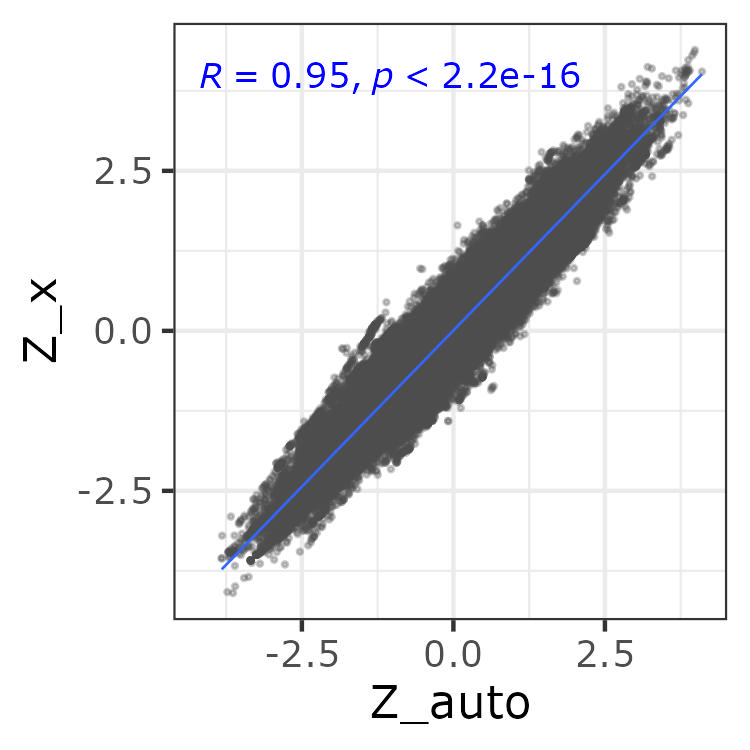

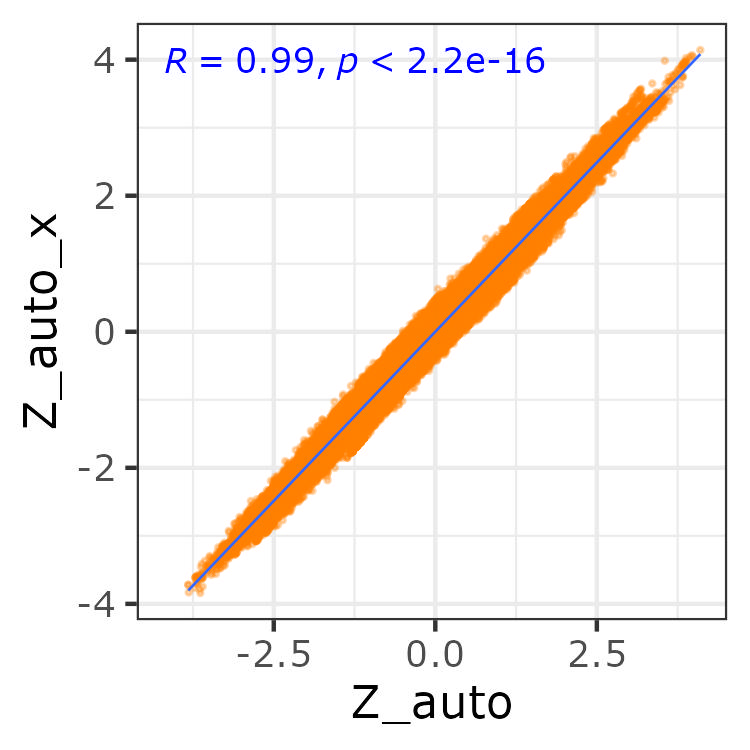

In [16]:
from IPython.display import display
from PIL import Image

plot="Summstats_correlation/Corr_plot_Z-auto_vs_Z-x.jpeg"
display(Image.open(plot))

plot="Summstats_correlation/Corr_plot_Z-auto_vs_Z-auto-x.jpeg"
display(Image.open(plot))

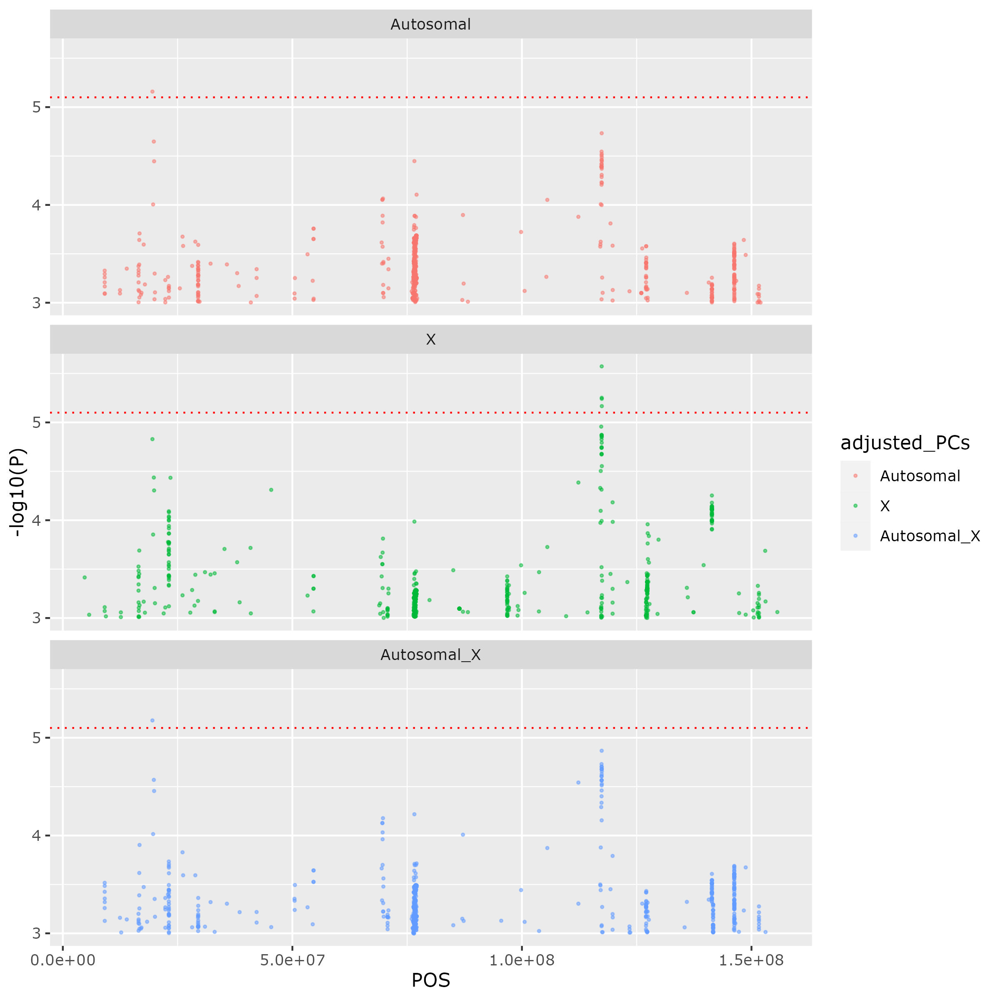

In [18]:
from IPython.display import display
from PIL import Image

plot="Summstats_correlation/Zscore_along_x.jpeg"
display(Image.open(plot))

## ***UPDATED 12-27-2023:*** Merge summary stats with hg38 rsid file to get rsids

**Notes:**

Location of rsid hg38 for chr X file: `/data/ALS_50k/DementiaSeq.TopmedJointCalled.June2020/LBD/Analysis.XWAS/hg38_rsID_AUG2019_goodFormat.ALLFINAL_chr23.txt`


Summ stats to use from the XWAS analysis asjusting for covariates from merged x-autosomal PCs):
***Note that the following summ stats are filtered to include variants with overall maf >= 0.01; these were filtered in the RWAS analysis pipeline/notebook***
- both (joint): `/data/ALS_50k/DementiaSeq.TopmedJointCalled.June2020/LBD/Analysis.XWAS_GLM/RWAS_redo/both/toMeta.LBD.controls.UNRELATED.both.maf0.01overall.hg38.chrX.tab`

- females: `/data/ALS_50k/DementiaSeq.TopmedJointCalled.June2020/LBD/Analysis.XWAS_GLM/RWAS_redo/females_only/toMeta.LBD.controls.UNRELATED.females.maf0.01overall.hg38.chrX.tab`

- males: `/data/ALS_50k/DementiaSeq.TopmedJointCalled.June2020/LBD/Analysis.XWAS_GLM/RWAS_redo/males_only/toMeta.LBD.controls.UNRELATED.males.maf0.01overall.hg38.chrX.tab`

In [3]:
%%bash
module load R/4.3
R --vanilla --no-save

# Load required libraries
require(data.table)
require(tidyverse)

# read in map
rsid <- fread("/data/ALS_50k/DementiaSeq.TopmedJointCalled.June2020/LBD/Analysis.XWAS/hg38_rsID_AUG2019_goodFormat.ALLFINAL_chr23.txt",header=F)
colnames(rsid) <- c("markerID","rsID","CHROM","POS","REF","ALT")
rsid$CHROM <- gsub("23","X", rsid$CHROM)


## unconditioned results for females only ##
data <- fread("/data/ALS_50k/DementiaSeq.TopmedJointCalled.June2020/LBD/Analysis.XWAS_GLM/RWAS_redo/both/toMeta.LBD.controls.UNRELATED.both.maf0.01overall.hg38.chrX.tab", header=T)
data1 <- data %>% filter(!is.na(P))

# Merge files - make sure to flip alleles to make sure to account for any REF/ALT mismatch --> save file
merge1 <- merge(data1, rsid[,2:6], by.x=c("CHROM","POS","OtherAllele","EffectAllele"),by.y=c("CHROM","POS","REF","ALT"))
merge2 <- subset(data1, !(data1$ID %in% merge1$ID))
merge3 <- merge(merge2, rsid[,2:6], by.x=c("CHROM","POS","OtherAllele","EffectAllele"),by.y=c("CHROM","POS","ALT","REF"))
merge4 <- rbind(merge1,merge3)
merge5 <- subset(data1, !(data1$ID %in% merge4$ID)) %>% mutate(rsID = "NA")
mergeFINAL <- rbind(merge4,merge5) %>% arrange(CHROM,POS)
write.table(mergeFINAL, "/data/ALS_50k/DementiaSeq.TopmedJointCalled.June2020/LBD/Analysis.XWAS_GLM/both_x-autosomal-pc/toMeta.LBD.controls.UNRELATED.both.maf0.01overall.hg38.chrX.rsid.txt", quote=F,row.names=F,col.names=T,sep="\t")


## unconditioned results for females only ##
data <- fread("/data/ALS_50k/DementiaSeq.TopmedJointCalled.June2020/LBD/Analysis.XWAS_GLM/RWAS_redo/females_only/toMeta.LBD.controls.UNRELATED.females.maf0.01overall.hg38.chrX.tab", header=T)
data1 <- data %>% filter(!is.na(P))

# Merge files - make sure to flip alleles to make sure to account for any REF/ALT mismatch --> save file
merge1 <- merge(data1, rsid[,2:6], by.x=c("CHROM","POS","OtherAllele","EffectAllele"),by.y=c("CHROM","POS","REF","ALT"))
merge2 <- subset(data1, !(data1$ID %in% merge1$ID))
merge3 <- merge(merge2, rsid[,2:6], by.x=c("CHROM","POS","OtherAllele","EffectAllele"),by.y=c("CHROM","POS","ALT","REF"))
merge4 <- rbind(merge1,merge3)
merge5 <- subset(data1, !(data1$ID %in% merge4$ID)) %>% mutate(rsID = "NA")
mergeFINAL <- rbind(merge4,merge5) %>% arrange(CHROM,POS)
write.table(mergeFINAL, "/data/ALS_50k/DementiaSeq.TopmedJointCalled.June2020/LBD/Analysis.XWAS_GLM/females_only_x-autosomal-pc/toMeta.LBD.controls.UNRELATED.females.maf0.01overall.hg38.chrX.rsid.txt", quote=F,row.names=F,col.names=T,sep="\t")

## unconditioned results for males only ##
data <- fread("/data/ALS_50k/DementiaSeq.TopmedJointCalled.June2020/LBD/Analysis.XWAS_GLM/RWAS_redo/males_only/toMeta.LBD.controls.UNRELATED.males.maf0.01overall.hg38.chrX.tab", header=T)
data1 <- data %>% filter(!is.na(P))

# Merge files - make sure to flip alleles to make sure to account for any REF/ALT mismatch --> save file
merge1 <- merge(data1, rsid[,2:6], by.x=c("CHROM","POS","OtherAllele","EffectAllele"),by.y=c("CHROM","POS","REF","ALT"))
merge2 <- subset(data1, !(data1$ID %in% merge1$ID))
merge3 <- merge(merge2, rsid[,2:6], by.x=c("CHROM","POS","OtherAllele","EffectAllele"),by.y=c("CHROM","POS","ALT","REF"))
merge4 <- rbind(merge1,merge3)
merge5 <- subset(data1, !(data1$ID %in% merge4$ID)) %>% mutate(rsID = "NA")
mergeFINAL <- rbind(merge4,merge5) %>% arrange(CHROM,POS)
write.table(mergeFINAL, "/data/ALS_50k/DementiaSeq.TopmedJointCalled.June2020/LBD/Analysis.XWAS_GLM/males_only_x-autosomal-pc/toMeta.LBD.controls.UNRELATED.males.maf0.01overall.hg38.chrX.rsid.txt", quote=F,row.names=F,col.names=T,sep="\t")


[-] Unloading gcc  11.3.0  ... 
[-] Unloading HDF5  1.12.2 
[-] Unloading netcdf  4.9.0 
[-] Unloading openmpi/4.1.3/gcc-11.3.0  ... 
[-] Unloading pandoc  2.18  on cn2067 
[-] Unloading R 4.3.0 
[+] Loading gcc  11.3.0  ... 
[+] Loading HDF5  1.12.2 
[+] Loading netcdf  4.9.0 
[-] Unloading gcc  11.3.0  ... 
[+] Loading gcc  11.3.0  ... 
[+] Loading openmpi/4.1.3/gcc-11.3.0  ... 
[+] Loading pandoc  2.18  on cn2067 
[+] Loading R 4.3.0 



R version 4.3.0 (2023-04-21) -- "Already Tomorrow"
Copyright (C) 2023 The R Foundation for Statistical Computing
Platform: x86_64-pc-linux-gnu (64-bit)

R is free software and comes with ABSOLUTELY NO WARRANTY.
You are welcome to redistribute it under certain conditions.
Type 'license()' or 'licence()' for distribution details.

R is a collaborative project with many contributors.
Type 'contributors()' for more information and
'citation()' on how to cite R or R packages in publications.

Type 'demo()' for some demos, 'help()' for on-line help, or
'help.start()' for an HTML browser interface to help.
Type 'q()' to quit R.

> 
> # Load required libraries
> require(data.table)


Loading required package: data.table


> require(tidyverse)


Loading required package: tidyverse
── Attaching core tidyverse packages ──────────────────────── tidyverse 2.0.0 ──
✔ dplyr     1.1.4     ✔ readr     2.1.4
✔ forcats   1.0.0     ✔ stringr   1.5.1
✔ ggplot2   3.4.4     ✔ tibble    3.2.1
✔ lubridate 1.9.3     ✔ tidyr     1.3.0
✔ purrr     1.0.2     
── Conflicts ────────────────────────────────────────── tidyverse_conflicts() ──
✖ dplyr::between()     masks data.table::between()
✖ dplyr::filter()      masks stats::filter()
✖ dplyr::first()       masks data.table::first()
✖ lubridate::hour()    masks data.table::hour()
✖ lubridate::isoweek() masks data.table::isoweek()
✖ dplyr::lag()         masks stats::lag()
✖ dplyr::last()        masks data.table::last()
✖ lubridate::mday()    masks data.table::mday()
✖ lubridate::minute()  masks data.table::minute()
✖ lubridate::month()   masks data.table::month()
✖ lubridate::quarter() masks data.table::quarter()
✖ lubridate::second()  masks data.table::second()
✖ purrr::transpose()   masks data.tab

> 
> # read in map
> rsid <- fread("/data/ALS_50k/DementiaSeq.TopmedJointCalled.June2020/LBD/Analysis.XWAS/hg38_rsID_AUG2019_goodFormat.ALLFINAL_chr23.txt",header=F)
> colnames(rsid) <- c("markerID","rsID","CHROM","POS","REF","ALT")
> rsid$CHROM <- gsub("23","X", rsid$CHROM)
> 
> 
> ## unconditioned results for females only ##
> data <- fread("/data/ALS_50k/DementiaSeq.TopmedJointCalled.June2020/LBD/Analysis.XWAS_GLM/RWAS_redo/both/toMeta.LBD.controls.UNRELATED.both.maf0.01overall.hg38.chrX.tab", header=T)
> data1 <- data %>% filter(!is.na(P))
> 
> # Merge files - make sure to flip alleles to make sure to account for any REF/ALT mismatch --> save file
> merge1 <- merge(data1, rsid[,2:6], by.x=c("CHROM","POS","OtherAllele","EffectAllele"),by.y=c("CHROM","POS","REF","ALT"))
> merge2 <- subset(data1, !(data1$ID %in% merge1$ID))
> merge3 <- merge(merge2, rsid[,2:6], by.x=c("CHROM","POS","OtherAllele","EffectAllele"),by.y=c("CHROM","POS","ALT","REF"))
> merge4 <- rbind(merge1,merge3)
> merg

### Pull out top hits from GWAS

In [4]:
import pandas as pd
import numpy as np
both = pd.read_csv("both_x-autosomal-pc/toMeta.LBD.controls.UNRELATED.both.maf0.01overall.hg38.chrX.rsid.txt",sep="\t")
females = pd.read_csv("females_only_x-autosomal-pc/toMeta.LBD.controls.UNRELATED.females.maf0.01overall.hg38.chrX.rsid.txt",sep="\t")
males = pd.read_csv("males_only_x-autosomal-pc/toMeta.LBD.controls.UNRELATED.males.maf0.01overall.hg38.chrX.rsid.txt",sep="\t")

In [5]:
import pandas as pd
import numpy as np

# for both only
both = both.rename(columns={'Allele1':'A1',
                                  'Allele2':'A2',
                                  'beta':'BETA',
                                  'SE':'BETA_SE',
                                  'Freq_EffectAllele':'MAF_EffectAllele',
                                  'Freq_EffectAllele.CASE':'MAF_EffectAllele_CASE',
                                  'Freq_EffectAllele.CTRL':'MAF_EffectAllele_CTRL',
                                  'EffectAllele_CT':'CT_EffectAllele',
                                  'EffectAllele_CT.CASE':'CT_EffectAllele_CASE',
                                  'EffectAllele_CT.CTRL':'CT_EffectAllele_CTRL'})
                                  
# calculate OR 95%CI
both['OR_low95'] = np.exp(both['BETA'] - 1.96*both['BETA_SE'])
both['OR_high95'] = np.exp(both['BETA'] + 1.96*both['BETA_SE'])

# keep columns --> save reformatted file
colsToKeep = ['CHROM', 'POS', 'ID', 'rsID', 'EffectAllele','OtherAllele',
              'BETA', 'BETA_SE', 'OR', 'OR_low95', 'OR_high95', 'P',
              'MAF_EffectAllele', 'MAF_EffectAllele_CASE','MAF_EffectAllele_CTRL',
              'CT_EffectAllele', 'CT_EffectAllele_CASE', 'CT_EffectAllele_CTRL',
              'ALLELE_CT', 'CASE_ALLELE_CT', 'CTRL_ALLELE_CT']
    
both_tidy = both[colsToKeep]
both_tidy.to_csv("both_x-autosomal-pc/toMeta.LBD.controls.UNRELATED.both.maf0.01overall.hg38.chrX.rsid_REFORMATTED.txt",sep="\t",index=False,header=True)

In [7]:
both_tidy.head()

,CHROM,POS,ID,rsID,EffectAllele,OtherAllele,BETA,BETA_SE,OR,OR_low95,...,P,MAF_EffectAllele,MAF_EffectAllele_CASE,MAF_EffectAllele_CTRL,CT_EffectAllele,CT_EffectAllele_CASE,CT_EffectAllele_CTRL,ALLELE_CT,CASE_ALLELE_CT,CTRL_ALLELE_CT
0,X,2781514,chrX:2781514:C:A,rs311165,A,C,-0.009707,0.030094,0.99034,0.933615,...,0.747036,0.415356,0.415218,0.415444,5491,2150,3341,13220,5178,8042
1,X,2781604,chrX:2781604:G:T,rs28579419,T,G,0.020391,0.043058,1.02060,0.938003,...,0.635831,0.136914,0.139822,0.135041,1810,724,1086,13220,5178,8042
2,X,2781635,chrX:2781635:G:A,rs60075487,A,G,0.075210,0.040337,1.07811,0.996157,...,0.062239,0.157333,0.169305,0.149614,2079,877,1202,13214,5180,8034
3,X,2781927,chrX:2781927:A:G,rs2306737,A,G,0.020028,0.029813,1.02023,0.962323,...,0.501786,0.440100,0.453475,0.431485,5819,2349,3470,13222,5180,8042
4,X,2781986,chrX:2781986:T:C,rs2306736,T,C,0.027547,0.029801,1.02793,0.969609,...,0.355339,0.440638,0.454826,0.431502,5827,2356,3471,13224,5180,8044


In [6]:
import pandas as pd
import numpy as np

# for females only
females = females.rename(columns={'Allele1':'A1',
                                  'Allele2':'A2',
                                  'beta':'BETA',
                                  'SE':'BETA_SE',
                                  'Freq_EffectAllele':'MAF_EffectAllele',
                                  'Freq_EffectAllele.CASE':'MAF_EffectAllele_CASE',
                                  'Freq_EffectAllele.CTRL':'MAF_EffectAllele_CTRL',
                                  'EffectAllele_CT':'CT_EffectAllele',
                                  'EffectAllele_CT.CASE':'CT_EffectAllele_CASE',
                                  'EffectAllele_CT.CTRL':'CT_EffectAllele_CTRL'})
                                  
# calculate OR 95%CI
females['OR_low95'] = np.exp(females['BETA'] - 1.96*females['BETA_SE'])
females['OR_high95'] = np.exp(females['BETA'] + 1.96*females['BETA_SE'])

# keep columns --> save reformatted file
colsToKeep = ['CHROM', 'POS', 'ID', 'rsID', 'EffectAllele','OtherAllele',
              'BETA', 'BETA_SE', 'OR', 'OR_low95', 'OR_high95', 'P',
              'MAF_EffectAllele', 'MAF_EffectAllele_CASE','MAF_EffectAllele_CTRL',
              'CT_EffectAllele', 'CT_EffectAllele_CASE', 'CT_EffectAllele_CTRL',
              'ALLELE_CT', 'CASE_ALLELE_CT', 'CTRL_ALLELE_CT']
    
females_tidy = females[colsToKeep]
females_tidy.to_csv("females_only_x-autosomal-pc/toMeta.LBD.controls.UNRELATED.females.maf0.01overall.hg38.chrX.rsid_REFORMATTED.txt",sep="\t",index=False,header=True)

In [8]:
females_tidy.head()

,CHROM,POS,ID,rsID,EffectAllele,OtherAllele,BETA,BETA_SE,OR,OR_low95,...,P,MAF_EffectAllele,MAF_EffectAllele_CASE,MAF_EffectAllele_CTRL,CT_EffectAllele,CT_EffectAllele_CASE,CT_EffectAllele_CTRL,ALLELE_CT,CASE_ALLELE_CT,CTRL_ALLELE_CT
0,X,2781514,chrX:2781514:C:A,rs311165,A,C,-0.025560,0.058254,0.974764,0.869586,...,0.660837,0.416057,0.410338,0.418689,2503,778,1725,6016,1896,4120
1,X,2781604,chrX:2781604:G:T,rs28579419,T,G,0.022065,0.082083,1.022310,0.870387,...,0.788093,0.138630,0.143460,0.136408,834,272,562,6016,1896,4120
2,X,2781635,chrX:2781635:G:A,rs60075487,A,G,0.114979,0.077130,1.121850,0.964451,...,0.136048,0.153757,0.165084,0.148544,925,313,612,6016,1896,4120
3,X,2781927,chrX:2781927:A:G,rs2306737,A,G,0.053882,0.057451,1.055360,0.942968,...,0.348336,0.436336,0.455169,0.427670,2625,863,1762,6016,1896,4120
4,X,2781986,chrX:2781986:T:C,rs2306736,T,C,0.068425,0.057451,1.070820,0.956783,...,0.233619,0.437334,0.457806,0.427913,2631,868,1763,6016,1896,4120


In [9]:
import pandas as pd
import numpy as np

# for males only
males = males.rename(columns={'Allele1':'A1',
                                  'Allele2':'A2',
                                  'beta':'BETA',
                                  'SE':'BETA_SE',
                                  'Freq_EffectAllele':'MAF_EffectAllele',
                                  'Freq_EffectAllele.CASE':'MAF_EffectAllele_CASE',
                                  'Freq_EffectAllele.CTRL':'MAF_EffectAllele_CTRL',
                                  'EffectAllele_CT':'CT_EffectAllele',
                                  'EffectAllele_CT.CASE':'CT_EffectAllele_CASE',
                                  'EffectAllele_CT.CTRL':'CT_EffectAllele_CTRL'})
                                  
# calculate OR 95%CI
males['OR_low95'] = np.exp(males['BETA'] - 1.96*males['BETA_SE'])
males['OR_high95'] = np.exp(males['BETA'] + 1.96*males['BETA_SE'])

# keep columns --> save reformatted file
colsToKeep = ['CHROM', 'POS', 'ID', 'rsID', 'EffectAllele','OtherAllele',
              'BETA', 'BETA_SE', 'OR', 'OR_low95', 'OR_high95', 'P',
              'MAF_EffectAllele', 'MAF_EffectAllele_CASE','MAF_EffectAllele_CTRL',
              'CT_EffectAllele', 'CT_EffectAllele_CASE', 'CT_EffectAllele_CTRL',
              'ALLELE_CT', 'CASE_ALLELE_CT', 'CTRL_ALLELE_CT']
    
males_tidy = males[colsToKeep]
males_tidy.to_csv("males_only_x-autosomal-pc/toMeta.LBD.controls.UNRELATED.males.maf0.01overall.hg38.chrX.rsid_REFORMATTED.txt",sep="\t",index=False,header=True)

In [10]:
males_tidy.head()

,CHROM,POS,ID,rsID,EffectAllele,OtherAllele,BETA,BETA_SE,OR,OR_low95,...,P,MAF_EffectAllele,MAF_EffectAllele_CASE,MAF_EffectAllele_CTRL,CT_EffectAllele,CT_EffectAllele_CASE,CT_EffectAllele_CTRL,ALLELE_CT,CASE_ALLELE_CT,CTRL_ALLELE_CT
0,X,2781514,chrX:2781514:C:A,rs311165,A,C,0.008434,0.034883,1.00847,0.941824,...,0.809005,0.414770,0.418038,0.412035,2988,1372,1616,7204,3282,3922
1,X,2781604,chrX:2781604:G:T,rs28579419,T,G,0.015637,0.050222,1.01576,0.920537,...,0.755504,0.135480,0.137721,0.133605,976,452,524,7204,3282,3922
2,X,2781635,chrX:2781635:G:A,rs60075487,A,G,0.071316,0.046813,1.07392,0.979770,...,0.127656,0.160322,0.171742,0.150741,1154,564,590,7198,3284,3914
3,X,2781927,chrX:2781927:A:G,rs2306737,A,G,0.013015,0.034604,1.01310,0.946666,...,0.706927,0.443242,0.452497,0.435492,3194,1486,1708,7206,3284,3922
4,X,2781986,chrX:2781986:T:C,rs2306736,T,C,0.017044,0.034599,1.01719,0.950497,...,0.622197,0.443396,0.453106,0.435270,3196,1488,1708,7208,3284,3924


In [104]:
%%bash

# run plink on the QC-ed chrX plink dataset to get frequencies of variants of combined females+males
# will use this to get the MAF of variants in the meta-both results

module load plink/1.9.0-beta4.4

# make list of samples to include
awk 'NR==1;NR>1 {if($8 != "NA") print}' COVARIATES.freeze9.LBD.controls.UNRELATED_clean.updated_covs_using_x-autosomal-PCs.txt | awk '{print $1,$2}' OFS="\t" > Samples_included_in_analysis.txt

DIR="/data/ALS_50k/DementiaSeq.TopmedJointCalled.June2020/LBD/Analysis.XWAS"

plink \
--bfile $DIR/merged.clean/FINAL.QC.males.females.noPAR.chrX \
--freq case-control \
--keep Samples_included_in_analysis.txt \
--out FINAL.QC.males.females.noPAR.chrX \
--threads 32


[-] Unloading plink  3.6-alpha 
[+] Loading plink  1.9.0-beta4.4  on cn3180 

The following have been reloaded with a version change:
  1) plink/3.6-alpha => plink/1.9.0-beta4.4



PLINK v1.90b4.4 64-bit (21 May 2017)           www.cog-genomics.org/plink/1.9/
(C) 2005-2017 Shaun Purcell, Christopher Chang   GNU General Public License v3
Logging to FINAL.QC.males.females.noPAR.chrX.log.
Options in effect:
  --bfile /data/ALS_50k/DementiaSeq.TopmedJointCalled.June2020/LBD/Analysis.XWAS/merged.clean/FINAL.QC.males.females.noPAR.chrX
  --freq case-control
  --keep Samples_included_in_analysis.txt
  --out FINAL.QC.males.females.noPAR.chrX
  --threads 32

257541 MB RAM detected; reserving 128770 MB for main workspace.
5987544 variants loaded from .bim file.
6632 people (3622 males, 3010 females) loaded from .fam.
6632 phenotype values loaded from .fam.
--keep: 6614 people remaining.
Using 1 thread (no multithreaded calculations invoked).
Before main variant filters, 6614 founders and 0 nonfounders present.
Calculating allele frequencies... 10111213141516171819202122232425262728293031323334353637383940414243444546474849505152535455565758596061626364656667686970717273747

In [106]:
%%bash
module load R/4.3
R --vanilla --no-save

# load libraries
require(data.table)
require(tidyverse)

# read in meta results from females+males
# designate effect allele, and correct BETA directions if flipped
both <- fread("meta.males_females_x-autosomal-pc/META_LBD.controls.UNRELATED.both.maf0.01overall.HetIsq80.hg38.xchrmodel2.glm_TIDY.rsid.txt") %>%
        rename(A1=Allele1, A2=Allele2, beta=BETA, BETA_SE=StdErr)
both$A1 <- toupper(both$A1)
both$A2 <- toupper(both$A2)
both$EffectAllele <- toupper(ifelse(both$A1_FREQ < 0.5, both$A1, both$A2))
both$OtherAllele <- toupper(ifelse(both$A1_FREQ < 0.5, both$A2, both$A1))
both$BETA <- ifelse(both$EffectAllele == both$A1, both$beta, -1*both$beta)
both$OR <- exp(both$BETA)
both$OR_low95 <- exp(both$BETA - 1.96*both$BETA_SE)
both$OR_high95 <- exp(both$BETA + 1.96*both$BETA_SE)

both_tidy <- both %>% select(MarkerName,CHROM,POS,rsID,EffectAllele,OtherAllele,
                             BETA,BETA_SE,OR,OR_low95,OR_high95,P,A1_FREQ,HetISq,HetDf)

# read in frq.cc files for all variants for all samples
# note that the A1 in the .frq.cc file is the minor allele
freq <- fread("FINAL.QC.males.females.noPAR.chrX.frq.cc") %>%
        mutate(snp = SNP) %>%
        separate(snp, c("CHROM","POS","REF","ALT"), sep=":")
freq$CHROM <- "X"
freq$POS <- as.integer(freq$POS)

# merge files - be careful to match alleles; flip if necessary
temp1 <- merge(both_tidy, freq, by.x=c("CHROM","POS","EffectAllele","OtherAllele"),
                                by.y=c("CHROM","POS","A1","A2")) %>%
        select(MarkerName,CHROM,POS,rsID,EffectAllele,OtherAllele,
               BETA,BETA_SE,OR,OR_low95,OR_high95,
               P,HetISq,HetDf,MAF_A,MAF_U)

tmp <- subset(both_tidy, !(both_tidy$MarkerName %in% temp1$MarkerName))
temp2 <- merge(tmp, freq, by.x=c("CHROM","POS","OtherAllele","EffectAllele"),
                                by.y=c("CHROM","POS","A1","A2"))
temp2$EffectAllele_corr <- temp2$OtherAllele
temp2$OtherAllele_corr <- temp2$EffectAllele
temp2$BETA_corr <- -1*temp2$BETA
temp2$OR_corr <- 1/temp2$OR
temp2$OR_low95_corr <- 1/temp2$OR_low95
temp2$OR_high95_corr <- 1/temp2$OR_high95
temp2_tidy <- temp2 %>%
              select(MarkerName,CHROM,POS,rsID,EffectAllele_corr,OtherAllele_corr,
                     BETA_corr,BETA_SE,OR_corr,OR_low95_corr,OR_high95_corr,
                     P,HetISq,HetDf,MAF_A,MAF_U)
colnames(temp2_tidy) <- colnames(temp1)

dim(temp1)
dim(temp2)
dim(temp2_tidy)

# merge to get final df
both_tidy_updated <- rbind(temp1, temp2_tidy) %>% 
                     select(-MarkerName) %>%
                     rename(MAF_EffectAllele_CASE = MAF_A,
                            MAF_EffectAllele_CTRL = MAF_U)
write.table(both_tidy_updated, "meta.males_females_x-autosomal-pc/META_LBD.controls.UNRELATED.both.maf0.01overall.HetIsq80.hg38.xchrmodel2.glm_TIDY.rsid_REFORMATTED.txt", sep="\t", quote=F, row.names=F, col.names=T)

[-] Unloading gcc  11.3.0  ... 
[-] Unloading HDF5  1.12.2 
[-] Unloading netcdf  4.9.0 
[-] Unloading openmpi/4.1.3/gcc-11.3.0  ... 
[-] Unloading pandoc  2.18  on cn3180 
[-] Unloading R 4.3.0 
[+] Loading gcc  11.3.0  ... 
[+] Loading HDF5  1.12.2 
[+] Loading netcdf  4.9.0 
[-] Unloading gcc  11.3.0  ... 
[+] Loading gcc  11.3.0  ... 
[+] Loading openmpi/4.1.3/gcc-11.3.0  ... 
[+] Loading pandoc  2.18  on cn3180 
[+] Loading R 4.3.0 



R version 4.3.0 (2023-04-21) -- "Already Tomorrow"
Copyright (C) 2023 The R Foundation for Statistical Computing
Platform: x86_64-pc-linux-gnu (64-bit)

R is free software and comes with ABSOLUTELY NO WARRANTY.
You are welcome to redistribute it under certain conditions.
Type 'license()' or 'licence()' for distribution details.

R is a collaborative project with many contributors.
Type 'contributors()' for more information and
'citation()' on how to cite R or R packages in publications.

Type 'demo()' for some demos, 'help()' for on-line help, or
'help.start()' for an HTML browser interface to help.
Type 'q()' to quit R.

> 
> # load libraries
> require(data.table)


Loading required package: data.table


> require(tidyverse)


Loading required package: tidyverse
── Attaching core tidyverse packages ──────────────────────── tidyverse 2.0.0 ──
✔ dplyr     1.1.4     ✔ readr     2.1.4
✔ forcats   1.0.0     ✔ stringr   1.5.1
✔ ggplot2   3.4.4     ✔ tibble    3.2.1
✔ lubridate 1.9.3     ✔ tidyr     1.3.0
✔ purrr     1.0.2     
── Conflicts ────────────────────────────────────────── tidyverse_conflicts() ──
✖ dplyr::between()     masks data.table::between()
✖ dplyr::filter()      masks stats::filter()
✖ dplyr::first()       masks data.table::first()
✖ lubridate::hour()    masks data.table::hour()
✖ lubridate::isoweek() masks data.table::isoweek()
✖ dplyr::lag()         masks stats::lag()
✖ dplyr::last()        masks data.table::last()
✖ lubridate::mday()    masks data.table::mday()
✖ lubridate::minute()  masks data.table::minute()
✖ lubridate::month()   masks data.table::month()
✖ lubridate::quarter() masks data.table::quarter()
✖ lubridate::second()  masks data.table::second()
✖ purrr::transpose()   masks data.tab

> 
> # read in meta results from females+males
> # designate effect allele, and correct BETA directions if flipped
> both <- fread("meta.males_females_x-autosomal-pc/META_LBD.controls.UNRELATED.both.maf0.01overall.HetIsq80.hg38.xchrmodel2.glm_TIDY.rsid.txt") %>%
+         rename(A1=Allele1, A2=Allele2, beta=BETA, BETA_SE=StdErr)
> both$A1 <- toupper(both$A1)
> both$A2 <- toupper(both$A2)
> both$EffectAllele <- toupper(ifelse(both$A1_FREQ < 0.5, both$A1, both$A2))
> both$OtherAllele <- toupper(ifelse(both$A1_FREQ < 0.5, both$A2, both$A1))
> both$BETA <- ifelse(both$EffectAllele == both$A1, both$beta, -1*both$beta)
> both$OR <- exp(both$BETA)
> both$OR_low95 <- exp(both$BETA - 1.96*both$BETA_SE)
> both$OR_high95 <- exp(both$BETA + 1.96*both$BETA_SE)
> 
> both_tidy <- both %>% select(MarkerName,CHROM,POS,rsID,EffectAllele,OtherAllele,
+                              BETA,BETA_SE,OR,OR_low95,OR_high95,P,A1_FREQ,HetISq,HetDf)
> 
> # read in frq.cc files for all variants for all samples
> # n

In [2]:
import pandas as pd
import numpy as np
# read in formatted file
both = pd.read_csv("both_x-autosomal-pc/toMeta.LBD.controls.UNRELATED.both.maf0.01overall.hg38.chrX.rsid_REFORMATTED.txt",sep="\t")
both['Analysis_group'] = "Joint_females_males"

females= pd.read_csv("females_only_x-autosomal-pc/toMeta.LBD.controls.UNRELATED.females.maf0.01overall.hg38.chrX.rsid_REFORMATTED.txt",sep="\t")
females['Analysis_group'] = "Females_only"

males= pd.read_csv("males_only_x-autosomal-pc/toMeta.LBD.controls.UNRELATED.males.maf0.01overall.hg38.chrX.rsid_REFORMATTED.txt",sep="\t")
males['Analysis_group'] = "Males_only"

In [13]:
print(both.columns)
both.head(2)

Index(['CHROM', 'POS', 'ID', 'rsID', 'EffectAllele', 'OtherAllele', 'BETA',
       'BETA_SE', 'OR', 'OR_low95', 'OR_high95', 'P', 'MAF_EffectAllele',
       'MAF_EffectAllele_CASE', 'MAF_EffectAllele_CTRL', 'CT_EffectAllele',
       'CT_EffectAllele_CASE', 'CT_EffectAllele_CTRL', 'ALLELE_CT',
       'CASE_ALLELE_CT', 'CTRL_ALLELE_CT', 'Analysis_group'],
      dtype='object')


,CHROM,POS,ID,rsID,EffectAllele,OtherAllele,BETA,BETA_SE,OR,OR_low95,...,MAF_EffectAllele,MAF_EffectAllele_CASE,MAF_EffectAllele_CTRL,CT_EffectAllele,CT_EffectAllele_CASE,CT_EffectAllele_CTRL,ALLELE_CT,CASE_ALLELE_CT,CTRL_ALLELE_CT,Analysis_group
0,X,2781514,chrX:2781514:C:A,rs311165,A,C,-0.009707,0.030094,0.99034,0.933615,...,0.415356,0.415218,0.415444,5491,2150,3341,13220,5178,8042,Joint_females_males
1,X,2781604,chrX:2781604:G:T,rs28579419,T,G,0.020391,0.043058,1.02060,0.938003,...,0.136914,0.139822,0.135041,1810,724,1086,13220,5178,8042,Joint_females_males


In [14]:
print(females.columns)
females.head(2)

Index(['CHROM', 'POS', 'ID', 'rsID', 'EffectAllele', 'OtherAllele', 'BETA',
       'BETA_SE', 'OR', 'OR_low95', 'OR_high95', 'P', 'MAF_EffectAllele',
       'MAF_EffectAllele_CASE', 'MAF_EffectAllele_CTRL', 'CT_EffectAllele',
       'CT_EffectAllele_CASE', 'CT_EffectAllele_CTRL', 'ALLELE_CT',
       'CASE_ALLELE_CT', 'CTRL_ALLELE_CT', 'Analysis_group'],
      dtype='object')


,CHROM,POS,ID,rsID,EffectAllele,OtherAllele,BETA,BETA_SE,OR,OR_low95,...,MAF_EffectAllele,MAF_EffectAllele_CASE,MAF_EffectAllele_CTRL,CT_EffectAllele,CT_EffectAllele_CASE,CT_EffectAllele_CTRL,ALLELE_CT,CASE_ALLELE_CT,CTRL_ALLELE_CT,Analysis_group
0,X,2781514,chrX:2781514:C:A,rs311165,A,C,-0.025560,0.058254,0.974764,0.869586,...,0.416057,0.410338,0.418689,2503,778,1725,6016,1896,4120,Females_only
1,X,2781604,chrX:2781604:G:T,rs28579419,T,G,0.022065,0.082083,1.022310,0.870387,...,0.138630,0.143460,0.136408,834,272,562,6016,1896,4120,Females_only


In [15]:
print(males.columns)
males.head(2)

Index(['CHROM', 'POS', 'ID', 'rsID', 'EffectAllele', 'OtherAllele', 'BETA',
       'BETA_SE', 'OR', 'OR_low95', 'OR_high95', 'P', 'MAF_EffectAllele',
       'MAF_EffectAllele_CASE', 'MAF_EffectAllele_CTRL', 'CT_EffectAllele',
       'CT_EffectAllele_CASE', 'CT_EffectAllele_CTRL', 'ALLELE_CT',
       'CASE_ALLELE_CT', 'CTRL_ALLELE_CT', 'Analysis_group'],
      dtype='object')


,CHROM,POS,ID,rsID,EffectAllele,OtherAllele,BETA,BETA_SE,OR,OR_low95,...,MAF_EffectAllele,MAF_EffectAllele_CASE,MAF_EffectAllele_CTRL,CT_EffectAllele,CT_EffectAllele_CASE,CT_EffectAllele_CTRL,ALLELE_CT,CASE_ALLELE_CT,CTRL_ALLELE_CT,Analysis_group
0,X,2781514,chrX:2781514:C:A,rs311165,A,C,0.008434,0.034883,1.00847,0.941824,...,0.41477,0.418038,0.412035,2988,1372,1616,7204,3282,3922,Males_only
1,X,2781604,chrX:2781604:G:T,rs28579419,T,G,0.015637,0.050222,1.01576,0.920537,...,0.13548,0.137721,0.133605,976,452,524,7204,3282,3922,Males_only


In [16]:
colsToKeep = ['CHROM', 'POS', 'rsID', 'EffectAllele', 'OtherAllele', 'BETA',
       'BETA_SE', 'OR', 'OR_low95', 'OR_high95', 'P',
       'MAF_EffectAllele_CASE', 'MAF_EffectAllele_CTRL', 'Analysis_group']
        
both_signif = both[(both.P < 0.05/6269*10)][colsToKeep]
females_signif = females[(females.P < 0.05/6269*10)][colsToKeep]
males_signif = males[(males.P < 0.05/6269*10)][colsToKeep]

In [17]:
both_signif

,CHROM,POS,rsID,EffectAllele,OtherAllele,BETA,BETA_SE,OR,OR_low95,OR_high95,P,MAF_EffectAllele_CASE,MAF_EffectAllele_CTRL,Analysis_group
107467,X,71648911,rs150050834,T,C,0.336901,0.083229,1.400600,1.189785,1.648769,0.000052,0.041683,0.027094,Joint_females_males
182132,X,114075787,rs62594128,A,G,-0.195059,0.048673,0.822786,0.747920,0.905145,0.000061,0.091277,0.118195,Joint_females_males
228740,X,140922346,rs7892288,A,G,-0.184688,0.045761,0.831364,0.760044,0.909376,0.000054,0.106523,0.130500,Joint_females_males


In [18]:
females_signif

,CHROM,POS,rsID,EffectAllele,OtherAllele,BETA,BETA_SE,OR,OR_low95,OR_high95,P,MAF_EffectAllele_CASE,MAF_EffectAllele_CTRL,Analysis_group
32098,X,19513849,rs141773145,A,G,0.784746,0.189441,2.19185,1.512013,3.177359,0.000034,0.032173,0.015291,Females_only
137386,X,87154921,rs185940087,T,C,0.965546,0.243747,2.62622,1.628731,4.234603,0.000075,0.020570,0.008495,Females_only
178816,X,112297044,rs143372273,G,T,0.333668,0.083740,1.39608,1.184756,1.645097,0.000068,0.150316,0.113592,Females_only
189557,X,117342494,rs2108104,T,C,0.260162,0.065239,1.29714,1.141444,1.474073,0.000067,0.279536,0.231553,Females_only
189561,X,117343445,rs12394878,A,C,0.259306,0.065303,1.29603,1.140324,1.472997,0.000072,0.279536,0.231796,Females_only
189659,X,117366012,rs5958292,G,A,0.259097,0.065436,1.29576,1.139789,1.473075,0.000075,0.277954,0.229854,Females_only
189664,X,117369560,rs2190283,C,T,0.258773,0.065504,1.29534,1.139268,1.472792,0.000078,0.277426,0.229612,Females_only
189677,X,117373825,rs12860838,T,A,0.266364,0.065825,1.30521,1.147227,1.484949,0.000052,0.273207,0.219417,Females_only
189710,X,117382755,rs5958342,G,A,0.261287,0.065849,1.29860,1.141362,1.477499,0.000072,0.272679,0.221117,Females_only
189785,X,117396820,rs12839404,A,G,0.268400,0.066021,1.30787,1.149122,1.488548,0.000048,0.273734,0.221602,Females_only


In [19]:
males_signif

,CHROM,POS,rsID,EffectAllele,OtherAllele,BETA,BETA_SE,OR,OR_low95,OR_high95,P,MAF_EffectAllele_CASE,MAF_EffectAllele_CTRL,Analysis_group
190325,X,118036434,rs192452649,T,C,-0.170093,0.042287,0.843586,0.776487,0.916484,0.000058,0.186472,0.244139,Males_only
190352,X,118071219,rs139690227,A,G,-0.171963,0.042524,0.842010,0.774676,0.915197,0.000053,0.183201,0.240061,Males_only
241618,X,146580137,rs186108945,T,C,0.504731,0.127372,1.656540,1.290567,2.126293,0.000074,0.031041,0.012736,Males_only


In [20]:
# merge signif results
all_signif = pd.concat([both_signif,females_signif,males_signif],axis=0)
all_signif['ApoE4_condition'] = "Not conditioned"
all_signif['Significance'] = np.where(all_signif['P'] < 0.05/6269, "significant", "subsignificant")
all_signif.to_csv("XWAS_results_meta-overall_females_males_not_conditioned_FINAL_Dec2023.txt",sep="\t",index=False,header=True)
all_signif

,CHROM,POS,rsID,EffectAllele,OtherAllele,BETA,BETA_SE,OR,OR_low95,OR_high95,P,MAF_EffectAllele_CASE,MAF_EffectAllele_CTRL,Analysis_group,ApoE4_condition,Significance
107467,X,71648911,rs150050834,T,C,0.336901,0.083229,1.400600,1.189785,1.648769,0.000052,0.041683,0.027094,Joint_females_males,Not conditioned,subsignificant
182132,X,114075787,rs62594128,A,G,-0.195059,0.048673,0.822786,0.747920,0.905145,0.000061,0.091277,0.118195,Joint_females_males,Not conditioned,subsignificant
228740,X,140922346,rs7892288,A,G,-0.184688,0.045761,0.831364,0.760044,0.909376,0.000054,0.106523,0.130500,Joint_females_males,Not conditioned,subsignificant
32098,X,19513849,rs141773145,A,G,0.784746,0.189441,2.191850,1.512013,3.177359,0.000034,0.032173,0.015291,Females_only,Not conditioned,subsignificant
137386,X,87154921,rs185940087,T,C,0.965546,0.243747,2.626220,1.628731,4.234603,0.000075,0.020570,0.008495,Females_only,Not conditioned,subsignificant
178816,X,112297044,rs143372273,G,T,0.333668,0.083740,1.396080,1.184756,1.645097,0.000068,0.150316,0.113592,Females_only,Not conditioned,subsignificant
189557,X,117342494,rs2108104,T,C,0.260162,0.065239,1.297140,1.141444,1.474073,0.000067,0.279536,0.231553,Females_only,Not conditioned,subsignificant
189561,X,117343445,rs12394878,A,C,0.259306,0.065303,1.296030,1.140324,1.472997,0.000072,0.279536,0.231796,Females_only,Not conditioned,subsignificant
189659,X,117366012,rs5958292,G,A,0.259097,0.065436,1.295760,1.139789,1.473075,0.000075,0.277954,0.229854,Females_only,Not conditioned,subsignificant
189664,X,117369560,rs2190283,C,T,0.258773,0.065504,1.295340,1.139268,1.472792,0.000078,0.277426,0.229612,Females_only,Not conditioned,subsignificant


### Pull out AD/PD XWAS variants

In [3]:
vars_list = ['rs112930037','rs7066890','rs28602900','rs147122766']
colsToKeep = ['CHROM','POS','rsID', 'EffectAllele',
       'OtherAllele', 'BETA', 'BETA_SE', 'OR', 'OR_low95', 'OR_high95', 'P',
       'MAF_EffectAllele_CASE', 'MAF_EffectAllele_CTRL','Analysis_group']

both_subset = both[(both.rsID.isin(vars_list))]
both_subset[colsToKeep]

,CHROM,POS,rsID,EffectAllele,OtherAllele,BETA,BETA_SE,OR,OR_low95,OR_high95,P,MAF_EffectAllele_CASE,MAF_EffectAllele_CTRL,Analysis_group
24341,X,13874463,rs7066890,T,C,0.012235,0.041558,1.012310,0.933122,1.098218,0.768426,0.147819,0.144455,Joint_females_males
133268,X,85664577,rs147122766,A,T,-0.060997,0.036805,0.940826,0.875347,1.011203,0.097459,0.197450,0.211940,Joint_females_males
206550,X,126190200,rs112930037,A,G,0.040057,0.040908,1.040870,0.960671,1.127765,0.327528,0.160942,0.152250,Joint_females_males
256469,X,154405192,rs28602900,G,A,0.047389,0.046616,1.048530,0.956974,1.148845,0.309348,0.116943,0.104700,Joint_females_males


In [4]:
females_subset = females[(females.rsID.isin(vars_list))]
females_subset[colsToKeep]

,CHROM,POS,rsID,EffectAllele,OtherAllele,BETA,BETA_SE,OR,OR_low95,OR_high95,P,MAF_EffectAllele_CASE,MAF_EffectAllele_CTRL,Analysis_group
24345,X,13874463,rs7066890,T,C,-0.003272,0.082199,0.996733,0.848417,1.170976,0.968240,0.138186,0.139806,Females_only
133522,X,85664577,rs147122766,A,T,-0.053326,0.070681,0.948071,0.825422,1.088944,0.450570,0.206751,0.212621,Females_only
206972,X,126190200,rs112930037,A,G,0.048018,0.079324,1.049190,0.898115,1.225678,0.544974,0.159283,0.155583,Females_only
256962,X,154405192,rs28602900,G,A,-0.002726,0.092700,0.997278,0.831588,1.195981,0.976545,0.105485,0.103398,Females_only


In [5]:
males_subset = males[(males.rsID.isin(vars_list))]
males_subset[colsToKeep]

,CHROM,POS,rsID,EffectAllele,OtherAllele,BETA,BETA_SE,OR,OR_low95,OR_high95,P,MAF_EffectAllele_CASE,MAF_EffectAllele_CTRL,Analysis_group
24240,X,13874463,rs7066890,T,C,-0.003381,0.047900,0.996625,0.907315,1.094726,0.943736,0.153378,0.149337,Males_only
132705,X,85664577,rs147122766,A,T,-0.066558,0.042901,0.935609,0.860154,1.017683,0.120802,0.192073,0.211224,Males_only
205730,X,126190200,rs112930037,A,G,0.038913,0.047345,1.039680,0.947543,1.140777,0.411107,0.161899,0.148752,Males_only
255484,X,154405192,rs28602900,G,A,0.049466,0.053708,1.050710,0.945727,1.167347,0.357049,0.123554,0.106068,Males_only


In [8]:
all_subset = pd.concat([both_subset,females_subset,males_subset],axis=0)
all_subset.to_csv("XWAS_AD-PD-hits_overall_females_males_not_conditioned_FINAL_Jan2024.txt",sep="\t",index=False,header=True)

all_subset.Analysis_group.value_counts()

Analysis_group
Joint_females_males    4
Females_only           4
Males_only             4
Name: count, dtype: int64

In [122]:
all = pd.concat([both,females,males],axis=0)
all.Analysis_group.value_counts()

Analysis_group
Females_only          258247
Males_only            256757
Meta_females_males    201688
Name: count, dtype: int64

In [123]:
0.05/6296

7.941550190597204e-06

In [125]:
subsig_threshold = 0.05/6296 * 10
both_sig = both[(both.MAF_EffectAllele_CASE > 0.01) & (both.P < subsig_threshold)]
females_sig = females[(females.MAF_EffectAllele_CASE > 0.01) & (females.P < subsig_threshold)]
males_sig = males[(males.MAF_EffectAllele_CASE > 0.01) & (males.P < subsig_threshold)]
all_sig = all[(all.MAF_EffectAllele_CASE > 0.01) & (all.P < subsig_threshold)]

print(both_sig.shape)
print(females_sig.shape)
print(males_sig.shape)
print(all_sig.shape)

(3, 16)
(12, 22)
(3, 22)
(18, 24)


## **conditioned ApoE:** Run XWAS (adjusted using autosomal PCs)

In [ ]:
!mkdir cond_ApoE4
!mkdir cond_ApoE4/both
!mkdir cond_ApoE4/females_only
!mkdir cond_ApoE4/males_only

In [ ]:
!mkdir cond_ApoE4/both_v2
!mkdir cond_ApoE4/females_only_v2
!mkdir cond_ApoE4/males_only_v2

In [ ]:
!mkdir cond_ApoE4/both_v3
!mkdir cond_ApoE4/females_only_v3
!mkdir cond_ApoE4/males_only_v3

In [ ]:
import numpy as np
import pandas as pd
apoe = pd.read_csv("/data/ALS_50k/DementiaSeq_LBD/GWAS_APOE_Zalak/APOE_Genotyper_Results/FILTERED.LBDpath.LBDclin.ALLcontrols4K.keepRelated.noSpanningDels.hwe1e-6_chr19_ApoE_status_formatted.txt",sep="\t")
apoe.head(2)

In [ ]:
pd.crosstab(index=apoe['APOE_status'],columns=apoe['apoe'],margins=True)

In [ ]:
import warnings
warnings.filterwarnings('ignore')

pheno = pd.read_csv("COVARIATES.freeze9.LBD.controls.UNRELATED_clean.updated_covs.txt",sep="\t")
pheno_tidy = pheno[['FID','IID','SEX','AFFECTION_STATUS','GENDER','CONSENSUS_AGE','AGExAGE','DIAGNOSIS','DIAGNOSIS_TYPE', 'PC1','PC2','PC3','PC4','PC5','PC6','PC7','PC8','PC9','PC10']]
pheno_tidy['sample'] = pheno_tidy['IID'] + "_" + pheno_tidy['IID']
pheno_tidy = pheno_tidy.fillna("NA")
pheno_tidy.head(2)

In [ ]:
pheno_tidy_apoe_updated = pheno_tidy.merge(apoe, how='right', on='sample').drop(columns=['sample', 'project'])
print(pheno_tidy_apoe_updated.columns)
pheno_tidy_apoe_updated.head(2)

In [ ]:
apoe_updated = apoe.merge(pheno_tidy, how='left', on='sample').drop(columns=['project','sample','APOE_status'])

In [ ]:
print(apoe_updated.columns)
apoe_updated.head(2)

In [ ]:
pd.crosstab(index=[apoe_updated['DIAGNOSIS'],apoe_updated['GENDER']],columns=apoe_updated['apoe'],margins=True)

In [ ]:
cov_both = pd.read_csv("COVARIATES.freeze9.LBD.controls.UNRELATED_clean.updated_covs.txt", sep="\t")
cov_both.columns

In [ ]:
cov_both = pd.read_csv("COVARIATES.freeze9.LBD.controls.UNRELATED_clean.updated_covs.txt", sep="\t")
cov_both_updated = apoe_updated[(apoe_updated.IID.isin(cov_both['IID']))]
print(cov_both_updated.shape)

temp1 = cov_both_updated[(cov_both_updated.apoe.astype(str).str.contains("4"))]
temp1['E4_dosage'] = np.where(temp1.apoe == 44, 2, 1)
temp2 = cov_both_updated[~(cov_both_updated.apoe.astype(str).str.contains("4"))]
temp2['E4_dosage'] = 0
cov_both_updated_tidy = pd.concat([temp1,temp2],axis=0)
cov_both_updated_tidy = cov_both_updated_tidy.fillna("NA")[['FID', 'IID', 'SEX', 'AFFECTION_STATUS','GENDER', 'CONSENSUS_AGE', 'AGExAGE', 'DIAGNOSIS',
       'DIAGNOSIS_TYPE', 'PC1', 'PC2', 'PC3', 'PC4', 'PC5', 'PC6', 'PC7',
       'PC8', 'PC9', 'PC10', 'E4_dosage','rs429358_T_C', 'rs7412_C_T', 'apoe', 'e1_dose', 'e2_dose', 'e3_dose',
       'e4_dose']]
cov_both_updated_tidy.to_csv("cond_ApoE4/COVARIATES.freeze9.LBD.controls.UNRELATED.both_clean.ApoE_genotype.txt",sep="\t",index=False,header=True)

In [ ]:
cov_females_updated_tidy = cov_both_updated_tidy[(cov_both_updated_tidy.GENDER==1)]
cov_females_updated_tidy.to_csv("cond_ApoE4/COVARIATES.freeze9.LBD.controls.UNRELATED.females_clean.ApoE_genotype.txt",sep="\t",index=False,header=True)

In [ ]:
cov_males_updated_tidy = cov_both_updated_tidy[(cov_both_updated_tidy.GENDER==0)]
cov_males_updated_tidy.to_csv("cond_ApoE4/COVARIATES.freeze9.LBD.controls.UNRELATED.males_clean.ApoE_genotype.txt",sep="\t",index=False,header=True)

In [ ]:
cov_cases_updated_tidy = cov_both_updated_tidy[(cov_both_updated_tidy.AFFECTION_STATUS==2)]
cov_cases_updated_tidy.to_csv("cond_ApoE4/COVARIATES.freeze9.LBD.controls.UNRELATED.cases_clean.ApoE_genotype.txt",sep="\t",index=False,header=True)

In [ ]:
print(cov_males_updated_tidy.columns)
cov_males_updated_tidy.head(2)

In [ ]:
print(cov_females_updated_tidy.columns)
cov_females_updated_tidy.head(2)

In [ ]:
print(cov_both_updated_tidy.columns)
cov_both_updated_tidy.head(2)

In [ ]:
print(cov_cases_updated_tidy.columns)
cov_cases_updated_tidy.head(2)

### **glm:** females + males

In [ ]:
%%bash
cd cond_ApoE4/

module load plink/3.6-alpha

WORKING_DIR="/data/ALS_50k/DementiaSeq.TopmedJointCalled.June2020/LBD/Analysis.XWAS_GLM/cond_ApoE4"
DIR="/data/ALS_50k/DementiaSeq.TopmedJointCalled.June2020/LBD/Analysis.XWAS"
covariates="CONSENSUS_AGE,PC1,PC2,PC3,PC4,PC6,E4_dosage"

plink2 \
--bfile $DIR/merged.clean/FINAL.QC.males.females.noPAR.chrX \
--xchr-model 2 \
--glm firth-fallback cols=+a1freq,+a1freqcc,+a1count,+totallele,+a1countcc,+totallelecc,+err \
--adjust 'gc' cols=+qq \
--pheno ${WORKING_DIR}/COVARIATES.freeze9.LBD.controls.UNRELATED.both_clean.ApoE_genotype.txt \
--pheno-name AFFECTION_STATUS \
--covar ${WORKING_DIR}/COVARIATES.freeze9.LBD.controls.UNRELATED.both_clean.ApoE_genotype.txt \
--covar-name ${covariates} \
--covar-variance-standardize \
--out both/LBD.controls.UNRELATED.chrX \
--threads 32

### **glm:** females only

In [ ]:
%%bash
cd cond_ApoE4/

module load plink/3.6-alpha

WORKING_DIR="/data/ALS_50k/DementiaSeq.TopmedJointCalled.June2020/LBD/Analysis.XWAS_GLM/cond_ApoE4"
DIR="/data/ALS_50k/DementiaSeq.TopmedJointCalled.June2020/LBD/Analysis.XWAS"
covariates="CONSENSUS_AGE,PC1,PC2,PC3,PC4,E4_dosage"

plink2 \
--bfile $DIR/merged.clean/FINAL.QC.males.females.noPAR.chrX \
--keep-females \
--xchr-model 2 \
--glm firth-fallback cols=+a1freq,+a1freqcc,+a1count,+totallele,+a1countcc,+totallelecc,+err \
--adjust 'gc' cols=+qq \
--pheno ${WORKING_DIR}/COVARIATES.freeze9.LBD.controls.UNRELATED.females_clean.ApoE_genotype.txt \
--pheno-name AFFECTION_STATUS \
--covar ${WORKING_DIR}/COVARIATES.freeze9.LBD.controls.UNRELATED.females_clean.ApoE_genotype.txt \
--covar-name ${covariates} \
--covar-variance-standardize \
--out females_only/LBD.controls.UNRELATED.chrX \
--threads 32

### **glm:** males only

In [ ]:
%%bash
cd cond_ApoE4/

module load plink/3.6-alpha

WORKING_DIR="/data/ALS_50k/DementiaSeq.TopmedJointCalled.June2020/LBD/Analysis.XWAS_GLM/cond_ApoE4"
DIR="/data/ALS_50k/DementiaSeq.TopmedJointCalled.June2020/LBD/Analysis.XWAS"
covariates="CONSENSUS_AGE,PC1,PC2,PC3,PC4,PC5,PC6,PC7,E4_dosage"

plink2 \
--bfile $DIR/merged.clean/FINAL.QC.males.females.noPAR.chrX \
--keep-males \
--xchr-model 2 \
--glm firth-fallback cols=+a1freq,+a1freqcc,+a1count,+totallele,+a1countcc,+totallelecc,+err \
--adjust 'gc' cols=+qq \
--pheno ${WORKING_DIR}/COVARIATES.freeze9.LBD.controls.UNRELATED.males_clean.ApoE_genotype.txt \
--pheno-name AFFECTION_STATUS \
--covar ${WORKING_DIR}/COVARIATES.freeze9.LBD.controls.UNRELATED.males_clean.ApoE_genotype.txt \
--covar-name ${covariates} \
--covar-variance-standardize \
--out males_only/LBD.controls.UNRELATED.chrX \
--threads 32

## **NEW 12-07-2023 conditioned ApoE:** Run XWAS (adjusted using chromosome-X PCs)

Covariate to be adjusted: 
- females (Step:  AIC=3681.74): `CONSENSUS_AGE,PC1,PC2,PC8`
- males (Step:  AIC=4923.8): `CONSENSUS_AGE,PC1,PC3,PC6,PC7,PC9`
- both (Step:  AIC=8610.92): `GENDER,CONSENSUS_AGE,PC1,PC2,PC5,PC6`

In [ ]:
!mkdir cond_ApoE4_x-pc
!mkdir cond_ApoE4_x-pc/both
!mkdir cond_ApoE4_x-pc/females_only
!mkdir cond_ApoE4_x-pc/males_only

In [ ]:
import numpy as np
import pandas as pd
apoe = pd.read_csv("/data/ALS_50k/DementiaSeq_LBD/GWAS_APOE_Zalak/APOE_Genotyper_Results/FILTERED.LBDpath.LBDclin.ALLcontrols4K.keepRelated.noSpanningDels.hwe1e-6_chr19_ApoE_status_formatted.txt",sep="\t")
apoe.head(2)

In [ ]:
import warnings
warnings.filterwarnings('ignore')

pheno = pd.read_csv("COVARIATES.freeze9.LBD.controls.UNRELATED_clean.updated_covs_using_x-PCs.txt",sep="\t")
pheno_tidy = pheno[['FID','IID','SEX','AFFECTION_STATUS','GENDER','CONSENSUS_AGE','AGExAGE','DIAGNOSIS','DIAGNOSIS_TYPE', 'PC1','PC2','PC3','PC4','PC5','PC6','PC7','PC8','PC9','PC10']]
pheno_tidy['sample'] = pheno_tidy['IID'] + "_" + pheno_tidy['IID']
pheno_tidy = pheno_tidy.fillna("NA")
pheno_tidy.head(2)

In [ ]:
pheno_tidy_apoe_updated = pheno_tidy.merge(apoe, how='right', on='sample').drop(columns=['sample', 'project'])
print(pheno_tidy_apoe_updated.columns)
pheno_tidy_apoe_updated.head(2)

apoe_updated = apoe.merge(pheno_tidy, how='left', on='sample').drop(columns=['project','sample','APOE_status'])

cov_both = pd.read_csv("COVARIATES.freeze9.LBD.controls.UNRELATED_clean.updated_covs_using_x-PCs.txt", sep="\t")
cov_both.columns

cov_both = pd.read_csv("COVARIATES.freeze9.LBD.controls.UNRELATED_clean.updated_covs_using_x-PCs.txt", sep="\t")
cov_both_updated = apoe_updated[(apoe_updated.IID.isin(cov_both['IID']))]
print(cov_both_updated.shape)

temp1 = cov_both_updated[(cov_both_updated.apoe.astype(str).str.contains("4"))]
temp1['E4_dosage'] = np.where(temp1.apoe == 44, 2, 1)
temp2 = cov_both_updated[~(cov_both_updated.apoe.astype(str).str.contains("4"))]
temp2['E4_dosage'] = 0
cov_both_updated_tidy = pd.concat([temp1,temp2],axis=0)
cov_both_updated_tidy = cov_both_updated_tidy.fillna("NA")[['FID', 'IID', 'SEX', 'AFFECTION_STATUS','GENDER', 'CONSENSUS_AGE', 'AGExAGE', 'DIAGNOSIS',
       'DIAGNOSIS_TYPE', 'PC1', 'PC2', 'PC3', 'PC4', 'PC5', 'PC6', 'PC7',
       'PC8', 'PC9', 'PC10', 'E4_dosage','rs429358_T_C', 'rs7412_C_T', 'apoe', 'e1_dose', 'e2_dose', 'e3_dose',
       'e4_dose']]
cov_both_updated_tidy.to_csv("cond_ApoE4_x-pc/COVARIATES.freeze9.LBD.controls.UNRELATED.both_clean.ApoE_genotype_using_x-PCs.txt",sep="\t",index=False,header=True)

In [ ]:
pheno = pd.read_csv("COVARIATES.freeze9.LBD.controls.UNRELATED.females_clean.updated_covs_using_x-PCs.txt",sep="\t")
pheno_tidy = pheno[['FID','IID','SEX','AFFECTION_STATUS','GENDER','CONSENSUS_AGE','AGExAGE','DIAGNOSIS','DIAGNOSIS_TYPE', 'PC1','PC2','PC3','PC4','PC5','PC6','PC7','PC8','PC9','PC10']]
pheno_tidy['sample'] = pheno_tidy['IID'] + "_" + pheno_tidy['IID']
covs_females = pheno_tidy.fillna("NA")
covs_females.head(2)

In [ ]:
print(apoe.columns)
apoe.head(2)

In [ ]:
pheno = pd.read_csv("COVARIATES.freeze9.LBD.controls.UNRELATED.females_clean.updated_covs_using_x-PCs.txt",sep="\t")
pheno_tidy = pheno[['FID','IID','SEX','AFFECTION_STATUS','GENDER','CONSENSUS_AGE','AGExAGE','DIAGNOSIS','DIAGNOSIS_TYPE', 'PC1','PC2','PC3','PC4','PC5','PC6','PC7','PC8','PC9','PC10']]
pheno_tidy['sample'] = pheno_tidy['IID'] + "_" + pheno_tidy['IID']
covs_females = pheno_tidy.fillna("NA")
covs_females.head(2)

covs_females_apoe_updated = covs_females.merge(apoe, how='right', on='sample').drop(columns=['sample', 'project'])
print(covs_females_apoe_updated.columns)
pheno_tidy_apoe_updated.head(2)

temp1 = covs_females_apoe_updated[(covs_females_apoe_updated.apoe.astype(str).str.contains("4"))]
temp1['E4_dosage'] = np.where(temp1.apoe == 44, 2, 1)
temp2 = covs_females_apoe_updated[~(covs_females_apoe_updated.apoe.astype(str).str.contains("4"))]
temp2['E4_dosage'] = 0
cov_females_updated_tidy = pd.concat([temp1,temp2],axis=0)
cov_females_updated_tidy = cov_females_updated_tidy.fillna("NA")[['FID', 'IID', 'SEX', 'AFFECTION_STATUS','GENDER', 'CONSENSUS_AGE', 'AGExAGE', 'DIAGNOSIS',
       'DIAGNOSIS_TYPE', 'PC1', 'PC2', 'PC3', 'PC4', 'PC5', 'PC6', 'PC7',
       'PC8', 'PC9', 'PC10', 'E4_dosage','rs429358_T_C', 'rs7412_C_T', 'apoe', 'e1_dose', 'e2_dose', 'e3_dose',
       'e4_dose']]
cov_females_updated_tidy.to_csv("cond_ApoE4_x-pc/COVARIATES.freeze9.LBD.controls.UNRELATED.females_clean.ApoE_genotype_using_x-PCs.txt",sep="\t",index=False,header=True)

In [ ]:
pheno = pd.read_csv("COVARIATES.freeze9.LBD.controls.UNRELATED.males_clean.updated_covs_using_x-PCs.txt",sep="\t")
pheno_tidy = pheno[['FID','IID','SEX','AFFECTION_STATUS','GENDER','CONSENSUS_AGE','AGExAGE','DIAGNOSIS','DIAGNOSIS_TYPE', 'PC1','PC2','PC3','PC4','PC5','PC6','PC7','PC8','PC9','PC10']]
pheno_tidy['sample'] = pheno_tidy['IID'] + "_" + pheno_tidy['IID']
covs_males = pheno_tidy.fillna("NA")
covs_males.head(2)

covs_males_apoe_updated = covs_males.merge(apoe, how='right', on='sample').drop(columns=['sample', 'project'])
print(covs_males_apoe_updated.columns)
pheno_tidy_apoe_updated.head(2)

temp1 = covs_males_apoe_updated[(covs_males_apoe_updated.apoe.astype(str).str.contains("4"))]
temp1['E4_dosage'] = np.where(temp1.apoe == 44, 2, 1)
temp2 = covs_males_apoe_updated[~(covs_males_apoe_updated.apoe.astype(str).str.contains("4"))]
temp2['E4_dosage'] = 0
cov_males_updated_tidy = pd.concat([temp1,temp2],axis=0)
cov_males_updated_tidy = cov_males_updated_tidy.fillna("NA")[['FID', 'IID', 'SEX', 'AFFECTION_STATUS','GENDER', 'CONSENSUS_AGE', 'AGExAGE', 'DIAGNOSIS',
       'DIAGNOSIS_TYPE', 'PC1', 'PC2', 'PC3', 'PC4', 'PC5', 'PC6', 'PC7',
       'PC8', 'PC9', 'PC10', 'E4_dosage','rs429358_T_C', 'rs7412_C_T', 'apoe', 'e1_dose', 'e2_dose', 'e3_dose',
       'e4_dose']]
cov_males_updated_tidy.to_csv("cond_ApoE4_x-pc/COVARIATES.freeze9.LBD.controls.UNRELATED.males_clean.ApoE_genotype_using_x-PCs.txt",sep="\t",index=False,header=True)

### **glm:** females + males

In [ ]:
%%bash
cd cond_ApoE4_x-pc/

module load plink/3.6-alpha

WORKING_DIR="/data/ALS_50k/DementiaSeq.TopmedJointCalled.June2020/LBD/Analysis.XWAS_GLM/cond_ApoE4_x-pc"
DIR="/data/ALS_50k/DementiaSeq.TopmedJointCalled.June2020/LBD/Analysis.XWAS"
covariates="CONSENSUS_AGE,PC1,PC2,PC5,PC6,E4_dosage"

plink2 \
--bfile $DIR/merged.clean/FINAL.QC.males.females.noPAR.chrX \
--xchr-model 2 \
--glm firth-fallback cols=+a1freq,+a1freqcc,+a1count,+totallele,+a1countcc,+totallelecc,+err \
--adjust 'gc' cols=+qq \
--pheno ${WORKING_DIR}/COVARIATES.freeze9.LBD.controls.UNRELATED.both_clean.ApoE_genotype_using_x-PCs.txt \
--pheno-name AFFECTION_STATUS \
--covar ${WORKING_DIR}/COVARIATES.freeze9.LBD.controls.UNRELATED.both_clean.ApoE_genotype_using_x-PCs.txt \
--covar-name ${covariates} \
--covar-variance-standardize \
--out both/LBD.controls.UNRELATED.chrX \
--threads 32

### **glm:** females only

In [ ]:
%%bash
cd cond_ApoE4_x-pc/

module load plink/3.6-alpha

WORKING_DIR="/data/ALS_50k/DementiaSeq.TopmedJointCalled.June2020/LBD/Analysis.XWAS_GLM/cond_ApoE4_x-pc"
DIR="/data/ALS_50k/DementiaSeq.TopmedJointCalled.June2020/LBD/Analysis.XWAS"
covariates="CONSENSUS_AGE,PC1,PC2,PC8,E4_dosage"

plink2 \
--bfile $DIR/merged.clean/FINAL.QC.males.females.noPAR.chrX \
--keep-females \
--xchr-model 2 \
--glm firth-fallback cols=+a1freq,+a1freqcc,+a1count,+totallele,+a1countcc,+totallelecc,+err \
--adjust 'gc' cols=+qq \
--pheno ${WORKING_DIR}/COVARIATES.freeze9.LBD.controls.UNRELATED.females_clean.ApoE_genotype_using_x-PCs.txt \
--pheno-name AFFECTION_STATUS \
--covar ${WORKING_DIR}/COVARIATES.freeze9.LBD.controls.UNRELATED.females_clean.ApoE_genotype_using_x-PCs.txt \
--covar-name ${covariates} \
--covar-variance-standardize \
--out females_only/LBD.controls.UNRELATED.chrX \
--threads 32

### **glm:** males only

In [ ]:
%%bash
cd cond_ApoE4_x-pc/

module load plink/3.6-alpha

WORKING_DIR="/data/ALS_50k/DementiaSeq.TopmedJointCalled.June2020/LBD/Analysis.XWAS_GLM/cond_ApoE4_x-pc"
DIR="/data/ALS_50k/DementiaSeq.TopmedJointCalled.June2020/LBD/Analysis.XWAS"
covariates="CONSENSUS_AGE,PC1,PC3,PC6,PC7,PC9,E4_dosage"

plink2 \
--bfile $DIR/merged.clean/FINAL.QC.males.females.noPAR.chrX \
--keep-males \
--xchr-model 2 \
--glm firth-fallback cols=+a1freq,+a1freqcc,+a1count,+totallele,+a1countcc,+totallelecc,+err \
--adjust 'gc' cols=+qq \
--pheno ${WORKING_DIR}/COVARIATES.freeze9.LBD.controls.UNRELATED.males_clean.ApoE_genotype_using_x-PCs.txt \
--pheno-name AFFECTION_STATUS \
--covar ${WORKING_DIR}/COVARIATES.freeze9.LBD.controls.UNRELATED.males_clean.ApoE_genotype_using_x-PCs.txt \
--covar-name ${covariates} \
--covar-variance-standardize \
--out males_only/LBD.controls.UNRELATED.chrX \
--threads 32

## **NEW 12-21-2023 conditioned ApoE:** Run XWAS (adjusted using chromosome-X-autosomal PCs)

Covariate to be adjusted: 
- females (Step: AIC=3572.94): `CONSENSUS_AGE,PC1,PC2,PC3,PC4`
- males (Step: AIC=4793.64): `CONSENSUS_AGE,PC1,PC2,PC3,PC4,PC5`
- both (Step: AIC=8301.4): `GENDER,CONSENSUS_AGE,PC1,PC3,PC4,PC5,PC7`

In [ ]:
!mkdir cond_ApoE4_x-autosomal-pc
!mkdir cond_ApoE4_x-autosomal-pc/both
!mkdir cond_ApoE4_x-autosomal-pc/females_only
!mkdir cond_ApoE4_x-autosomal-pc/males_only

In [15]:
import numpy as np
import pandas as pd
apoe = pd.read_csv("/data/ALS_50k/DementiaSeq_LBD/GWAS_APOE_Zalak/APOE_Genotyper_Results/FILTERED.LBDpath.LBDclin.ALLcontrols4K.keepRelated.noSpanningDels.hwe1e-6_chr19_ApoE_status_formatted.txt",sep="\t")
apoe.head(2)

,project,sample,rs429358_T_C,rs7412_C_T,apoe,e1_dose,e2_dose,e3_dose,e4_dose,APOE_status
0,apoe_status_dementiaSeq,BF-1005_BF-1005,0/0,0/0,33,0,0,2,0,APOE4_Control
1,apoe_status_dementiaSeq,BF-1009_BF-1009,0/1,0/0,34,0,0,1,1,APOE4_Case


In [16]:
pheno = pd.read_csv("COVARIATES.freeze9.LBD.controls.UNRELATED_clean.updated_covs_using_x-autosomal-PCs.txt",sep="\t")
pheno_tidy = pheno[['FID','IID','SEX','AFFECTION_STATUS','GENDER','CONSENSUS_AGE','AGExAGE','DIAGNOSIS','DIAGNOSIS_TYPE','PC1','PC2','PC3','PC4','PC5','PC6','PC7','PC8','PC9','PC10']]
pheno_tidy['sample'] = pheno_tidy['IID'] + "_" + pheno_tidy['IID']
covs_both = pheno_tidy.fillna("NA")
covs_both.head(2)

covs_both_apoe_updated = covs_both.merge(apoe, how='right', on='sample').drop(columns=['sample', 'project'])
print(covs_both_apoe_updated.columns)
covs_both_apoe_updated.head(2)

temp1 = covs_both_apoe_updated[(covs_both_apoe_updated.apoe.astype(str).str.contains("4"))]
temp1['E4_dosage'] = np.where(temp1.apoe == 44, 2, 1)
temp2 = covs_both_apoe_updated[~(covs_both_apoe_updated.apoe.astype(str).str.contains("4"))]
temp2['E4_dosage'] = 0
cov_both_updated_tidy = pd.concat([temp1,temp2],axis=0)
cov_both_updated_tidy = cov_both_updated_tidy.fillna("NA")[['FID', 'IID', 'SEX', 'AFFECTION_STATUS','GENDER', 'CONSENSUS_AGE', 'AGExAGE', 'DIAGNOSIS',
       'DIAGNOSIS_TYPE', 'PC1','PC2','PC3','PC4','PC5','PC6','PC7','PC8','PC9','PC10',
       'E4_dosage','rs429358_T_C', 'rs7412_C_T', 'apoe', 'e1_dose', 'e2_dose', 'e3_dose','e4_dose']]

cov_both_updated_tidy.to_csv("cond_ApoE4_x-autosomal-pc/COVARIATES.freeze9.LBD.controls.UNRELATED.both_clean.ApoE_genotype_using_x-autosomal-PCs.txt",sep="\t",index=False,header=True)

Index(['FID', 'IID', 'SEX', 'AFFECTION_STATUS', 'GENDER', 'CONSENSUS_AGE',
       'AGExAGE', 'DIAGNOSIS', 'DIAGNOSIS_TYPE', 'PC1', 'PC2', 'PC3', 'PC4',
       'PC5', 'PC6', 'PC7', 'PC8', 'PC9', 'PC10', 'rs429358_T_C', 'rs7412_C_T',
       'apoe', 'e1_dose', 'e2_dose', 'e3_dose', 'e4_dose', 'APOE_status'],
      dtype='object')


/tmp/ipykernel_2662594/1670563962.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  pheno_tidy['sample'] = pheno_tidy['IID'] + "_" + pheno_tidy['IID']
/tmp/ipykernel_2662594/1670563962.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp1['E4_dosage'] = np.where(temp1.apoe == 44, 2, 1)
/tmp/ipykernel_2662594/1670563962.py:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the docum

In [17]:
pheno = pd.read_csv("COVARIATES.freeze9.LBD.controls.UNRELATED.females_clean.updated_covs_using_x-autosomal-PCs.txt",sep="\t")
pheno_tidy = pheno[['FID','IID','SEX','AFFECTION_STATUS','GENDER','CONSENSUS_AGE','AGExAGE','DIAGNOSIS','DIAGNOSIS_TYPE','PC1','PC2','PC3','PC4','PC5','PC6','PC7','PC8','PC9','PC10']]
pheno_tidy['sample'] = pheno_tidy['IID'] + "_" + pheno_tidy['IID']
covs_females = pheno_tidy.fillna("NA")
covs_females.head(2)

covs_females_apoe_updated = covs_females.merge(apoe, how='right', on='sample').drop(columns=['sample', 'project'])
print(covs_females_apoe_updated.columns)
covs_females_apoe_updated.head(2)

temp1 = covs_females_apoe_updated[(covs_females_apoe_updated.apoe.astype(str).str.contains("4"))]
temp1['E4_dosage'] = np.where(temp1.apoe == 44, 2, 1)
temp2 = covs_females_apoe_updated[~(covs_females_apoe_updated.apoe.astype(str).str.contains("4"))]
temp2['E4_dosage'] = 0
cov_females_updated_tidy = pd.concat([temp1,temp2],axis=0)
cov_females_updated_tidy = cov_females_updated_tidy.fillna("NA")[['FID', 'IID', 'SEX', 'AFFECTION_STATUS','GENDER', 'CONSENSUS_AGE', 'AGExAGE', 'DIAGNOSIS',
       'DIAGNOSIS_TYPE', 'PC1','PC2','PC3','PC4','PC5','PC6','PC7','PC8','PC9','PC10',
       'E4_dosage','rs429358_T_C', 'rs7412_C_T', 'apoe', 'e1_dose', 'e2_dose', 'e3_dose','e4_dose']]

cov_females_updated_tidy.to_csv("cond_ApoE4_x-autosomal-pc/COVARIATES.freeze9.LBD.controls.UNRELATED.females_clean.ApoE_genotype_using_x-autosomal-PCs.txt",sep="\t",index=False,header=True)

Index(['FID', 'IID', 'SEX', 'AFFECTION_STATUS', 'GENDER', 'CONSENSUS_AGE',
       'AGExAGE', 'DIAGNOSIS', 'DIAGNOSIS_TYPE', 'PC1', 'PC2', 'PC3', 'PC4',
       'PC5', 'PC6', 'PC7', 'PC8', 'PC9', 'PC10', 'rs429358_T_C', 'rs7412_C_T',
       'apoe', 'e1_dose', 'e2_dose', 'e3_dose', 'e4_dose', 'APOE_status'],
      dtype='object')


/tmp/ipykernel_2662594/3968490135.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  pheno_tidy['sample'] = pheno_tidy['IID'] + "_" + pheno_tidy['IID']
/tmp/ipykernel_2662594/3968490135.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp1['E4_dosage'] = np.where(temp1.apoe == 44, 2, 1)
/tmp/ipykernel_2662594/3968490135.py:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the docum

In [18]:
pheno = pd.read_csv("COVARIATES.freeze9.LBD.controls.UNRELATED.males_clean.updated_covs_using_x-autosomal-PCs.txt",sep="\t")
pheno_tidy = pheno[['FID','IID','SEX','AFFECTION_STATUS','GENDER','CONSENSUS_AGE','AGExAGE','DIAGNOSIS','DIAGNOSIS_TYPE','PC1','PC2','PC3','PC4','PC5','PC6','PC7','PC8','PC9','PC10']]
pheno_tidy['sample'] = pheno_tidy['IID'] + "_" + pheno_tidy['IID']
covs_males = pheno_tidy.fillna("NA")
covs_males.head(2)

covs_males_apoe_updated = covs_males.merge(apoe, how='right', on='sample').drop(columns=['sample', 'project'])
print(covs_males_apoe_updated.columns)
covs_males_apoe_updated.head(2)

temp1 = covs_males_apoe_updated[(covs_males_apoe_updated.apoe.astype(str).str.contains("4"))]
temp1['E4_dosage'] = np.where(temp1.apoe == 44, 2, 1)
temp2 = covs_males_apoe_updated[~(covs_males_apoe_updated.apoe.astype(str).str.contains("4"))]
temp2['E4_dosage'] = 0
cov_males_updated_tidy = pd.concat([temp1,temp2],axis=0)
cov_males_updated_tidy = cov_males_updated_tidy.fillna("NA")[['FID', 'IID', 'SEX', 'AFFECTION_STATUS','GENDER', 'CONSENSUS_AGE', 'AGExAGE', 'DIAGNOSIS',
       'DIAGNOSIS_TYPE', 'PC1','PC2','PC3','PC4','PC5','PC6','PC7','PC8','PC9','PC10',
       'E4_dosage','rs429358_T_C', 'rs7412_C_T', 'apoe', 'e1_dose', 'e2_dose', 'e3_dose','e4_dose']]

cov_males_updated_tidy.to_csv("cond_ApoE4_x-autosomal-pc/COVARIATES.freeze9.LBD.controls.UNRELATED.males_clean.ApoE_genotype_using_x-autosomal-PCs.txt",sep="\t",index=False,header=True)

Index(['FID', 'IID', 'SEX', 'AFFECTION_STATUS', 'GENDER', 'CONSENSUS_AGE',
       'AGExAGE', 'DIAGNOSIS', 'DIAGNOSIS_TYPE', 'PC1', 'PC2', 'PC3', 'PC4',
       'PC5', 'PC6', 'PC7', 'PC8', 'PC9', 'PC10', 'rs429358_T_C', 'rs7412_C_T',
       'apoe', 'e1_dose', 'e2_dose', 'e3_dose', 'e4_dose', 'APOE_status'],
      dtype='object')


/tmp/ipykernel_2662594/235762652.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  pheno_tidy['sample'] = pheno_tidy['IID'] + "_" + pheno_tidy['IID']
/tmp/ipykernel_2662594/235762652.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp1['E4_dosage'] = np.where(temp1.apoe == 44, 2, 1)
/tmp/ipykernel_2662594/235762652.py:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the document

### **glm:** females + males

In [19]:
%%bash
cd cond_ApoE4_x-autosomal-pc/

module load plink/3.6-alpha

WORKING_DIR="/data/ALS_50k/DementiaSeq.TopmedJointCalled.June2020/LBD/Analysis.XWAS_GLM/cond_ApoE4_x-autosomal-pc"
DIR="/data/ALS_50k/DementiaSeq.TopmedJointCalled.June2020/LBD/Analysis.XWAS"
covariates="CONSENSUS_AGE,PC1,PC3,PC4,PC5,PC7,E4_dosage"

plink2 \
--bfile $DIR/merged.clean/FINAL.QC.males.females.noPAR.chrX \
--xchr-model 2 \
--glm firth-fallback cols=+a1freq,+a1freqcc,+a1count,+totallele,+a1countcc,+totallelecc,+err \
--adjust 'gc' cols=+qq \
--pheno ${WORKING_DIR}/COVARIATES.freeze9.LBD.controls.UNRELATED.both_clean.ApoE_genotype_using_x-autosomal-PCs.txt \
--pheno-name AFFECTION_STATUS \
--covar ${WORKING_DIR}/COVARIATES.freeze9.LBD.controls.UNRELATED.both_clean.ApoE_genotype_using_x-autosomal-PCs.txt \
--covar-name ${covariates} \
--covar-variance-standardize \
--out both/LBD.controls.UNRELATED.chrX \
--threads 32

[-] Unloading plink  3.6-alpha 
[+] Loading plink  3.6-alpha 


PLINK v2.00a3.6LM 64-bit Intel (14 Aug 2022)   www.cog-genomics.org/plink/2.0/
(C) 2005-2022 Shaun Purcell, Christopher Chang   GNU General Public License v3
Logging to both/LBD.controls.UNRELATED.chrX.log.
Options in effect:
  --adjust gc cols=+qq
  --bfile /data/ALS_50k/DementiaSeq.TopmedJointCalled.June2020/LBD/Analysis.XWAS/merged.clean/FINAL.QC.males.females.noPAR.chrX
  --covar /data/ALS_50k/DementiaSeq.TopmedJointCalled.June2020/LBD/Analysis.XWAS_GLM/cond_ApoE4_x-autosomal-pc/COVARIATES.freeze9.LBD.controls.UNRELATED.both_clean.ApoE_genotype_using_x-autosomal-PCs.txt
  --covar-name CONSENSUS_AGE,PC1,PC3,PC4,PC5,PC7,E4_dosage
  --covar-variance-standardize
  --glm firth-fallback cols=+a1freq,+a1freqcc,+a1count,+totallele,+a1countcc,+totallelecc,+err
  --out both/LBD.controls.UNRELATED.chrX
  --pheno /data/ALS_50k/DementiaSeq.TopmedJointCalled.June2020/LBD/Analysis.XWAS_GLM/cond_ApoE4_x-autosomal-pc/COVARIATES.freeze9.LBD.controls.UNRELATED.both_clean.ApoE_genotype_using_x-autosom

### **glm:** females only

In [ ]:
%%bash
cd cond_ApoE4_x-autosomal-pc/

module load plink/3.6-alpha

WORKING_DIR="/data/ALS_50k/DementiaSeq.TopmedJointCalled.June2020/LBD/Analysis.XWAS_GLM/cond_ApoE4_x-autosomal-pc"
DIR="/data/ALS_50k/DementiaSeq.TopmedJointCalled.June2020/LBD/Analysis.XWAS"
covariates="CONSENSUS_AGE,PC1,PC2,PC3,PC4,E4_dosage"

plink2 \
--bfile $DIR/merged.clean/FINAL.QC.males.females.noPAR.chrX \
--keep-females \
--xchr-model 2 \
--glm firth-fallback cols=+a1freq,+a1freqcc,+a1count,+totallele,+a1countcc,+totallelecc,+err \
--adjust 'gc' cols=+qq \
--pheno ${WORKING_DIR}/COVARIATES.freeze9.LBD.controls.UNRELATED.females_clean.ApoE_genotype_using_x-autosomal-PCs.txt \
--pheno-name AFFECTION_STATUS \
--covar ${WORKING_DIR}/COVARIATES.freeze9.LBD.controls.UNRELATED.females_clean.ApoE_genotype_using_x-autosomal-PCs.txt \
--covar-name ${covariates} \
--covar-variance-standardize \
--out females_only/LBD.controls.UNRELATED.chrX \
--threads 32

### **glm:** males only

In [ ]:
%%bash
cd cond_ApoE4_x-autosomal-pc/

module load plink/3.6-alpha

WORKING_DIR="/data/ALS_50k/DementiaSeq.TopmedJointCalled.June2020/LBD/Analysis.XWAS_GLM/cond_ApoE4_x-autosomal-pc"
DIR="/data/ALS_50k/DementiaSeq.TopmedJointCalled.June2020/LBD/Analysis.XWAS"
covariates="CONSENSUS_AGE,PC1,PC2,PC3,PC4,PC5,E4_dosage"

plink2 \
--bfile $DIR/merged.clean/FINAL.QC.males.females.noPAR.chrX \
--keep-males \
--xchr-model 2 \
--glm firth-fallback cols=+a1freq,+a1freqcc,+a1count,+totallele,+a1countcc,+totallelecc,+err \
--adjust 'gc' cols=+qq \
--pheno ${WORKING_DIR}/COVARIATES.freeze9.LBD.controls.UNRELATED.males_clean.ApoE_genotype_using_x-autosomal-PCs.txt \
--pheno-name AFFECTION_STATUS \
--covar ${WORKING_DIR}/COVARIATES.freeze9.LBD.controls.UNRELATED.males_clean.ApoE_genotype_using_x-autosomal-PCs.txt \
--covar-name ${covariates} \
--covar-variance-standardize \
--out males_only/LBD.controls.UNRELATED.chrX \
--threads 32

### Reformat summ stats

In [ ]:
%%bash
module load R/4.3

DIR="/data/ALS_50k/DementiaSeq.TopmedJointCalled.June2020/LBD/Analysis.XWAS_GLM"

cd $DIR/cond_ApoE4_separate_x-autosomal-pc/both
Rscript $DIR/toMetaprep.glm.updated.XWAS.R LBD.controls.UNRELATED.chrX.AFFECTION_STATUS.glm.logistic.hybrid LBD.controls.UNRELATED.hg38.chrX

cd $DIR/cond_ApoE4_separate_x-autosomal-pc/females_only
Rscript $DIR/toMetaprep.glm.updated.XWAS.R LBD.controls.UNRELATED.chrX.AFFECTION_STATUS.glm.logistic.hybrid LBD.controls.UNRELATED.females.hg38.chrX

cd $DIR/cond_ApoE4_separate_x-autosomal-pc/males_only
Rscript $DIR/toMetaprep.glm.updated.XWAS.R LBD.controls.UNRELATED.chrX.AFFECTION_STATUS.glm.logistic.hybrid LBD.controls.UNRELATED.males.hg38.chrX

## **conditioned ApoE:** Plot results

### GWAS (from autosomal PCs corrected anaysis)

In [ ]:
!head -n 1 cond_ApoE4/COVARIATES.freeze9.LBD.controls.UNRELATED.both_clean.ApoE_genotype.txt | tr '\t' '\n' | cat -n

In [ ]:
%%bash
DATA="/data/ALS_50k/DementiaSeq.TopmedJointCalled.June2020/LBD/Analysis.XWAS_GLM/cond_ApoE4"

echo "Number of cases and controls included in analysis"
awk '{if($3 != "NA") print}' OFS="\t" $DATA/COVARIATES.freeze9.LBD.controls.UNRELATED.both_clean.ApoE_genotype.txt | cut -f8 | sort | uniq -c

echo "Sex break down in controls"
awk '{if($3 != "NA" && $8 == "Control") print}' OFS="\t" $DATA/COVARIATES.freeze9.LBD.controls.UNRELATED.both_clean.ApoE_genotype.txt | cut -f3 | sort | uniq -c

echo "Sex break down in cases"
awk '{if($3 != "NA" && $8 == "LBD") print}' OFS="\t" $DATA/COVARIATES.freeze9.LBD.controls.UNRELATED.both_clean.ApoE_genotype.txt | cut -f3 | sort | uniq -c

Run script to plot qq and manhattan (filter by maf cases): `/data/ALS_50k/DementiaSeq.TopmedJointCalled.June2020/LBD/Analysis.XWAS_GLM/QQ_manhattan_plots_GLMresults.FromImputed.FilterMAFcases.chrX_v2.R`

In [ ]:
%%bash
DATA="/data/ALS_50k/DementiaSeq.TopmedJointCalled.June2020/LBD/Analysis.XWAS_GLM/"

# filter snp by overall maf
cd $DATA/cond_ApoE4/both
CASES="2591"
CONTROLS="3829"
Rscript ${DATA}/QQ_manhattan_plots_GLMresults.FromImputed.FilterMAFoverall.chrX_updatedMay2023.R \
LBD.controls.UNRELATED.chrX.AFFECTION_STATUS.glm.logistic.hybrid \
${CASES} ${CONTROLS} \
LBD.controls.UNRELATED.both \
0.01

Rscript ${DATA}/QQ_manhattan_plots_GLMresults.FromImputed.FilterMAFoverall.chrX_updatedMay2023.R \
LBD.controls.UNRELATED.chrX.AFFECTION_STATUS.glm.logistic.hybrid \
${CASES} ${CONTROLS} \
LBD.controls.UNRELATED.both \
0.001

cd $DATA/cond_ApoE4/females_only
CASES="948"
CONTROLS="1993"
Rscript ${DATA}/QQ_manhattan_plots_GLMresults.FromImputed.FilterMAFoverall.chrX_updatedMay2023.R \
LBD.controls.UNRELATED.chrX.AFFECTION_STATUS.glm.logistic.hybrid \
${CASES} ${CONTROLS} \
LBD.controls.UNRELATED.females \
0.01

Rscript ${DATA}/QQ_manhattan_plots_GLMresults.FromImputed.FilterMAFoverall.chrX_updatedMay2023.R \
LBD.controls.UNRELATED.chrX.AFFECTION_STATUS.glm.logistic.hybrid \
${CASES} ${CONTROLS} \
LBD.controls.UNRELATED.females \
0.001

cd $DATA/cond_ApoE4/males_only
CASES="1643"
CONTROLS="1836"
Rscript ${DATA}/QQ_manhattan_plots_GLMresults.FromImputed.FilterMAFoverall.chrX_updatedMay2023.R \
LBD.controls.UNRELATED.chrX.AFFECTION_STATUS.glm.logistic.hybrid \
${CASES} ${CONTROLS} \
LBD.controls.UNRELATED.males \
0.01

Rscript ${DATA}/QQ_manhattan_plots_GLMresults.FromImputed.FilterMAFoverall.chrX_updatedMay2023.R \
LBD.controls.UNRELATED.chrX.AFFECTION_STATUS.glm.logistic.hybrid \
${CASES} ${CONTROLS} \
LBD.controls.UNRELATED.males \
0.001


In [ ]:
%%bash
DATA="/data/ALS_50k/DementiaSeq.TopmedJointCalled.June2020/LBD/Analysis.XWAS_GLM/"

# filter snp by overall maf
cd $DATA/cond_ApoE4/cases_only
CASES="948"
CONTROLS="1643"
Rscript ${DATA}/QQ_manhattan_plots_GLMresults.FromImputed.FilterMAFoverall.chrX_updatedMay2023.R \
LBD.controls.UNRELATED.chrX.SEX.glm.logistic.hybrid \
${CASES} ${CONTROLS} \
LBD.controls.UNRELATED.cases \
0.01

Rscript ${DATA}/QQ_manhattan_plots_GLMresults.FromImputed.FilterMAFoverall.chrX_updatedMay2023.R \
LBD.controls.UNRELATED.chrX.SEX.glm.logistic.hybrid \
${CASES} ${CONTROLS} \
LBD.controls.UNRELATED.cases \
0.001

Manhattan and QQ plots for XWAS analysis (maf overall > 0.01)


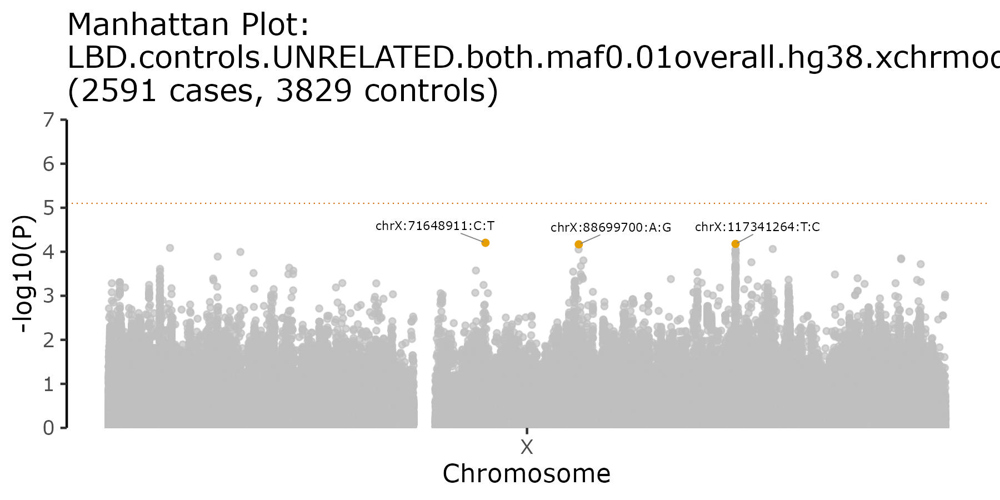

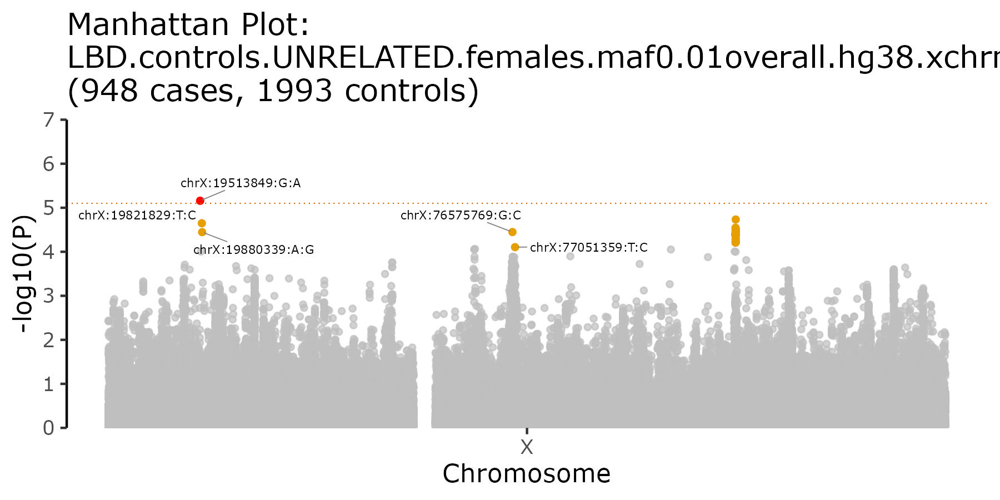

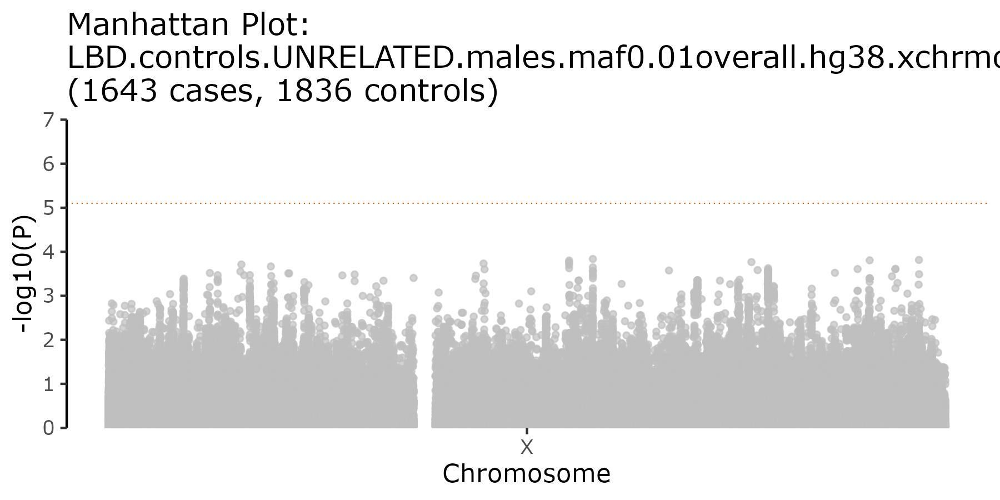

In [2]:
from IPython.display import display
from PIL import Image

print("Manhattan and QQ plots for XWAS analysis (maf overall > 0.01)")

manhattan="cond_ApoE4/both/LBD.controls.UNRELATED.both.maf0.01overall.hg38.xchrmodel2.glm.manhattan_v1.jpeg"
display(Image.open(manhattan))

manhattan="cond_ApoE4/females_only/LBD.controls.UNRELATED.females.maf0.01overall.hg38.xchrmodel2.glm.manhattan_v1.jpeg"
display(Image.open(manhattan))

manhattan="cond_ApoE4/males_only/LBD.controls.UNRELATED.males.maf0.01overall.hg38.xchrmodel2.glm.manhattan_v1.jpeg"
display(Image.open(manhattan))


Manhattan and QQ plots for XWAS analysis (maf overall > 0.001)


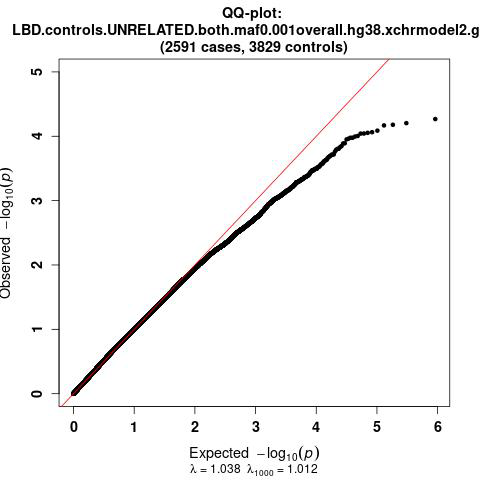

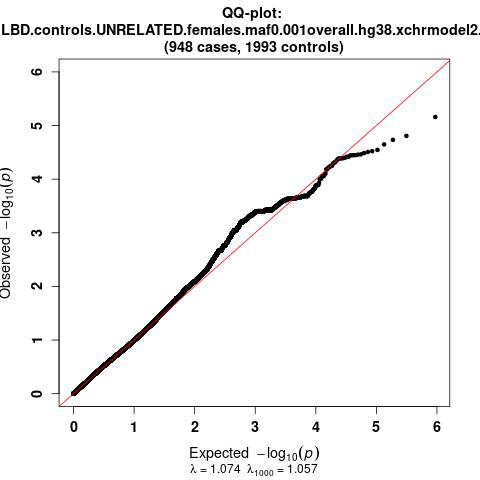

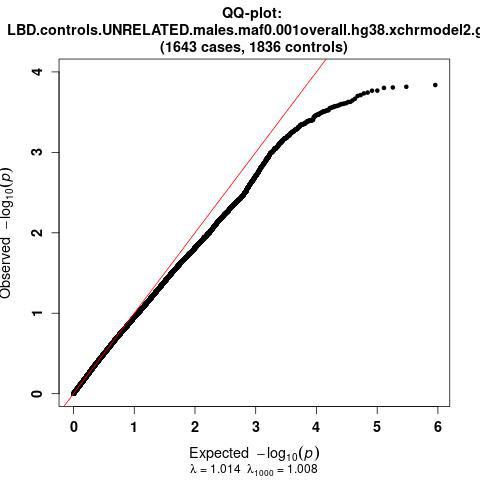

In [14]:
from IPython.display import display
from PIL import Image

print("Manhattan and QQ plots for XWAS analysis (maf overall > 0.001)")

manhattan="cond_ApoE4/both/LBD.controls.UNRELATED.both.maf0.001overall.hg38.xchrmodel2.glm.QQ.jpeg"
display(Image.open(manhattan))

manhattan="cond_ApoE4/females_only/LBD.controls.UNRELATED.females.maf0.001overall.hg38.xchrmodel2.glm.QQ.jpeg"
display(Image.open(manhattan))

manhattan="cond_ApoE4/males_only/LBD.controls.UNRELATED.males.maf0.001overall.hg38.xchrmodel2.glm.QQ.jpeg"
display(Image.open(manhattan))


### GWAS (from chromosome-X PCs corrected anaysis)

In [ ]:
%%bash
DATA="/data/ALS_50k/DementiaSeq.TopmedJointCalled.June2020/LBD/Analysis.XWAS_GLM/cond_ApoE4_x-pc/"

echo "Number of cases and controls included in analysis"
awk '{if($3 != "NA") print}' OFS="\t" $DATA/COVARIATES.freeze9.LBD.controls.UNRELATED.both_clean.ApoE_genotype_using_x-PCs.txt | cut -f8 | sort | uniq -c

echo "Sex break down in controls"
awk '{if($3 != "NA" && $8 == "Control") print}' OFS="\t" $DATA/COVARIATES.freeze9.LBD.controls.UNRELATED.both_clean.ApoE_genotype_using_x-PCs.txt | cut -f3 | sort | uniq -c

echo "Sex break down in cases"
awk '{if($3 != "NA" && $8 == "LBD") print}' OFS="\t" $DATA/COVARIATES.freeze9.LBD.controls.UNRELATED.both_clean.ApoE_genotype_using_x-PCs.txt | cut -f3 | sort | uniq -c

In [ ]:
%%bash
DATA="/data/ALS_50k/DementiaSeq.TopmedJointCalled.June2020/LBD/Analysis.XWAS_GLM/"

# filter snp by overall maf
cd $DATA/cond_ApoE4_x-pc/both
CASES="2591"
CONTROLS="3829"
Rscript ${DATA}/QQ_manhattan_plots_GLMresults.FromImputed.FilterMAFoverall.chrX_updatedMay2023.R \
LBD.controls.UNRELATED.chrX.AFFECTION_STATUS.glm.logistic.hybrid \
${CASES} ${CONTROLS} \
LBD.controls.UNRELATED.both \
0.01

Rscript ${DATA}/QQ_manhattan_plots_GLMresults.FromImputed.FilterMAFoverall.chrX_updatedMay2023.R \
LBD.controls.UNRELATED.chrX.AFFECTION_STATUS.glm.logistic.hybrid \
${CASES} ${CONTROLS} \
LBD.controls.UNRELATED.both \
0.001

cd $DATA/cond_ApoE4_x-pc/females_only
CASES="948"
CONTROLS="1993"
Rscript ${DATA}/QQ_manhattan_plots_GLMresults.FromImputed.FilterMAFoverall.chrX_updatedMay2023.R \
LBD.controls.UNRELATED.chrX.AFFECTION_STATUS.glm.logistic.hybrid \
${CASES} ${CONTROLS} \
LBD.controls.UNRELATED.females \
0.01

Rscript ${DATA}/QQ_manhattan_plots_GLMresults.FromImputed.FilterMAFoverall.chrX_updatedMay2023.R \
LBD.controls.UNRELATED.chrX.AFFECTION_STATUS.glm.logistic.hybrid \
${CASES} ${CONTROLS} \
LBD.controls.UNRELATED.females \
0.001

cd $DATA/cond_ApoE4_x-pc/males_only
CASES="1643"
CONTROLS="1836"
Rscript ${DATA}/QQ_manhattan_plots_GLMresults.FromImputed.FilterMAFoverall.chrX_updatedMay2023.R \
LBD.controls.UNRELATED.chrX.AFFECTION_STATUS.glm.logistic.hybrid \
${CASES} ${CONTROLS} \
LBD.controls.UNRELATED.males \
0.01

Rscript ${DATA}/QQ_manhattan_plots_GLMresults.FromImputed.FilterMAFoverall.chrX_updatedMay2023.R \
LBD.controls.UNRELATED.chrX.AFFECTION_STATUS.glm.logistic.hybrid \
${CASES} ${CONTROLS} \
LBD.controls.UNRELATED.males \
0.001


Manhattan plots for XWAS analysis (maf overall > 0.01)


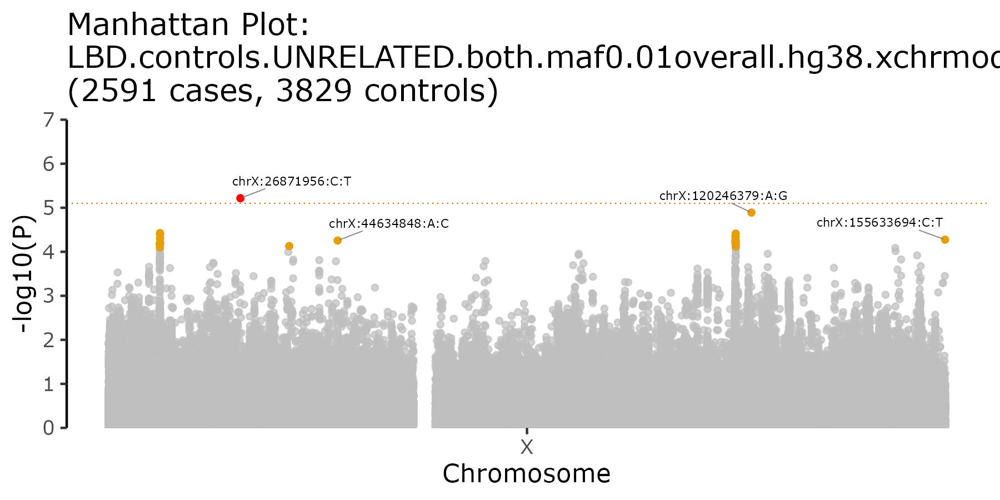

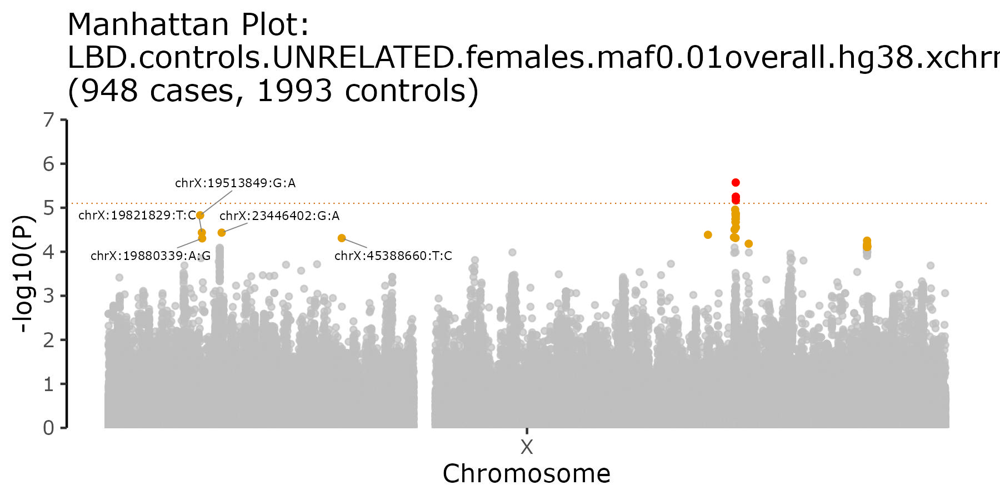

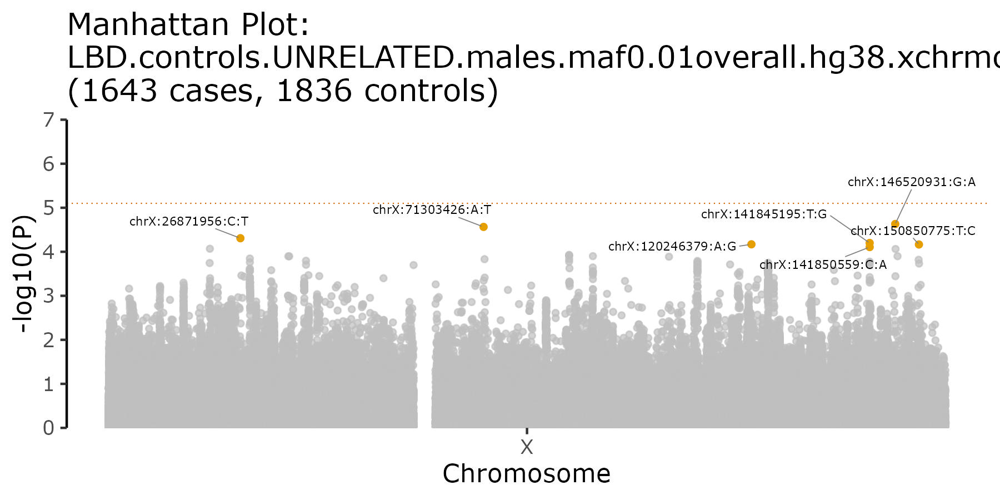

In [22]:
from IPython.display import display
from PIL import Image

print("Manhattan plots for XWAS analysis (maf overall > 0.01)")

manhattan="cond_ApoE4_x-pc/both/LBD.controls.UNRELATED.both.maf0.01overall.hg38.xchrmodel2.glm.manhattan_v1.jpeg"
display(Image.open(manhattan))

manhattan="cond_ApoE4_x-pc/females_only/LBD.controls.UNRELATED.females.maf0.01overall.hg38.xchrmodel2.glm.manhattan_v1.jpeg"
display(Image.open(manhattan))

manhattan="cond_ApoE4_x-pc/males_only/LBD.controls.UNRELATED.males.maf0.01overall.hg38.xchrmodel2.glm.manhattan_v1.jpeg"
display(Image.open(manhattan))

QQ plots for XWAS analysis (maf overall > 0.001)


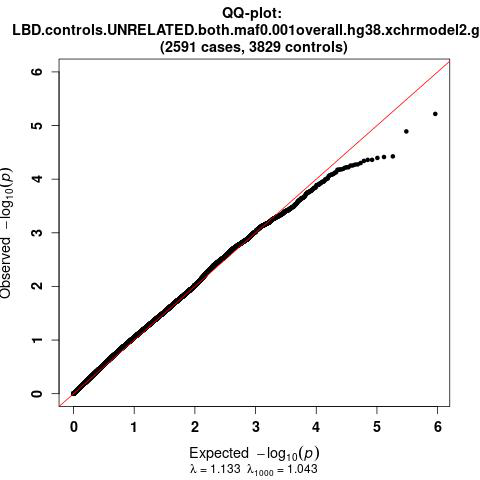

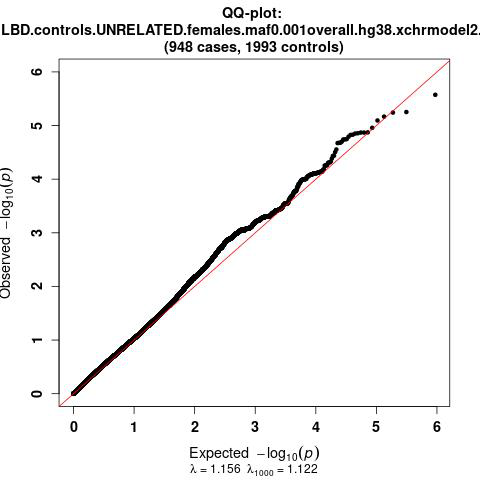

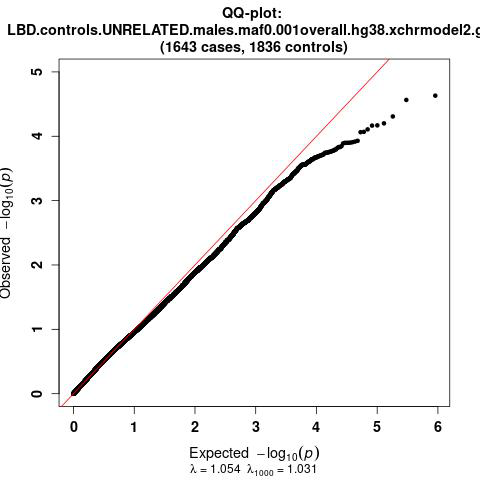

In [24]:
from IPython.display import display
from PIL import Image

print("QQ plots for XWAS analysis (maf overall > 0.001)")

manhattan="cond_ApoE4_x-pc/both/LBD.controls.UNRELATED.both.maf0.001overall.hg38.xchrmodel2.glm.QQ.jpeg"
display(Image.open(manhattan))

manhattan="cond_ApoE4_x-pc/females_only/LBD.controls.UNRELATED.females.maf0.001overall.hg38.xchrmodel2.glm.QQ.jpeg"
display(Image.open(manhattan))

manhattan="cond_ApoE4_x-pc/males_only/LBD.controls.UNRELATED.males.maf0.001overall.hg38.xchrmodel2.glm.QQ.jpeg"
display(Image.open(manhattan))

### GWAS (from chromosome-X-autosomal PCs corrected anaysis)

In [20]:
%%bash
DATA="/data/ALS_50k/DementiaSeq.TopmedJointCalled.June2020/LBD/Analysis.XWAS_GLM/cond_ApoE4_x-autosomal-pc/"

echo "Number of cases and controls included in analysis"
awk '{if($3 != "NA") print}' OFS="\t" $DATA/COVARIATES.freeze9.LBD.controls.UNRELATED.both_clean.ApoE_genotype_using_x-autosomal-PCs.txt | cut -f8 | sort | uniq -c

echo "Sex break down in controls"
awk '{if($3 != "NA" && $8 == "Control") print}' OFS="\t" $DATA/COVARIATES.freeze9.LBD.controls.UNRELATED.both_clean.ApoE_genotype_using_x-autosomal-PCs.txt | cut -f3 | sort | uniq -c

echo "Sex break down in cases"
awk '{if($3 != "NA" && $8 == "LBD") print}' OFS="\t" $DATA/COVARIATES.freeze9.LBD.controls.UNRELATED.both_clean.ApoE_genotype_using_x-autosomal-PCs.txt | cut -f3 | sort | uniq -c

Number of cases and controls included in analysis
   3829 Control
      1 DIAGNOSIS
   2591 LBD
Sex break down in controls
   1836 1.0
   1993 2.0
Sex break down in cases
   1643 1.0
    948 2.0


In [21]:
%%bash
DATA="/data/ALS_50k/DementiaSeq.TopmedJointCalled.June2020/LBD/Analysis.XWAS_GLM/"

# filter snp by overall maf
cd $DATA/cond_ApoE4_x-autosomal-pc/both
CASES="2591"
CONTROLS="3829"
Rscript ${DATA}/QQ_manhattan_plots_GLMresults.FromImputed.FilterMAFoverall.chrX_updatedMay2023.R \
LBD.controls.UNRELATED.chrX.AFFECTION_STATUS.glm.logistic.hybrid \
${CASES} ${CONTROLS} \
LBD.controls.UNRELATED.both \
0.01

Rscript ${DATA}/QQ_manhattan_plots_GLMresults.FromImputed.FilterMAFoverall.chrX_updatedMay2023.R \
LBD.controls.UNRELATED.chrX.AFFECTION_STATUS.glm.logistic.hybrid \
${CASES} ${CONTROLS} \
LBD.controls.UNRELATED.both \
0.001

cd $DATA/cond_ApoE4_x-autosomal-pc/females_only
CASES="948"
CONTROLS="1993"
Rscript ${DATA}/QQ_manhattan_plots_GLMresults.FromImputed.FilterMAFoverall.chrX_updatedMay2023.R \
LBD.controls.UNRELATED.chrX.AFFECTION_STATUS.glm.logistic.hybrid \
${CASES} ${CONTROLS} \
LBD.controls.UNRELATED.females \
0.01

Rscript ${DATA}/QQ_manhattan_plots_GLMresults.FromImputed.FilterMAFoverall.chrX_updatedMay2023.R \
LBD.controls.UNRELATED.chrX.AFFECTION_STATUS.glm.logistic.hybrid \
${CASES} ${CONTROLS} \
LBD.controls.UNRELATED.females \
0.001

cd $DATA/cond_ApoE4_x-autosomal-pc/males_only
CASES="1643"
CONTROLS="1836"
Rscript ${DATA}/QQ_manhattan_plots_GLMresults.FromImputed.FilterMAFoverall.chrX_updatedMay2023.R \
LBD.controls.UNRELATED.chrX.AFFECTION_STATUS.glm.logistic.hybrid \
${CASES} ${CONTROLS} \
LBD.controls.UNRELATED.males \
0.01

Rscript ${DATA}/QQ_manhattan_plots_GLMresults.FromImputed.FilterMAFoverall.chrX_updatedMay2023.R \
LBD.controls.UNRELATED.chrX.AFFECTION_STATUS.glm.logistic.hybrid \
${CASES} ${CONTROLS} \
LBD.controls.UNRELATED.males \
0.001


── Attaching core tidyverse packages ──────────────────────── tidyverse 2.0.0 ──
✔ dplyr     1.1.4     ✔ readr     2.1.4
✔ forcats   1.0.0     ✔ stringr   1.5.1
✔ ggplot2   3.4.4     ✔ tibble    3.2.1
✔ lubridate 1.9.3     ✔ tidyr     1.3.0
✔ purrr     1.0.2     
── Conflicts ────────────────────────────────────────── tidyverse_conflicts() ──
✖ dplyr::filter() masks stats::filter()
✖ dplyr::lag()    masks stats::lag()
ℹ Use the conflicted package (<http://conflicted.r-lib.org/>) to force all conflicts to become errors
Loading required package: data.table

Attaching package: ‘data.table’

The following objects are masked from ‘package:lubridate’:

    hour, isoweek, mday, minute, month, quarter, second, wday, week,
    yday, year

The following objects are masked from ‘package:dplyr’:

    between, first, last

The following object is masked from ‘package:purrr’:

    transpose



[1] "Reading in glm files and filtering MAF"
[1] "Calculating lambda"
[1] "Lambda(raw) = 1.07490349938737"
[1] "Lambda(1000) = 1.02423563263855"


Loading required package: qqman

For example usage please run: vignette('qqman')

Citation appreciated but not required:
Turner, (2018). qqman: an R package for visualizing GWAS results using Q-Q and manhattan plots. Journal of Open Source Software, 3(25), 731, https://doi.org/10.21105/joss.00731.



[1] "Graphing QQ plot"
null device 
          1 
[1] "Number of haploblocks = 6296"
[1] "P threshold = 7.9415501905972e-06"
[1] "-log10(P) threshold = 5.10009471501499"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact



[1] "Graphing Manhattan plots"


Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 


[1] "Saving Manhattan plots"


── Attaching core tidyverse packages ──────────────────────── tidyverse 2.0.0 ──
✔ dplyr     1.1.4     ✔ readr     2.1.4
✔ forcats   1.0.0     ✔ stringr   1.5.1
✔ ggplot2   3.4.4     ✔ tibble    3.2.1
✔ lubridate 1.9.3     ✔ tidyr     1.3.0
✔ purrr     1.0.2     
── Conflicts ────────────────────────────────────────── tidyverse_conflicts() ──
✖ dplyr::filter() masks stats::filter()
✖ dplyr::lag()    masks stats::lag()
ℹ Use the conflicted package (<http://conflicted.r-lib.org/>) to force all conflicts to become errors
Loading required package: data.table

Attaching package: ‘data.table’

The following objects are masked from ‘package:lubridate’:

    hour, isoweek, mday, minute, month, quarter, second, wday, week,
    yday, year

The following objects are masked from ‘package:dplyr’:

    between, first, last

The following object is masked from ‘package:purrr’:

    transpose



[1] "Reading in glm files and filtering MAF"
[1] "Calculating lambda"
[1] "Lambda(raw) = 1.04479546656012"
[1] "Lambda(1000) = 1.01449393526742"


Loading required package: qqman

For example usage please run: vignette('qqman')

Citation appreciated but not required:
Turner, (2018). qqman: an R package for visualizing GWAS results using Q-Q and manhattan plots. Journal of Open Source Software, 3(25), 731, https://doi.org/10.21105/joss.00731.



[1] "Graphing QQ plot"
null device 
          1 
[1] "Number of haploblocks = 6296"
[1] "P threshold = 7.9415501905972e-06"
[1] "-log10(P) threshold = 5.10009471501499"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact



[1] "Graphing Manhattan plots"


Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 


[1] "Saving Manhattan plots"


── Attaching core tidyverse packages ──────────────────────── tidyverse 2.0.0 ──
✔ dplyr     1.1.4     ✔ readr     2.1.4
✔ forcats   1.0.0     ✔ stringr   1.5.1
✔ ggplot2   3.4.4     ✔ tibble    3.2.1
✔ lubridate 1.9.3     ✔ tidyr     1.3.0
✔ purrr     1.0.2     
── Conflicts ────────────────────────────────────────── tidyverse_conflicts() ──
✖ dplyr::filter() masks stats::filter()
✖ dplyr::lag()    masks stats::lag()
ℹ Use the conflicted package (<http://conflicted.r-lib.org/>) to force all conflicts to become errors
Loading required package: data.table

Attaching package: ‘data.table’

The following objects are masked from ‘package:lubridate’:

    hour, isoweek, mday, minute, month, quarter, second, wday, week,
    yday, year

The following objects are masked from ‘package:dplyr’:

    between, first, last

The following object is masked from ‘package:purrr’:

    transpose



[1] "Reading in glm files and filtering MAF"
[1] "Calculating lambda"
[1] "Lambda(raw) = 1.10625660945395"
[1] "Lambda(1000) = 1.08269996898535"


Loading required package: qqman

For example usage please run: vignette('qqman')

Citation appreciated but not required:
Turner, (2018). qqman: an R package for visualizing GWAS results using Q-Q and manhattan plots. Journal of Open Source Software, 3(25), 731, https://doi.org/10.21105/joss.00731.



[1] "Graphing QQ plot"
null device 
          1 
[1] "Number of haploblocks = 6296"
[1] "P threshold = 7.9415501905972e-06"
[1] "-log10(P) threshold = 5.10009471501499"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact



[1] "Graphing Manhattan plots"


Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 


[1] "Saving Manhattan plots"


Warning message:
ggrepel: 22 unlabeled data points (too many overlaps). Consider increasing max.overlaps 
── Attaching core tidyverse packages ──────────────────────── tidyverse 2.0.0 ──
✔ dplyr     1.1.4     ✔ readr     2.1.4
✔ forcats   1.0.0     ✔ stringr   1.5.1
✔ ggplot2   3.4.4     ✔ tibble    3.2.1
✔ lubridate 1.9.3     ✔ tidyr     1.3.0
✔ purrr     1.0.2     
── Conflicts ────────────────────────────────────────── tidyverse_conflicts() ──
✖ dplyr::filter() masks stats::filter()
✖ dplyr::lag()    masks stats::lag()
ℹ Use the conflicted package (<http://conflicted.r-lib.org/>) to force all conflicts to become errors
Loading required package: data.table

Attaching package: ‘data.table’

The following objects are masked from ‘package:lubridate’:

    hour, isoweek, mday, minute, month, quarter, second, wday, week,
    yday, year

The following objects are masked from ‘package:dplyr’:

    between, first, last

The following object is masked from ‘package:purrr’:

    transpose



[1] "Reading in glm files and filtering MAF"
[1] "Calculating lambda"
[1] "Lambda(raw) = 1.06759143203507"
[1] "Lambda(1000) = 1.05260669770757"


Loading required package: qqman

For example usage please run: vignette('qqman')

Citation appreciated but not required:
Turner, (2018). qqman: an R package for visualizing GWAS results using Q-Q and manhattan plots. Journal of Open Source Software, 3(25), 731, https://doi.org/10.21105/joss.00731.



[1] "Graphing QQ plot"
null device 
          1 
[1] "Number of haploblocks = 6296"
[1] "P threshold = 7.9415501905972e-06"
[1] "-log10(P) threshold = 5.10009471501499"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact



[1] "Graphing Manhattan plots"


Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 


[1] "Saving Manhattan plots"


Warning message:
ggrepel: 27 unlabeled data points (too many overlaps). Consider increasing max.overlaps 
── Attaching core tidyverse packages ──────────────────────── tidyverse 2.0.0 ──
✔ dplyr     1.1.4     ✔ readr     2.1.4
✔ forcats   1.0.0     ✔ stringr   1.5.1
✔ ggplot2   3.4.4     ✔ tibble    3.2.1
✔ lubridate 1.9.3     ✔ tidyr     1.3.0
✔ purrr     1.0.2     
── Conflicts ────────────────────────────────────────── tidyverse_conflicts() ──
✖ dplyr::filter() masks stats::filter()
✖ dplyr::lag()    masks stats::lag()
ℹ Use the conflicted package (<http://conflicted.r-lib.org/>) to force all conflicts to become errors
Loading required package: data.table

Attaching package: ‘data.table’

The following objects are masked from ‘package:lubridate’:

    hour, isoweek, mday, minute, month, quarter, second, wday, week,
    yday, year

The following objects are masked from ‘package:dplyr’:

    between, first, last

The following object is masked from ‘package:purrr’:

    transpose



[1] "Reading in glm files and filtering MAF"
[1] "Calculating lambda"
[1] "Lambda(raw) = 0.994937587627187"
[1] "Lambda(1000) = 0.997080747157841"


Loading required package: qqman

For example usage please run: vignette('qqman')

Citation appreciated but not required:
Turner, (2018). qqman: an R package for visualizing GWAS results using Q-Q and manhattan plots. Journal of Open Source Software, 3(25), 731, https://doi.org/10.21105/joss.00731.



[1] "Graphing QQ plot"
null device 
          1 
[1] "Number of haploblocks = 6296"
[1] "P threshold = 7.9415501905972e-06"
[1] "-log10(P) threshold = 5.10009471501499"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact



[1] "Graphing Manhattan plots"


Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 


[1] "Saving Manhattan plots"


── Attaching core tidyverse packages ──────────────────────── tidyverse 2.0.0 ──
✔ dplyr     1.1.4     ✔ readr     2.1.4
✔ forcats   1.0.0     ✔ stringr   1.5.1
✔ ggplot2   3.4.4     ✔ tibble    3.2.1
✔ lubridate 1.9.3     ✔ tidyr     1.3.0
✔ purrr     1.0.2     
── Conflicts ────────────────────────────────────────── tidyverse_conflicts() ──
✖ dplyr::filter() masks stats::filter()
✖ dplyr::lag()    masks stats::lag()
ℹ Use the conflicted package (<http://conflicted.r-lib.org/>) to force all conflicts to become errors
Loading required package: data.table

Attaching package: ‘data.table’

The following objects are masked from ‘package:lubridate’:

    hour, isoweek, mday, minute, month, quarter, second, wday, week,
    yday, year

The following objects are masked from ‘package:dplyr’:

    between, first, last

The following object is masked from ‘package:purrr’:

    transpose



[1] "Reading in glm files and filtering MAF"
[1] "Calculating lambda"
[1] "Lambda(raw) = 1.01414408946361"
[1] "Lambda(1000) = 1.00815622480463"


Loading required package: qqman

For example usage please run: vignette('qqman')

Citation appreciated but not required:
Turner, (2018). qqman: an R package for visualizing GWAS results using Q-Q and manhattan plots. Journal of Open Source Software, 3(25), 731, https://doi.org/10.21105/joss.00731.



[1] "Graphing QQ plot"
null device 
          1 
[1] "Number of haploblocks = 6296"
[1] "P threshold = 7.9415501905972e-06"
[1] "-log10(P) threshold = 5.10009471501499"


------------------------------------------------------------------------------
You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)
------------------------------------------------------------------------------

Attaching package: ‘plyr’

The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:purrr’:

    compact



[1] "Graphing Manhattan plots"


Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead. 
2: The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead. 


[1] "Saving Manhattan plots"


Manhattan plots for XWAS analysis (maf overall > 0.01)


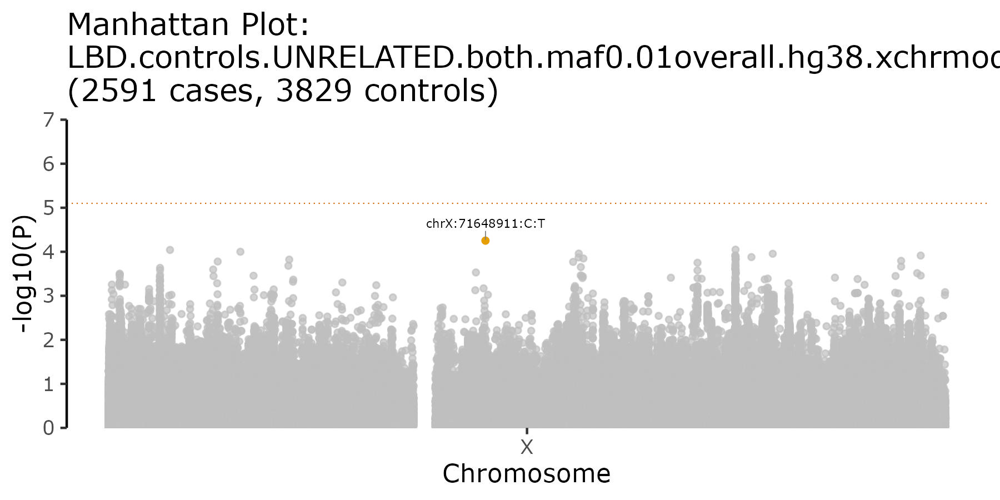

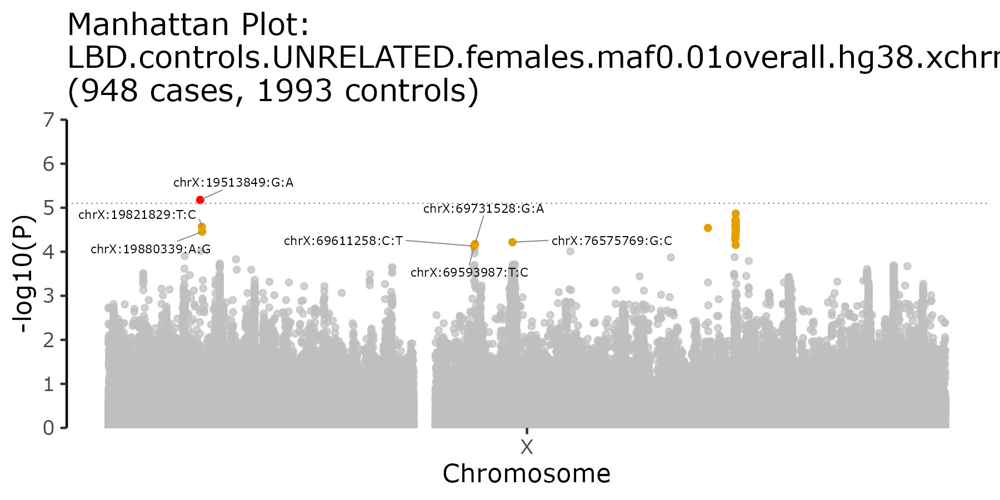

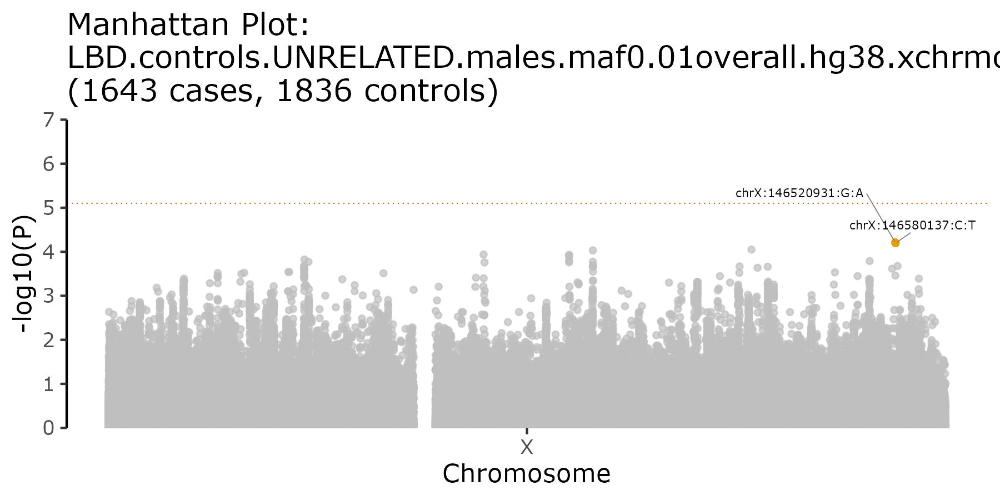

In [22]:
from IPython.display import display
from PIL import Image

print("Manhattan plots for XWAS analysis (maf overall > 0.01)")

manhattan="cond_ApoE4_x-autosomal-pc/both/LBD.controls.UNRELATED.both.maf0.01overall.hg38.xchrmodel2.glm.manhattan_v1.jpeg"
display(Image.open(manhattan))

manhattan="cond_ApoE4_x-autosomal-pc/females_only/LBD.controls.UNRELATED.females.maf0.01overall.hg38.xchrmodel2.glm.manhattan_v1.jpeg"
display(Image.open(manhattan))

manhattan="cond_ApoE4_x-autosomal-pc/males_only/LBD.controls.UNRELATED.males.maf0.01overall.hg38.xchrmodel2.glm.manhattan_v1.jpeg"
display(Image.open(manhattan))

QQ plots for XWAS analysis (maf overall > 0.001)


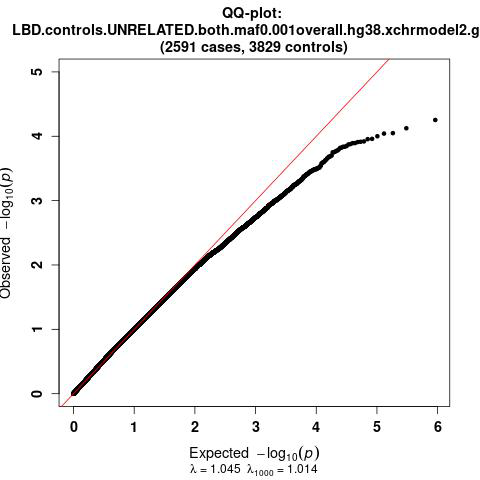

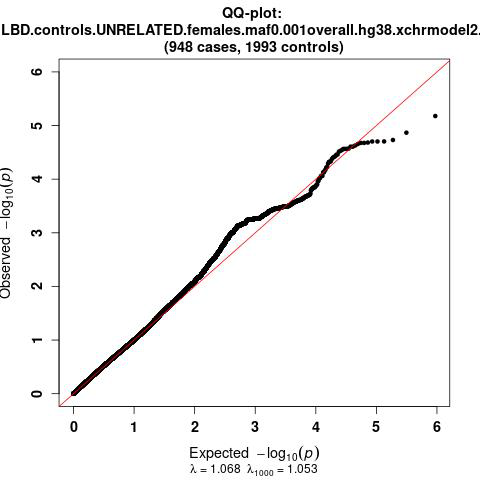

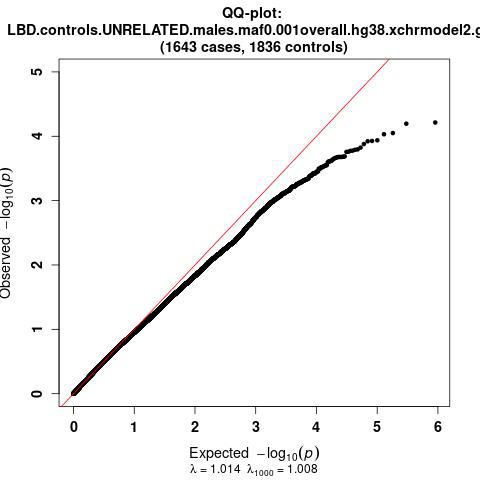

In [23]:
from IPython.display import display
from PIL import Image

print("QQ plots for XWAS analysis (maf overall > 0.001)")

manhattan="cond_ApoE4_x-autosomal-pc/both/LBD.controls.UNRELATED.both.maf0.001overall.hg38.xchrmodel2.glm.QQ.jpeg"
display(Image.open(manhattan))

manhattan="cond_ApoE4_x-autosomal-pc/females_only/LBD.controls.UNRELATED.females.maf0.001overall.hg38.xchrmodel2.glm.QQ.jpeg"
display(Image.open(manhattan))

manhattan="cond_ApoE4_x-autosomal-pc/males_only/LBD.controls.UNRELATED.males.maf0.001overall.hg38.xchrmodel2.glm.QQ.jpeg"
display(Image.open(manhattan))

In [37]:
import pandas as pd
import numpy as np
#glm = pd.read_csv("cond_ApoE4_x-autosomal-pc/females_only/toMeta.LBD.controls.UNRELATED.females.hg38.chrX.tab", sep ="\t")
glm[(glm.P < 0.05/6296 *3) & (glm.Freq_EffectAllele > 0.01)].sort_values(by=['P'])

,CHROM,POS,ID,marker,EffectAllele,OtherAllele,OR,BETA,SE,P,Freq_EffectAllele,Freq_EffectAllele.CASE,Freq_EffectAllele.CTRL,ALLELE_CT,CASE_ALLELE_CT,CTRL_ALLELE_CT,EffectAllele_CT,EffectAllele_CT.CASE,EffectAllele_CT.CTRL
232410,X,19513849,chrX:19513849:G:A,X:19513849:G:A,A,G,2.42456,0.885650,0.196616,0.000007,0.020911,0.032173,0.015554,5882,1896,3986,123,61,62
1517096,X,117373825,chrX:117373825:A:T,X:117373825:A:T,T,A,1.34853,0.299015,0.068731,0.000014,0.237504,0.273207,0.220522,5882,1896,3986,1397,518,879
1516624,X,117342494,chrX:117342494:C:T,X:117342494:C:T,T,C,1.33892,0.291863,0.068176,0.000019,0.247705,0.279536,0.232564,5882,1896,3986,1457,530,927
1516635,X,117343445,chrX:117343445:C:A,X:117343445:C:A,A,C,1.33802,0.291191,0.068237,0.000020,0.247875,0.279536,0.232815,5882,1896,3986,1458,530,928
1517225,X,117382755,chrX:117382755:A:G,X:117382755:A:G,G,A,1.34096,0.293386,0.068763,0.000020,0.238354,0.272679,0.222027,5882,1896,3986,1402,517,885
1517465,X,117396820,chrX:117396820:G:A,X:117396820:G:A,A,G,1.34078,0.293252,0.068893,0.000021,0.238864,0.273734,0.222278,5882,1896,3986,1405,519,886
1516998,X,117366012,chrX:117366012:A:G,X:117366012:A:G,G,A,1.33721,0.290585,0.068321,0.000021,0.246175,0.277954,0.231059,5882,1896,3986,1448,527,921
1517046,X,117369560,chrX:117369560:T:C,X:117369560:T:C,C,T,1.33753,0.290825,0.068380,0.000021,0.245835,0.277426,0.230808,5882,1896,3986,1446,526,920
1517489,X,117398160,chrX:117398160:T:C,X:117398160:T:C,C,T,1.34007,0.292722,0.068999,0.000022,0.238014,0.272679,0.221525,5882,1896,3986,1400,517,883
1517179,X,117379801,chrX:117379801:G:A,X:117379801:G:A,A,G,1.33585,0.289568,0.068489,0.000024,0.245155,0.276899,0.230055,5882,1896,3986,1442,525,917


## **UPDATED 12-28-2023 conditioned ApoE:** Merge summary stats with hg38 rsid file to get rsids

**Notes:**

Location of rsid hg38 for chr X file: `/data/ALS_50k/DementiaSeq.TopmedJointCalled.June2020/LBD/Analysis.XWAS/hg38_rsID_AUG2019_goodFormat.ALLFINAL_chr23.txt`

Summ stats to use from the XWAS analysis asjusting for covariates from merged x-autosomal PCs):
- both (joint): `/data/ALS_50k/DementiaSeq.TopmedJointCalled.June2020/LBD/Analysis.XWAS_GLM/RWAS_redo/cond_ApoE4/both/toMeta.LBD.controls.UNRELATED.both.maf0.01overall.hg38.chrX.tab`

- females: `/data/ALS_50k/DementiaSeq.TopmedJointCalled.June2020/LBD/Analysis.XWAS_GLM/RWAS_redo/cond_ApoE4/females_only/toMeta.LBD.controls.UNRELATED.females.maf0.01overall.hg38.chrX.tab`

- males: `/data/ALS_50k/DementiaSeq.TopmedJointCalled.June2020/LBD/Analysis.XWAS_GLM/RWAS_redo/cond_ApoE4/males_only/toMeta.LBD.controls.UNRELATED.males.maf0.01overall.hg38.chrX.tab`

In [27]:
%%bash
module load R/4.3
R --vanilla --no-save

# Load required libraries
require(data.table)
require(tidyverse)

# read in map
rsid <- fread("/data/ALS_50k/DementiaSeq.TopmedJointCalled.June2020/LBD/Analysis.XWAS/hg38_rsID_AUG2019_goodFormat.ALLFINAL_chr23.txt",header=F)
colnames(rsid) <- c("markerID","rsID","CHROM","POS","REF","ALT")
rsid$CHROM <- gsub("23","X", rsid$CHROM)


## ApoE4 conditioned results for females only ##
data <- fread("/data/ALS_50k/DementiaSeq.TopmedJointCalled.June2020/LBD/Analysis.XWAS_GLM/RWAS_redo/cond_ApoE4/both/toMeta.LBD.controls.UNRELATED.both.maf0.01overall.hg38.chrX.tab", header=T)
data1 <- data %>% filter(!is.na(P))

# Merge files - make sure to flip alleles to make sure to account for any REF/ALT mismatch --> save file
merge1 <- merge(data1, rsid[,2:6], by.x=c("CHROM","POS","OtherAllele","EffectAllele"),by.y=c("CHROM","POS","REF","ALT"))
merge2 <- subset(data1, !(data1$ID %in% merge1$ID))
merge3 <- merge(merge2, rsid[,2:6], by.x=c("CHROM","POS","OtherAllele","EffectAllele"),by.y=c("CHROM","POS","ALT","REF"))
merge4 <- rbind(merge1,merge3)
merge5 <- subset(data1, !(data1$ID %in% merge4$ID)) %>% mutate(rsID = "NA")
mergeFINAL <- rbind(merge4,merge5) %>% arrange(CHROM,POS)
write.table(mergeFINAL, "/data/ALS_50k/DementiaSeq.TopmedJointCalled.June2020/LBD/Analysis.XWAS_GLM/cond_ApoE4_x-autosomal-pc/both/toMeta.LBD.controls.UNRELATED.both.maf0.01overall.hg38.chrX.rsid.txt", quote=F,row.names=F,col.names=T,sep="\t")


## ApoE4 conditioned results for females only ##
data <- fread("/data/ALS_50k/DementiaSeq.TopmedJointCalled.June2020/LBD/Analysis.XWAS_GLM/RWAS_redo/cond_ApoE4/females_only/toMeta.LBD.controls.UNRELATED.females.maf0.01overall.hg38.chrX.tab", header=T)
data1 <- data %>% filter(!is.na(P))

# Merge files - make sure to flip alleles to make sure to account for any REF/ALT mismatch --> save file
merge1 <- merge(data1, rsid[,2:6], by.x=c("CHROM","POS","OtherAllele","EffectAllele"),by.y=c("CHROM","POS","REF","ALT"))
merge2 <- subset(data1, !(data1$ID %in% merge1$ID))
merge3 <- merge(merge2, rsid[,2:6], by.x=c("CHROM","POS","OtherAllele","EffectAllele"),by.y=c("CHROM","POS","ALT","REF"))
merge4 <- rbind(merge1,merge3)
merge5 <- subset(data1, !(data1$ID %in% merge4$ID)) %>% mutate(rsID = "NA")
mergeFINAL <- rbind(merge4,merge5) %>% arrange(CHROM,POS)
write.table(mergeFINAL, "/data/ALS_50k/DementiaSeq.TopmedJointCalled.June2020/LBD/Analysis.XWAS_GLM/cond_ApoE4_x-autosomal-pc/females_only/toMeta.LBD.controls.UNRELATED.females.maf0.01overall.hg38.chrX.rsid.txt", quote=F,row.names=F,col.names=T,sep="\t")



## ApoE4 conditioned results for males only ##
data <- fread("/data/ALS_50k/DementiaSeq.TopmedJointCalled.June2020/LBD/Analysis.XWAS_GLM/RWAS_redo/cond_ApoE4/males_only/toMeta.LBD.controls.UNRELATED.males.maf0.01overall.hg38.chrX.tab", header=T)
data1 <- data %>% filter(!is.na(P))

# Merge files - make sure to flip alleles to make sure to account for any REF/ALT mismatch --> save file
merge1 <- merge(data1, rsid[,2:6], by.x=c("CHROM","POS","OtherAllele","EffectAllele"),by.y=c("CHROM","POS","REF","ALT"))
merge2 <- subset(data1, !(data1$ID %in% merge1$ID))
merge3 <- merge(merge2, rsid[,2:6], by.x=c("CHROM","POS","OtherAllele","EffectAllele"),by.y=c("CHROM","POS","ALT","REF"))
merge4 <- rbind(merge1,merge3)
merge5 <- subset(data1, !(data1$ID %in% merge4$ID)) %>% mutate(rsID = "NA")
mergeFINAL <- rbind(merge4,merge5) %>% arrange(CHROM,POS)
write.table(mergeFINAL, "/data/ALS_50k/DementiaSeq.TopmedJointCalled.June2020/LBD/Analysis.XWAS_GLM/cond_ApoE4_x-autosomal-pc/males_only/toMeta.LBD.controls.UNRELATED.males.maf0.01overall.hg38.chrX.rsid.txt", quote=F,row.names=F,col.names=T,sep="\t")


[-] Unloading gcc  11.3.0  ... 
[-] Unloading HDF5  1.12.2 
[-] Unloading netcdf  4.9.0 
[-] Unloading openmpi/4.1.3/gcc-11.3.0  ... 
[-] Unloading pandoc  2.18  on cn2294 
[-] Unloading R 4.3.0 
[+] Loading gcc  11.3.0  ... 
[+] Loading HDF5  1.12.2 
[+] Loading netcdf  4.9.0 
[-] Unloading gcc  11.3.0  ... 
[+] Loading gcc  11.3.0  ... 
[+] Loading openmpi/4.1.3/gcc-11.3.0  ... 
[+] Loading pandoc  2.18  on cn2294 
[+] Loading R 4.3.0 



R version 4.3.0 (2023-04-21) -- "Already Tomorrow"
Copyright (C) 2023 The R Foundation for Statistical Computing
Platform: x86_64-pc-linux-gnu (64-bit)

R is free software and comes with ABSOLUTELY NO WARRANTY.
You are welcome to redistribute it under certain conditions.
Type 'license()' or 'licence()' for distribution details.

R is a collaborative project with many contributors.
Type 'contributors()' for more information and
'citation()' on how to cite R or R packages in publications.

Type 'demo()' for some demos, 'help()' for on-line help, or
'help.start()' for an HTML browser interface to help.
Type 'q()' to quit R.

> 
> # Load required libraries
> require(data.table)


Loading required package: data.table


> require(tidyverse)


Loading required package: tidyverse
── Attaching core tidyverse packages ──────────────────────── tidyverse 2.0.0 ──
✔ dplyr     1.1.4     ✔ readr     2.1.4
✔ forcats   1.0.0     ✔ stringr   1.5.1
✔ ggplot2   3.4.4     ✔ tibble    3.2.1
✔ lubridate 1.9.3     ✔ tidyr     1.3.0
✔ purrr     1.0.2     
── Conflicts ────────────────────────────────────────── tidyverse_conflicts() ──
✖ dplyr::between()     masks data.table::between()
✖ dplyr::filter()      masks stats::filter()
✖ dplyr::first()       masks data.table::first()
✖ lubridate::hour()    masks data.table::hour()
✖ lubridate::isoweek() masks data.table::isoweek()
✖ dplyr::lag()         masks stats::lag()
✖ dplyr::last()        masks data.table::last()
✖ lubridate::mday()    masks data.table::mday()
✖ lubridate::minute()  masks data.table::minute()
✖ lubridate::month()   masks data.table::month()
✖ lubridate::quarter() masks data.table::quarter()
✖ lubridate::second()  masks data.table::second()
✖ purrr::transpose()   masks data.tab

> 
> # read in map
> rsid <- fread("/data/ALS_50k/DementiaSeq.TopmedJointCalled.June2020/LBD/Analysis.XWAS/hg38_rsID_AUG2019_goodFormat.ALLFINAL_chr23.txt",header=F)
> colnames(rsid) <- c("markerID","rsID","CHROM","POS","REF","ALT")
> rsid$CHROM <- gsub("23","X", rsid$CHROM)
> 
> 
> ## ApoE4 conditioned results for females only ##
> data <- fread("/data/ALS_50k/DementiaSeq.TopmedJointCalled.June2020/LBD/Analysis.XWAS_GLM/RWAS_redo/cond_ApoE4/both/toMeta.LBD.controls.UNRELATED.both.maf0.01overall.hg38.chrX.tab", header=T)
> data1 <- data %>% filter(!is.na(P))
> 
> # Merge files - make sure to flip alleles to make sure to account for any REF/ALT mismatch --> save file
> merge1 <- merge(data1, rsid[,2:6], by.x=c("CHROM","POS","OtherAllele","EffectAllele"),by.y=c("CHROM","POS","REF","ALT"))
> merge2 <- subset(data1, !(data1$ID %in% merge1$ID))
> merge3 <- merge(merge2, rsid[,2:6], by.x=c("CHROM","POS","OtherAllele","EffectAllele"),by.y=c("CHROM","POS","ALT","REF"))
> merge4 <- rbind(merge1

### Pull out top hits from GWAS

In [28]:
import pandas as pd
import numpy as np
both = pd.read_csv("cond_ApoE4_x-autosomal-pc/both/toMeta.LBD.controls.UNRELATED.both.maf0.01overall.hg38.chrX.rsid.txt",sep="\t")
females = pd.read_csv("cond_ApoE4_x-autosomal-pc/females_only/toMeta.LBD.controls.UNRELATED.females.maf0.01overall.hg38.chrX.rsid.txt",sep="\t")
males = pd.read_csv("cond_ApoE4_x-autosomal-pc/males_only/toMeta.LBD.controls.UNRELATED.males.maf0.01overall.hg38.chrX.rsid.txt",sep="\t")

In [29]:
# for females only
females = females.rename(columns={'Allele1':'A1',
                                  'Allele2':'A2',
                                  'beta':'BETA',
                                  'SE':'BETA_SE',
                                  'Freq_EffectAllele':'MAF_EffectAllele',
                                  'Freq_EffectAllele.CASE':'MAF_EffectAllele_CASE',
                                  'Freq_EffectAllele.CTRL':'MAF_EffectAllele_CTRL',
                                  'EffectAllele_CT':'CT_EffectAllele',
                                  'EffectAllele_CT.CASE':'CT_EffectAllele_CASE',
                                  'EffectAllele_CT.CTRL':'CT_EffectAllele_CTRL'})
                                  
# calculate OR 95%CI
females['OR_low95'] = np.exp(females['BETA'] - 1.96*females['BETA_SE'])
females['OR_high95'] = np.exp(females['BETA'] + 1.96*females['BETA_SE'])

# keep columns --> save reformatted file
colsToKeep = ['CHROM', 'POS', 'ID', 'rsID', 'EffectAllele','OtherAllele',
              'BETA', 'BETA_SE', 'OR', 'OR_low95', 'OR_high95', 'P',
              'MAF_EffectAllele', 'MAF_EffectAllele_CASE','MAF_EffectAllele_CTRL',
              'CT_EffectAllele', 'CT_EffectAllele_CASE', 'CT_EffectAllele_CTRL',
              'ALLELE_CT', 'CASE_ALLELE_CT', 'CTRL_ALLELE_CT']
    
females_tidy = females[colsToKeep]
females_tidy.to_csv("cond_ApoE4_x-autosomal-pc/females_only/toMeta.LBD.controls.UNRELATED.females.maf0.01overall.hg38.chrX.rsid_REFORMATTED.txt",sep="\t",index=False,header=True)


In [30]:
# for males only
males = males.rename(columns={'Allele1':'A1',
                                  'Allele2':'A2',
                                  'beta':'BETA',
                                  'SE':'BETA_SE',
                                  'Freq_EffectAllele':'MAF_EffectAllele',
                                  'Freq_EffectAllele.CASE':'MAF_EffectAllele_CASE',
                                  'Freq_EffectAllele.CTRL':'MAF_EffectAllele_CTRL',
                                  'EffectAllele_CT':'CT_EffectAllele',
                                  'EffectAllele_CT.CASE':'CT_EffectAllele_CASE',
                                  'EffectAllele_CT.CTRL':'CT_EffectAllele_CTRL'})
                                  
# calculate OR 95%CI
males['OR_low95'] = np.exp(males['BETA'] - 1.96*males['BETA_SE'])
males['OR_high95'] = np.exp(males['BETA'] + 1.96*males['BETA_SE'])

# keep columns --> save reformatted file
colsToKeep = ['CHROM', 'POS', 'ID', 'rsID', 'EffectAllele','OtherAllele',
              'BETA', 'BETA_SE', 'OR', 'OR_low95', 'OR_high95', 'P',
              'MAF_EffectAllele', 'MAF_EffectAllele_CASE','MAF_EffectAllele_CTRL',
              'CT_EffectAllele', 'CT_EffectAllele_CASE', 'CT_EffectAllele_CTRL',
              'ALLELE_CT', 'CASE_ALLELE_CT', 'CTRL_ALLELE_CT']
    
males_tidy = males[colsToKeep]
males_tidy.to_csv("cond_ApoE4_x-autosomal-pc/males_only/toMeta.LBD.controls.UNRELATED.males.maf0.01overall.hg38.chrX.rsid_REFORMATTED.txt",sep="\t",index=False,header=True)


In [31]:
# for both
both = both.rename(columns={'Allele1':'A1',
                                  'Allele2':'A2',
                                  'beta':'BETA',
                                  'SE':'BETA_SE',
                                  'Freq_EffectAllele':'MAF_EffectAllele',
                                  'Freq_EffectAllele.CASE':'MAF_EffectAllele_CASE',
                                  'Freq_EffectAllele.CTRL':'MAF_EffectAllele_CTRL',
                                  'EffectAllele_CT':'CT_EffectAllele',
                                  'EffectAllele_CT.CASE':'CT_EffectAllele_CASE',
                                  'EffectAllele_CT.CTRL':'CT_EffectAllele_CTRL'})
                                  
# calculate OR 95%CI
both['OR_low95'] = np.exp(both['BETA'] - 1.96*both['BETA_SE'])
both['OR_high95'] = np.exp(both['BETA'] + 1.96*both['BETA_SE'])

# keep columns --> save reformatted file
colsToKeep = ['CHROM', 'POS', 'ID', 'rsID', 'EffectAllele','OtherAllele',
              'BETA', 'BETA_SE', 'OR', 'OR_low95', 'OR_high95', 'P',
              'MAF_EffectAllele', 'MAF_EffectAllele_CASE','MAF_EffectAllele_CTRL',
              'CT_EffectAllele', 'CT_EffectAllele_CASE', 'CT_EffectAllele_CTRL',
              'ALLELE_CT', 'CASE_ALLELE_CT', 'CTRL_ALLELE_CT']
    
both_tidy = both[colsToKeep]
both_tidy.to_csv("cond_ApoE4_x-autosomal-pc/both/toMeta.LBD.controls.UNRELATED.both.maf0.01overall.hg38.chrX.rsid_REFORMATTED.txt",sep="\t",index=False,header=True)


In [129]:
%%bash
module load R/4.3
R --vanilla --no-save

# load libraries
require(data.table)
require(tidyverse)

# read in meta results from females+males
# designate effect allele, and correct BETA directions if flipped
both <- fread("cond_ApoE4_x-autosomal-pc/meta.males_females/META_LBD.controls.UNRELATED.both.maf0.01overall.HetIsq80.hg38.xchrmodel2.glm_TIDY.rsid.txt") %>%
        rename(A1=Allele1, A2=Allele2, beta=BETA, BETA_SE=StdErr)
both$A1 <- toupper(both$A1)
both$A2 <- toupper(both$A2)
both$EffectAllele <- toupper(ifelse(both$A1_FREQ < 0.5, both$A1, both$A2))
both$OtherAllele <- toupper(ifelse(both$A1_FREQ < 0.5, both$A2, both$A1))
both$BETA <- ifelse(both$EffectAllele == both$A1, both$beta, -1*both$beta)
both$OR <- exp(both$BETA)
both$OR_low95 <- exp(both$BETA - 1.96*both$BETA_SE)
both$OR_high95 <- exp(both$BETA + 1.96*both$BETA_SE)

both_tidy <- both %>% select(MarkerName,CHROM,POS,rsID,EffectAllele,OtherAllele,
                             BETA,BETA_SE,OR,OR_low95,OR_high95,P,A1_FREQ,HetISq,HetDf)

# read in frq.cc files for all variants for all samples
# note that the A1 in the .frq.cc file is the minor allele
freq <- fread("FINAL.QC.males.females.noPAR.chrX.frq.cc") %>%
        mutate(snp = SNP) %>%
        separate(snp, c("CHROM","POS","REF","ALT"), sep=":")
freq$CHROM <- "X"
freq$POS <- as.integer(freq$POS)

# merge files - be careful to match alleles; flip if necessary
temp1 <- merge(both_tidy, freq, by.x=c("CHROM","POS","EffectAllele","OtherAllele"),
                                by.y=c("CHROM","POS","A1","A2")) %>%
        select(MarkerName,CHROM,POS,rsID,EffectAllele,OtherAllele,
               BETA,BETA_SE,OR,OR_low95,OR_high95,
               P,HetISq,HetDf,MAF_A,MAF_U)

tmp <- subset(both_tidy, !(both_tidy$MarkerName %in% temp1$MarkerName))
temp2 <- merge(tmp, freq, by.x=c("CHROM","POS","OtherAllele","EffectAllele"),
                                by.y=c("CHROM","POS","A1","A2"))
temp2$EffectAllele_corr <- temp2$OtherAllele
temp2$OtherAllele_corr <- temp2$EffectAllele
temp2$BETA_corr <- -1*temp2$BETA
temp2$OR_corr <- 1/temp2$OR
temp2$OR_low95_corr <- 1/temp2$OR_low95
temp2$OR_high95_corr <- 1/temp2$OR_high95
temp2_tidy <- temp2 %>%
              select(MarkerName,CHROM,POS,rsID,EffectAllele_corr,OtherAllele_corr,
                     BETA_corr,BETA_SE,OR_corr,OR_low95_corr,OR_high95_corr,
                     P,HetISq,HetDf,MAF_A,MAF_U)
colnames(temp2_tidy) <- colnames(temp1)

dim(temp1)
dim(temp2)
dim(temp2_tidy)

# merge to get final df
both_tidy_updated <- rbind(temp1, temp2_tidy) %>% 
                     select(-MarkerName) %>%
                     rename(MAF_EffectAllele_CASE = MAF_A,
                            MAF_EffectAllele_CTRL = MAF_U)
write.table(both_tidy_updated, "cond_ApoE4_x-autosomal-pc/meta.males_females/META_LBD.controls.UNRELATED.both.maf0.01overall.HetIsq80.hg38.xchrmodel2.glm_TIDY.rsid_REFORMATTED.txt", sep="\t", quote=F, row.names=F, col.names=T)


[-] Unloading gcc  11.3.0  ... 
[-] Unloading HDF5  1.12.2 
[-] Unloading netcdf  4.9.0 
[-] Unloading openmpi/4.1.3/gcc-11.3.0  ... 
[-] Unloading pandoc  2.18  on cn3180 
[-] Unloading R 4.3.0 
[+] Loading gcc  11.3.0  ... 
[+] Loading HDF5  1.12.2 
[+] Loading netcdf  4.9.0 
[-] Unloading gcc  11.3.0  ... 
[+] Loading gcc  11.3.0  ... 
[+] Loading openmpi/4.1.3/gcc-11.3.0  ... 
[+] Loading pandoc  2.18  on cn3180 
[+] Loading R 4.3.0 



R version 4.3.0 (2023-04-21) -- "Already Tomorrow"
Copyright (C) 2023 The R Foundation for Statistical Computing
Platform: x86_64-pc-linux-gnu (64-bit)

R is free software and comes with ABSOLUTELY NO WARRANTY.
You are welcome to redistribute it under certain conditions.
Type 'license()' or 'licence()' for distribution details.

R is a collaborative project with many contributors.
Type 'contributors()' for more information and
'citation()' on how to cite R or R packages in publications.

Type 'demo()' for some demos, 'help()' for on-line help, or
'help.start()' for an HTML browser interface to help.
Type 'q()' to quit R.

> 
> # load libraries
> require(data.table)


Loading required package: data.table


> require(tidyverse)


Loading required package: tidyverse
── Attaching core tidyverse packages ──────────────────────── tidyverse 2.0.0 ──
✔ dplyr     1.1.4     ✔ readr     2.1.4
✔ forcats   1.0.0     ✔ stringr   1.5.1
✔ ggplot2   3.4.4     ✔ tibble    3.2.1
✔ lubridate 1.9.3     ✔ tidyr     1.3.0
✔ purrr     1.0.2     
── Conflicts ────────────────────────────────────────── tidyverse_conflicts() ──
✖ dplyr::between()     masks data.table::between()
✖ dplyr::filter()      masks stats::filter()
✖ dplyr::first()       masks data.table::first()
✖ lubridate::hour()    masks data.table::hour()
✖ lubridate::isoweek() masks data.table::isoweek()
✖ dplyr::lag()         masks stats::lag()
✖ dplyr::last()        masks data.table::last()
✖ lubridate::mday()    masks data.table::mday()
✖ lubridate::minute()  masks data.table::minute()
✖ lubridate::month()   masks data.table::month()
✖ lubridate::quarter() masks data.table::quarter()
✖ lubridate::second()  masks data.table::second()
✖ purrr::transpose()   masks data.tab

> 
> # read in meta results from females+males
> # designate effect allele, and correct BETA directions if flipped
> both <- fread("cond_ApoE4_x-autosomal-pc/meta.males_females/META_LBD.controls.UNRELATED.both.maf0.01overall.HetIsq80.hg38.xchrmodel2.glm_TIDY.rsid.txt") %>%
+         rename(A1=Allele1, A2=Allele2, beta=BETA, BETA_SE=StdErr)
> both$A1 <- toupper(both$A1)
> both$A2 <- toupper(both$A2)
> both$EffectAllele <- toupper(ifelse(both$A1_FREQ < 0.5, both$A1, both$A2))
> both$OtherAllele <- toupper(ifelse(both$A1_FREQ < 0.5, both$A2, both$A1))
> both$BETA <- ifelse(both$EffectAllele == both$A1, both$beta, -1*both$beta)
> both$OR <- exp(both$BETA)
> both$OR_low95 <- exp(both$BETA - 1.96*both$BETA_SE)
> both$OR_high95 <- exp(both$BETA + 1.96*both$BETA_SE)
> 
> both_tidy <- both %>% select(MarkerName,CHROM,POS,rsID,EffectAllele,OtherAllele,
+                              BETA,BETA_SE,OR,OR_low95,OR_high95,P,A1_FREQ,HetISq,HetDf)
> 
> # read in frq.cc files for all variants for all sa

In [24]:
import pandas as pd
import numpy as np

# read in formatted file
both = pd.read_csv("cond_ApoE4_x-autosomal-pc/both/toMeta.LBD.controls.UNRELATED.both.maf0.01overall.hg38.chrX.rsid_REFORMATTED.txt",sep="\t")
both['Analysis_group'] = "Joint_females_males"

females= pd.read_csv("cond_ApoE4_x-autosomal-pc/females_only/toMeta.LBD.controls.UNRELATED.females.maf0.01overall.hg38.chrX.rsid_REFORMATTED.txt",sep="\t")
females['Analysis_group'] = "Females_only"

males= pd.read_csv("cond_ApoE4_x-autosomal-pc/males_only/toMeta.LBD.controls.UNRELATED.males.maf0.01overall.hg38.chrX.rsid_REFORMATTED.txt",sep="\t")
males['Analysis_group'] = "Males_only"

colsToKeep = ['CHROM', 'POS', 'rsID', 'EffectAllele', 'OtherAllele', 'BETA',
       'BETA_SE', 'OR', 'OR_low95', 'OR_high95', 'P',
       'MAF_EffectAllele_CASE', 'MAF_EffectAllele_CTRL', 'Analysis_group']
        
both_signif = both[(both.P < 0.05/6269*10)][colsToKeep]
females_signif = females[(females.P < 0.05/6269*10)][colsToKeep]
males_signif = males[(males.P < 0.05/6269*10)][colsToKeep]

# merge signif results
all_signif = pd.concat([both_signif,females_signif,males_signif],axis=0)
all_signif['ApoE4_condition'] = "Conditioned"
all_signif['Significance'] = np.where(all_signif['P'] < 0.05/6269, "significant", "subsignificant")
all_signif.to_csv("XWAS_results_meta-overall_females_males_APOE4_conditioned_FINAL_Dec2023.txt",sep="\t",index=False,header=True)
all_signif

,CHROM,POS,rsID,EffectAllele,OtherAllele,BETA,BETA_SE,OR,OR_low95,OR_high95,P,MAF_EffectAllele_CASE,MAF_EffectAllele_CTRL,Analysis_group,ApoE4_condition,Significance
107517,X,71648911,rs150050834,T,C,0.352859,0.087563,1.423130,1.198697,1.689583,0.000056,0.041683,0.027031,Joint_females_males,Conditioned,subsignificant
32164,X,19513849,rs141773145,A,G,0.885650,0.196616,2.424560,1.649187,3.564477,0.000007,0.032173,0.015554,Females_only,Conditioned,significant
32409,X,19821829,rs138781955,C,T,0.806083,0.192035,2.239120,1.536788,3.262427,0.000027,0.032173,0.015805,Females_only,Conditioned,subsignificant
32445,X,19880339,rs146313766,G,A,0.920478,0.222448,2.510490,1.623330,3.882487,0.000035,0.025844,0.011289,Females_only,Conditioned,subsignificant
104474,X,69593987,rs140489573,C,T,0.572453,0.144514,1.772610,1.335366,2.353022,0.000075,0.054852,0.034621,Females_only,Conditioned,subsignificant
104494,X,69611258,rs144308131,T,C,0.572453,0.144514,1.772610,1.335366,2.353022,0.000075,0.054852,0.034621,Females_only,Conditioned,subsignificant
104701,X,69731528,rs150509255,A,G,0.558049,0.139912,1.747260,1.328196,2.298545,0.000066,0.059072,0.037381,Females_only,Conditioned,subsignificant
115351,X,76575769,rs6648060,G,C,-0.746417,0.186112,0.474062,0.329165,0.682742,0.000061,0.022152,0.042398,Females_only,Conditioned,subsignificant
179201,X,112297044,rs143372273,G,T,0.368317,0.088041,1.445300,1.216231,1.717513,0.000029,0.150316,0.112895,Females_only,Conditioned,subsignificant
189642,X,117271703,rs2840719,T,C,0.300142,0.074106,1.350050,1.167533,1.561099,0.000051,0.235759,0.186904,Females_only,Conditioned,subsignificant


In [25]:
females_signif

,CHROM,POS,rsID,EffectAllele,OtherAllele,BETA,BETA_SE,OR,OR_low95,OR_high95,P,MAF_EffectAllele_CASE,MAF_EffectAllele_CTRL,Analysis_group
32164,X,19513849,rs141773145,A,G,0.885650,0.196616,2.424560,1.649187,3.564477,0.000007,0.032173,0.015554,Females_only
32409,X,19821829,rs138781955,C,T,0.806083,0.192035,2.239120,1.536788,3.262427,0.000027,0.032173,0.015805,Females_only
32445,X,19880339,rs146313766,G,A,0.920478,0.222448,2.510490,1.623330,3.882487,0.000035,0.025844,0.011289,Females_only
104474,X,69593987,rs140489573,C,T,0.572453,0.144514,1.772610,1.335366,2.353022,0.000075,0.054852,0.034621,Females_only
104494,X,69611258,rs144308131,T,C,0.572453,0.144514,1.772610,1.335366,2.353022,0.000075,0.054852,0.034621,Females_only
104701,X,69731528,rs150509255,A,G,0.558049,0.139912,1.747260,1.328196,2.298545,0.000066,0.059072,0.037381,Females_only
115351,X,76575769,rs6648060,G,C,-0.746417,0.186112,0.474062,0.329165,0.682742,0.000061,0.022152,0.042398,Females_only
179201,X,112297044,rs143372273,G,T,0.368317,0.088041,1.445300,1.216231,1.717513,0.000029,0.150316,0.112895,Females_only
189642,X,117271703,rs2840719,T,C,0.300142,0.074106,1.350050,1.167533,1.561099,0.000051,0.235759,0.186904,Females_only
189956,X,117341264,rs10482533,C,T,0.276389,0.067843,1.318360,1.154210,1.505856,0.000046,0.284810,0.241094,Females_only


In [26]:
males_signif

,CHROM,POS,rsID,EffectAllele,OtherAllele,BETA,BETA_SE,OR,OR_low95,OR_high95,P,MAF_EffectAllele_CASE,MAF_EffectAllele_CTRL,Analysis_group
242660,X,146520931,rs140139061,A,G,0.594724,0.148370,1.81253,1.355159,2.424266,0.000061,0.027998,0.009259,Males_only
242871,X,146580137,rs186108945,T,C,0.524675,0.131221,1.68991,1.306670,2.185552,0.000064,0.031041,0.013072,Males_only


In [ ]:
both_signif

,CHROM,POS,rsID,EffectAllele,OtherAllele,BETA,BETA_SE,OR,OR_low95,OR_high95,P,MAF_EffectAllele_CASE,MAF_EffectAllele_CTRL,Analysis_group
107517,X,71648911,rs150050834,T,C,0.352859,0.087563,1.42313,1.198697,1.689583,0.000056,0.041683,0.027031,Joint_females_males
